In [0]:
%pylab inline

In [2]:
import dataiku
from dataiku import pandasutils as pdu
import pandas as pd
import os
import numpy as np
import datetime
import ast
import time
import re
import keras
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Input
from keras.models import Model
from tensorflow.keras.layers import Dot, LSTM, Bidirectional, Reshape,Flatten
#from keras.layers.core import Dense
from keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Activation, Embedding, Conv1D
pd.set_option("display.max_colwidth",None)
#pip install keras_nlp
#from keras_nlp.layers import PositionEmbedding

import pickle
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [26]:
# This notebook shall train ML model for predicting resolution of alerts.
# ML model used are SVM , RF, XG Boost

In [17]:
# Example: load a DSS dataset as a Pandas dataframe
mydataset = dataiku.Dataset("comb_data_ind_final3")
df = mydataset.get_dataframe()

In [18]:
# loading data

data_new= dataiku.Dataset('COMBINED_DATA_IND_REFINED_1')
df_oct= data_new.get_dataframe()



df_oct.sort_values("D_UPDATED_DTM",ascending=False,inplace=True)

# -------------------------------------------------------------------------------- NOTEBOOK-CELL: CODE
df_oct["D_UPDATED_DTM"]=pd.to_datetime(df_oct["D_UPDATED_DTM"],infer_datetime_format=True)
df_oct.loc[:,["D_UPDATED_DTM"]].info()
df_oct["D_UPDATED_DTM"]=df_oct["D_UPDATED_DTM"].apply(lambda x: x.date())


# -------------------------------------------------------------------------------- NOTEBOOK-CELL: CODE
var1=datetime.date(2023,10,1)
var2=datetime.date(2023,11,1)

df_oct=df_oct[df_oct["D_UPDATED_DTM"].isin(np.arange(var1,var2))]
df_oct["D_UPDATED_DTM"]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142278 entries, 24692 to 124541
Data columns (total 1 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   D_UPDATED_DTM  142278 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 2.2 MB


106270    2023-10-31
109233    2023-10-31
107982    2023-10-31
92850     2023-10-31
106407    2023-10-31
             ...    
115482    2023-10-01
80093     2023-10-01
115483    2023-10-01
134098    2023-10-01
124541    2023-10-01
Name: D_UPDATED_DTM, Length: 51843, dtype: object

## Traning data till October

In [19]:


# -------------------------------------------------------------------------------- NOTEBOOK-CELL: CODE
df["D_UPDATED_DTM"]=pd.to_datetime(df["D_UPDATED_DTM"],infer_datetime_format=True)
df.loc[:,["D_UPDATED_DTM"]].info()
df["D_UPDATED_DTM"]=df["D_UPDATED_DTM"].apply(lambda x: x.date())

df.sort_values("D_UPDATED_DTM",ascending=False,inplace=True)
# -------------------------------------------------------------------------------- NOTEBOOK-CELL: CODE
var1=datetime.date(2023,11,1)


df=df[df["D_UPDATED_DTM"]<var1]
df=pd.concat([df,df_oct],axis=0,join="outer")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 810460 entries, 443336 to 781673
Data columns (total 1 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   D_UPDATED_DTM  810460 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 12.4 MB


In [20]:
df.sort_values("D_UPDATED_DTM",inplace=True)
df.reset_index(inplace=True)

In [27]:
df.shape

(862303, 114)

In [31]:
# folder_path=dataiku.Folder("Name Screening notebooks").get_path()
# excel_path=os.path.join(folder_path,"Categories of watchlist persons (2).xlsx")
# df_sanctioned=pd.read_excel(excel_path)
# # Sanctioned data
# df_sanctioned=df_sanctioned.iloc[:,:5]
# df_sanctioned.rename(columns={"INFO SOURCE":"V_INFO_SOURCE"},inplace=True)
# df_sanctioned.drop(index=34,axis=0,inplace=True)
# df_sanctioned.drop_duplicates(subset=["V_INFO_SOURCE",'SANCTIONS'],inplace=True)
# df_2=pd.merge(df,df_sanctioned[["V_INFO_SOURCE","SANCTIONS"]],on="V_INFO_SOURCE",how="left")
# df_sanc=df_2[df_2["SANCTIONS"].isin(["Yes","YES"])]
# df_non_sanc=df_2[df_2["SANCTIONS"].isin(["No","NO"])]

In [3]:
# Unseen processed data path - (10 K sampled randomly b/w September to Dec16)
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
csv_path=os.path.join(folder_path,"Unseen_processed_data_enhanced.csv")
df_test=pd.read_csv(csv_path)

# Data Quality & Descriptive stats info

try:
    df_test.drop("Unnamed: 0",axis=1,inplace=True)
except:
    pass
#df_test=df_test.rename(columns={"NAME_MATCH_SCORE":"SIAMESE_MATCH_SCORE"})
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 146 entries, N_PARTY_WATCHLIST_MATCH_ID to Final_Nysiis_bisim_score
dtypes: float64(36), int64(13), object(97)
memory usage: 11.1+ MB
None


In [4]:
import spacy, spacy.cli
import os
import dataiku
import pandas as pd, numpy as np
from dataiku import pandasutils as pdu
import seaborn as sns
import re
from pathlib import Path
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
import time

import spacy, spacy.cli
from spacy.cli.init_config import fill_config
from spacy.cli.train import train, train_cli
from spacy.cli.evaluate import evaluate
from spacy.cli.convert import convert
import datetime


import os
import joblib
import warnings


warnings.filterwarnings('ignore')

In [34]:
# folder path definition. folder NER model contains the trained model object.

handle = dataiku.Folder('NER_model')
folder_path = handle.get_path()

## DATA DUPLICATION FUNCTIONS

In [35]:
#all functions here are copies from other notebooks

#NEW FUNCTION - 
#much faster only works if new_d column has unique sentence id for each unique biography (so 2 biographies won't have the same sentence_id)
def create_copies_numbering(df,new_d, copies = 8, cntr_num=1):
 #means create copies and number. 
    copy_num = cntr_num
    org_df = df.copy()
    copies = copies-1
    unqs = df[new_d].unique()
    df['new_sent_id'] = df[new_d].map(dict(zip(unqs, np.arange(len(unqs))+cntr_num)))
    df['new_sent_id_2'] = 'sent '+df['new_sent_id'].astype(str)
    lst_num = df.iloc[-1]['new_sent_id']
    print(lst_num, 'isn last num')
    df.drop(columns = 'new_sent_id', inplace=True)
    df['copy'] =copy_num
    for i in range(copies):
        print(i)
        copy1 = org_df.copy()
        copy_num = copy_num+1
        copy1['copy'] = copy_num
        print(lst_num+1, len(unqs)+lst_num+1)
        #return(copy1)
        map_d = dict(zip(unqs, np.arange(1+lst_num, len(unqs)+lst_num+1)))
        copy1['new_sent_id'] = copy1[new_d].map(map_d)
        copy1['new_sent_id_2'] = 'sent '+copy1['new_sent_id'].astype(str)
        lst_num = copy1.iloc[-1]['new_sent_id']
        #return(copy1, map_d)
        copy1.drop(columns = 'new_sent_id', inplace=True)
        df = pd.concat([df, copy1])
        print('reached here', i )
    print(df.columns)
    df.drop(columns = [new_d], inplace=True)
    df.rename(columns = {'new_sent_id_2':new_d}, inplace=True)
    
    return(df)

#NEW FUNCTION
#ONLY FOR NUMBERING WITH RESPECT TO LAST NUMBER GIVEN IN SOME OTHER DATASET. SO IF DF1_0  HAS SENT 43 AS LAST NUMBER THEN DF2_0 WILL BEGIN FROM NUMBER 44
def only_numbering(df1_o,sent_id, df2_o,sent_id_2): #sent id is sentence recorder for df1 (against which to number)
    df1, df2  = df1_o.copy(), df2_o.copy()
    lst_num = int(df1.iloc[-1][sent_id].split(' ')[1])
    cntr_num  = lst_num+1
    unqs = df2[sent_id_2].unique()
    print(len(unqs), cntr_num)
    df2['new_sent_id'] = df2[sent_id_2].map(dict(zip(unqs, np.arange(len(unqs))+cntr_num)))
    df2['new_sent_id_2'] = 'sent '+df2['new_sent_id'].astype(str)
    df2.drop(columns = ['new_sent_id', sent_id_2], inplace=True)
    df2.rename(columns ={'new_sent_id_2':'sent_id'}, inplace=True)
    return(df2)

#NEW FUNCTION 
#NEW FUNCTION WRITTEN FOR RETURNING COPIES OF TEST_SEL1 (ENTROPY SELECTED DATASET). TRAIN SET WITH NEW NUMBERING (WITH RESPECT TO TEST_SEL1) AND TEST SET. 
#THIS FUNCTION IS UPDATED FROM PREVIOUS ONE TO ACCOMODATE ABOVE TWO FUNCTIONS.
#this function inputs test set, selected set of data from above function and train set, return new train set and test set.
def prep_trte_dta_ver2(test_sel1, test_set,train_set, req_copies=True):
    #COPIED GENERATION
    #create copies of train # for test this is not required.
    print(req_copies)
    if not req_copies:
        test2tr1 = test_sel1
    else:
        print('in if')
        te2tr1  = create_copies_numbering(ent_set_rev2, 'sent_id',copies =8)#pt 14 pt a 
    
    print(te2tr1.columns, 'te2tr1') #['ind1', 'sent_id', 'sent_entropies', 'pred', 'copy'],
    cpt2 = te2tr1[['sent_id','tokens', 'pred', 'copy', 'bef_rep']].rename(columns = { 'pred':'Labels'}) #pt 14 pt b
    print(cpt2.columns,'cpt2 columns')
    
    #only number train_setr with respect to cpt2
    train_set_rev2 = only_numbering(cpt2,'sent_id', train_set, 'sent_id') #pt 14 pt c
    print(train_set_rev2.columns, 'train_set_rev2 columns')
    tr3_rev  = train_set_rev2#.drop('index', axis=1)
    print('tr3_rev', tr3_rev.columns)
    new_tr_set2 = tr3_rev[['sent_id','tokens','Labels', 'copy', 'bef_rep']]   #pt 14 pt c
    return(new_tr_set2,cpt2, test_set)   # pt 14 pt d

#function for creating copies of a given dataset, copies argument refers to no of copies to be created. It appends all the copies of the input dataset and returns the final dataset
def create_copies(df, copies = 8):
    for i in range(1,copies+1):
     cpy = df.copy()
     cpy['copy'] = i
     if i == 1:
        cpt = df
        cpt['copy'] = 1
     else:
        cpt = pd.concat([cpt,cpy])
    return(cpt)

#this is for sentence numbering of input dataset cpt
def sentence_num(cpt,new_d, cntr_num=1): #cpt is dataset with copies, new_d is column which has to be referred (was there before copies was created for sentence mapping), #cntr_num specifies which number to start the sentence numbering from. if nothing is given in function then start from 'sentence 1' else if cntr_num= 100 then start from 'sentence 100'
    cpt['sent_id_new'] =pd.Series()
    cptrs = cpt.reset_index()
    for i,j in cptrs.iterrows():
        #print(i)
        if i==0:
          cptrs.loc[i,'sent_id_new'] = 'sentence '+str(cntr_num)
          #print(i, 'here')
        elif cptrs.loc[i,new_d] == cptrs.loc[i-1,new_d]:
            cptrs.loc[i, 'sent_id_new'] = cptrs.loc[i-1, 'sent_id_new']
        else:
            cntr_num =cntr_num+1
            cptrs.loc[i,'sent_id_new'] = 'sentence '+str(cntr_num)

    return(cptrs)

# OTHER FUNCTIONS

#nlp1 = spacy.load(folder_path+'/model-best') #load the best model




#useful for evaluation purpose.
# It inputs biography and returns tag against each token. It specifically returns tag in IOB notation, which is helpful for evlaution
def sentpred(x):
    tok = []
    pred = []
    dcc = nlp1(x)
    for i in dcc:
      tok.append(i)
      if i.ent_iob_!='O':
            pred.append(str(i.ent_iob_+'-'+i.ent_type_))
      else:
        pred.append(i.ent_iob_)
    return ([pred,tok])  

# convert df to list of tuples
def convert_df_to_list_of_tuples(df):
    result = []
    current_entry = None
    current_group = []

    for _, row in df.iterrows():
        entry = row.iloc[0]
        if entry != current_entry:
            if current_group:
                result.append(current_group)
            current_entry = entry
            current_group = []

        current_group.append(tuple(row.tolist()))

    if current_group:
        result.append(current_group)

    return result

# The function 'word2features' takes each token and extracts its common features and context features.

# The function 'sent2features' takes a sentence as input and creates a list of dictionaries containing features of each token in it.

# The function 'sent2labels' picks up labels for each token in a sentence and puts them together in a list.

def word2features(sent, i):
    word = sent[i][1]
    #print('b',word,'a',sent[i][1], type(word))

    features = {
        'bias': 1.0,
        'word.lower()': word.lower(),
        'word[-3:]': word[-3:],
        'word[-2:]': word[-2:],
        'word.isupper()': word.isupper(),
        'word.istitle()': word.istitle(),
        'word.isdigit()': word.isdigit(),
    }
    if i == 1:
        prevword = sent[0][1]
        features.update({
            '-1:word.lower()': prevword.lower(),
            '-1:word.istitle()': prevword.istitle(),
            '-1:word.isupper()': prevword.isupper(),
        })
    elif i > 1:
        prevprevword = sent[i-2][1]
        prevword = sent[i-1][1]
        features.update({
            '-2:word.lower()': prevprevword.lower(),
            '-2:word.istitle()': prevprevword.istitle(),
            '-2:word.isupper()': prevprevword.isupper(),
            '-1:word.lower()': prevword.lower(),
            '-1:word.istitle()': prevword.istitle(),
            '-1:word.isupper()': prevword.isupper(),
        })
    else:
        features['BOS'] = True

    if i < len(sent)-2:
        nextword = sent[i+1][1]
        nextnextword = sent[i+2][1]
        features.update({
            '+1:word.lower()': nextword.lower(),
            '+1:word.istitle()': nextword.istitle(),
            '+1:word.isupper()': nextword.isupper(),
            '+2:word.lower()': nextnextword.lower(),
            '+2:word.istitle()': nextnextword.istitle(),
            '+2:word.isupper()': nextnextword.isupper(),
        })
    elif i == len(sent)-2:
        nextword = sent[i+1][1]
        features.update({
            '+1:word.lower()': nextword.lower(),
            '+1:word.istitle()': nextword.istitle(),
            '+1:word.isupper()': nextword.isupper(),
        })
    else:
        features['EOS'] = True

    return features

#The function 'sent2features' takes a sentence as input and creates a list of dictionaries containing features of
#each token in it.

def sent2features(sent):
    return [word2features(sent, i) for i in range(len(sent))]

#The function 'sent2labels' picks up labels (its input is output of  function convert_df_to_list_of_tuples) for each token in a sentence and puts them together in a list.
def sent2labels(sent):
    return [label for sent_id, token, label in sent]

#tokenization
#function for tokenization using spacy
nlp = spacy.blank("en")
def bio2token(i):
 dc = nlp(i)
 return([t for t in dc])

#function for converting bios to dataframe of sent_id, tokens, labels, bios
def bio2df(aba):
    aba['n_new_nondupl'] =aba['bef_rep'].apply(bio2token) #tokenize data
    #adding sentence id column
    aba_rev = pd.concat([aba.reset_index(),pd.Series('sentence '+ str(i) for i in range(len(aba)))], axis=1) #generate sent id
    aba_rev2 = aba_rev.drop('index', axis=1).rename(columns = {0:'sent_id'})[['sent_id', 'bef_rep', 'n_new_nondupl', 'N_PARTY_WATCHLIST_MATCH_ID']]
    #print(aba_rev2.head(2))
    aba_rev3 = aba_rev2.set_index(['sent_id', 'bef_rep'])['n_new_nondupl'].explode().reset_index()
    aba_rev3['Labels'] = ''
    aba_rev3.rename(columns = {'n_new_nondupl':'toks'}, inplace=True)
    aba_rev3['tokens'] = aba_rev3['toks'].astype(str)
    aba_rev3.drop(columns = 'toks',inplace=True)
    aba_rev4= pd.merge(aba_rev3,aba_rev2[['sent_id','N_PARTY_WATCHLIST_MATCH_ID']], on = 'sent_id')
    return(aba_rev4)

def pred2toks(x):
 if x['preds_req']!=[]:
    dic = {'biography':x['bef_rep']}
    dic['pwm_id'] = x['N_PARTY_WATCHLIST_MATCH_ID']
    a,b = list(zip(*x['preds_req']))
    secs = [i for i in range(len(b)) if b[i].split('-')[0]=='B']
    for i in range(len(secs)):
        if i<len(secs)-1:
         tok = a[secs[i]: secs[i+1]]
        else:
         tok = a[secs[i]:]
        ent = b[secs[i]].split('-')[1]
        if ent =='ID':
            tok = ''.join(tok)
        else:
            tok = ' '.join(tok)
        #tok = ''.join(tok)
        if ent not in dic.keys():
            dic[ent]   = [tok]
        else:
            dic[ent].append(tok)
 else:
    dic = {'biography':x['bef_rep']}
    dic['pwm_id'] = x['N_PARTY_WATCHLIST_MATCH_ID']
 return(dic)

In [36]:
#useful for prediction purpose
# sentence/biography prediction function1. It inputs the biography and model object. It outputs a dictionary containing biography on which prediction is done, predictions (tokens and associated entity tags, but only for non 'O' -'others' entities.)
#biography to prediction function, generates a dictionary of entity and tags for each biography

#biography to prediction function, generates a dictionary of entity and tags for each biography
def sentpred2(x, nlp):  
    dic_x={'biography':x['bef_rep'],'pwm_id':x['N_PARTY_WATCHLIST_MATCH_ID']}  #create dictionary
    dcc = nlp1(x['bef_rep']) #tokenise text and predict entities
    for i in dcc.ents:  #loop over predicted entities
        val,lab = i.text,i.label_    #val is text/token, lab is label
        if lab not in dic_x.keys():
            dic_x[lab]=[val]
        else:
            dic_x[lab].append(val)
    return(dic_x)         


## MODELS

In [37]:
#crf+manual data with patience 1600
mod_pth1= folder_path+'/crf_f_dta'
nlp1 = spacy.load(mod_pth1+'/sm_finetune/model-best')

In [38]:
#crf model.
crf_mod = folder_path+'/crf_ind'
filename = crf_mod+'/crf_org2.sav'
crf_org_l = joblib.load(filename)

## data preprocessing - only individual data

In [39]:
# loading data


data_new_df_v1= df.copy()

In [40]:
data_new_df_v1.shape

(862303, 113)

In [41]:
data_new_df = data_new_df_v1[data_new_df_v1['V_PARTY_CLASS']=='I']
# new_bios = data_new_df[['N_PARTY_WATCHLIST_MATCH_ID','V_BIOGRAPHY']]#.sample(1000)
# new_bios['bef_rep'] = new_bios['V_BIOGRAPHY'].str.split('\[REPORTS\]').str[0]
# new_bios.head()

In [42]:
new_bios =data_new_df

#when using generic dataset
new_bios['bef_rep'] = new_bios['V_BIOGRAPHY'].str.split('\[REPORTS\]').str[0]

#new_bios = new_bios[new_bios.duplicated('bef_rep')==False]

## CRF BASED PREDICTION

In [43]:
new_bios.head()

,N_PARTY_WATCHLIST_MATCH_ID,V_UCIF_ID,V_SCREENING_ID,N_WATCHLIST_PROFILE_ID,N_MATCH_SCORE,V_WATCHLIST_PARTY_NAME,V_INFO_SOURCE,V_WL_STATUS_CODE,D_DT_OF_SCREENING,V_COMMENTS,N_WORKFLOW_ID,F_RECENT_MATCH,V_RESOLUTION,V_REASON,F_DELTA_MATCH,D_CREATED_DTM,V_CREATED_BY,D_UPDATED_DTM,V_UPDATED_BY,N_SCREENING_VERSION,V_COUNTRY_OF_ONBOARDING,V_UCIF_ID_1,V_PARTY_CLASS,V_PARTY_TYPE,V_REGD_PARTY_NAME,V_ALIAS_NAME,V_GENDER,V_PARTY_FIRST_NAME,V_PARTY_MID_NAME,V_PARTY_LST_NAME,D_INCORPORATION_DATE,V_COUNTRY_OF_INCORP,V_COUNTRY_OF_BIRTH,V_PREVIOUS_NAME_IMMEDIATE,V_PREVIOUS_NAME_1,V_PREVIOUS_NAME_2,D_DOB,D_DECEASED_DATE,F_DECEASED_FLAG,V_COUNTRY_OF_BIRTH_1,V_FATHERS_NAME,V_MOTHERS_NAME,V_CREATED_BY_1,D_CREATED_DTM_1,V_UPDATED_BY_1,D_UPDATED_DTM_1,F_DELETE_FLAG,F_UPDATE_FLAG,V_LEGAL_STRUCTURE,F_PEP_STATUS,F_FMLY_PEP_STATUS,V_PEP_BIOGRAPHY,V_PEP_RELATIONSHIP,V_PEP_NAME,V_UCIF_ID_1_1,V_COUNTRY_OF_ONBOARDING_1,V_PARTY_GROUP,V_CITIZENSHIP,V_DUAL_CITIZENSHIP,V_OCC_CODE,V_COUNTRY_PERM_RES,V_SCREENING_STATUS,V_SCREENING_ID_1,V_CREATED_BY_PL,D_CREATED_DTM_PL,V_UPDATED_BY_PL,D_UPDATED_DTM_1_1,F_DELETE_FLAG_1,F_UPDATE_FLAG_1,N_SCREENING_VERSION_1,V_EMPLOYER_NAME,D_LAST_SCREENING_DATE,V_RACE,V_PARTY_CLASS_LEGACY,V_TITLE,V_RESIDENT_STATUS,V_UCIF_ID_2,AGG_UNQ_DOC_ID,AGG_V_ID_TYPE,V_PRIM_PTY_UCIF_ID,V_SEC_PTY_UCIF_ID,V_RELATION_TYPE_CD,N_NUMBER_OF_SHARES,N_SHAREHOLDING_PERCENT,V_SEC_PARTY_NAME,N_WATCHLIST_PROFILE_ID_1,V_WATCHLIST_PROFILE_UID,V_PROFILE_TYPE,V_PROFILE_NAME,V_ALIASES,V_TITLE_1,V_DOB,V_DOI,V_NATIONALITY,V_COI,V_IDENTIFICATION_NO,V_IC_NO,V_PLACE_OF_BIRTH,V_GENDER_WL,V_PEP_POSITION,V_BIOGRAPHY,V_INFO_SOURCE_1,V_REMARK,V_WL_STATUS_CODE_1,V_STATUS,D_CREATED_DTM_2,D_UPDATED_DTM_2,V_CATEGORY,V_SUB_CATEGORY,V_LOCATION_DETAILS,V_AGE,V_AGE_AS_OF_DATE,AGG_SEC_PTY_UCIF_ID,bef_rep
443336,5638786,59573845,14125572,14168047,100.0,Ahmed ALI,ANEWS,76,2021-06-12 00:00:00,Mismatch Year of Birth (YOB). Customer's YOB is 1995 while watch person's YOB is 1962 as per worldcheck.,NaN,N,FP,PI,N,2021-06-12 01:12:43,2e4a1d58-f055-49b6-a0d7-8a18982d1751,2023-09-30,80006684,1.0,MYS,59573845,I,11000.0,AHMED ALI,NaN,M,AHMED,NaN,ALI,NaN,NaN,BGD,NaN,NaN,NaN,1995-01-20 00:00:00,NaN,N,BGD,NaN,NaN,000AC54A,2020-02-24 10:48:31,00069059,2021-03-25 13:11:56.643,N,NaN,INDV,NaN,NaN,NaN,NaN,NaN,59573845,MYS,EXT,BGD,NaN,U002,MYS,NOHITS,14125572,000AC54A,2020-02-24 10:48:31,00152251,2023-10-19 18:33:34.043283,N,NaN,1,NaN,2021-11-29 00:00:00,OTH,502.0,MRR,NONR,59573845.0,"[""EE0199288""]","[""PASS""]",NaN,NaN,NaN,NaN,NaN,NaN,14168047,5156225,I,Ahmed ALI,NaN,NaN,NaN,NaN,BANGLADESH,NaN,NaN,NaN,NaN,M,NaN,"[BIOGRAPHY] Alleged member {General} of Al-Qa'ida in the Indian Subcontinent and Ansarullah Bangla Team. Detained (Jul 2019). [IDENTIFICATION] Salma Ahmed (spouse). Abu Saleh Mohammad Jakaria (son). Abu Saleh Mohammad Kibria (son). Asma Ferdous Ripa (daughter). [FUNDING] To be determined. [REPORTS] Jul 2019 - detained in Rupnagar, Dhaka by Anti-Terrorism Unit for alleged involvement in terrorism. Weapons, chemicals, explosive manufacturing substances and jihadi literature seized. Remanded in custody.[NONCONVICTION TERROR CATEGORY NOTICE] This category includes information about individuals who are reportedly being investigated for, or have been arrested or charged on suspicion of, involvement in terrorism or terror related activities. The category also includes individuals or entities identified on national or internationally recognised banning, warning or wanted lists as allegedly connected to terrorism or individuals who are reportedly connected to an organisation included on any national or international terrorism list. Inclusion in this category does not mean that an individual or entity is a terrorist or terrorist organisation or that they are involved in or connected to terrorism or terror related activity. Individuals included in this category have not been convicted of any terror related activity; you should review the content carefully and in accordance with our terms and conditio

In [44]:
# new_bio_tok = bio2df(new_bios[['bef_rep', 'N_PARTY_WATCHLIST_MATCH_ID']].iloc[:10])

In [45]:
# new_bio_tok.columns#['N_PARTY_WATCHLIST_MATCH_ID'].nunique(),new_bio_tok['sent_id'].nunique()

In [46]:
import time

In [47]:
#computing crf based predictions
st1 = time.time()
new_bio_tok = bio2df(new_bios[['bef_rep', 'N_PARTY_WATCHLIST_MATCH_ID']])

new_set = new_bio_tok[['sent_id', 'tokens', 'Labels']]
#new_set = new_bios[['sent_id', 'tokens', 'Labels']]

new_sents = convert_df_to_list_of_tuples(new_set)

new_train = [sent2features(s) for s in new_sents]
et1 = time.time()
print(et1-st1)

2025.328859090805


In [48]:
new_bio_tok.columns#.shape, new_bios.shape

Index(['sent_id', 'bef_rep', 'Labels', 'tokens', 'N_PARTY_WATCHLIST_MATCH_ID'], dtype='object')

In [49]:
#CRF PREDICTION
preds = crf_org_l.predict(new_train)

#LABEL CORRECTION. 
##correction for labels outputted by crf (HANDLES case1- [O, I-ID] -> [O,B-ID] AND case2 - [B-ID,I-NAM] ->[B-ID, B-NAM]  )
ls_12 = pd.Series(preds).explode().to_list()

#correction for labels outputted by crf (HANDLES case1- [O, I-ID] -> [O,B-ID] AND case2 - [B-ID,I-NAM] ->[B-ID, B-NAM]  )
for i in range(len(ls_12)): #.value_counts()
    if ls_12[i]!='O' and i>0:
        #print('inside here',ls_11[i-1],ls_11[i])#, ls_11[i+1])
        f,s = ls_12[i].split('-')
        if f =='I' and ls_12[i-1]=='O':
             #print(f,ls_11[i],'here')
             ls_12[i] = 'B-'+s
        if f =='I' and ls_12[i-1]!='O':
            if ((ls_12[i-1]!= 'B-'+s) and (ls_12[i-1]!='I-'+s)):
                #print(ls_11[i-1]!= 'B-'+s)
                #print(i,f, ls_11[i], ls_11[i-1], 'in here')
                ls_12[i] = 'B-'+s
                #print('change is', ls_11[i], ls_11[i-1])#, ls_11[i+1])

df_preds_toks = pd.concat([new_bio_tok[['sent_id', 'tokens', 'Labels','bef_rep', 'N_PARTY_WATCHLIST_MATCH_ID']].reset_index().drop(columns = 'index'), pd.Series(ls_12).reset_index().drop(columns = 'index')], axis=1)

df_preds_toks.rename(columns = {0:'preds'}, inplace=True)
df_preds_toks.drop(columns = 'Labels', inplace=True)

df_preds_toks['preds'].value_counts()

O        21046041
I-DOB       64666
B-ID        64253
I-ID        40946
B-DOB       21020
I-NAM       20589
B-NAM        8106
Name: preds, dtype: int64

In [50]:
#df_preds_toks.columns

In [51]:
a1 =df_preds_toks.groupby('sent_id').apply(lambda x: [i for i in x['tokens']]).reset_index()
a2 = df_preds_toks.groupby('sent_id').apply(lambda x: [i for i in x['preds']]).reset_index()
a12_t1 = pd.merge(a1,a2, on = 'sent_id').rename(columns = {'0_x':'tokens', '0_y':'preds'})
a12_t2= pd.merge(a12_t1, df_preds_toks[['bef_rep','sent_id','N_PARTY_WATCHLIST_MATCH_ID']], on ='sent_id')

a12 = a12_t2[a12_t2.duplicated('sent_id')==False]

In [52]:
a12['preds_req'] = a12.apply(lambda x: [i for i in list(zip(x['tokens'], x['preds'])) if i[1]!='O'], axis=1)

a12['dic_format'] = a12.apply(lambda x: pred2toks(x[['preds_req','bef_rep', 'N_PARTY_WATCHLIST_MATCH_ID']]), axis=1)

df0  = pd.DataFrame.from_records(a12['dic_format'])

In [53]:
#a12.head(10)

In [54]:
df0['biography'].nunique(),df0['pwm_id'].nunique(), df0.shape

(43610, 862303, (862303, 5))

## SPACY PREDICTION

In [55]:

handle = dataiku.Folder('NER_model')
folder_path = handle.get_path()

In [56]:
#loading trained model object
start=time.time()
mod_pth1= folder_path+'/crf_f_dta'
nlp1 = spacy.load(mod_pth1+'/sm_finetune/model-best')
dic_form = new_bios[['bef_rep', 'N_PARTY_WATCHLIST_MATCH_ID']].apply(lambda x:sentpred2(x,nlp1), axis=1).to_list()

#final dataframe 
df1 = pd.DataFrame.from_records(dic_form)
end=time.time()
print(end-start)

5623.97708272934


In [57]:
#dic_form

In [58]:
df1['pwm_id'].nunique(),df1['biography'].nunique(), df1.shape

(862303, 43610, (862303, 6))

In [59]:
df1.isnull().sum(), df1.shape

#df1[df1['ID'].notnull()]

(biography         0
 pwm_id            0
 ID           804625
 DOB          839622
 NAM          858422
 :00          862256
 dtype: int64,
 (862303, 6))

In [60]:
#prediction against each biography
#df1[df1[':00'].isnull()==False]
#prediction against each biography
df1#[df1['ID'].isnull()==False]['ID'].astype(str).value_counts()

,biography,pwm_id,ID,DOB,NAM,:00
0,[BIOGRAPHY] Alleged member {General} of Al-Qa'ida in the Indian Subcontinent and Ansarullah Bangla Team. Detained (Jul 2019). [IDENTIFICATION] Salma Ahmed (spouse). Abu Saleh Mohammad Jakaria (son). Abu Saleh Mohammad Kibria (son). Asma Ferdous Ripa (daughter). [FUNDING] To be determined.,5638786,NaN,NaN,NaN,NaN
1,"[BIOGRAPHY] Head of Center for Mineral, Coal and Geothermal Resources at Geological Agency of the Ministry of Energy and Mineral Resources (Apr 2022 - ). [IDENTIFICATION] To be determined.",4605798,NaN,NaN,NaN,NaN
2,[BIOGRAPHY] To be determined. [IDENTIFICATION] To be determined.,7747534,NaN,NaN,NaN,NaN
3,BDDNC;[BIOGRAPHY] Truck driver (reported Apr 2015). [IDENTIFICATION] To be determined.,6550287,NaN,NaN,NaN,NaN
4,[BIOGRAPHY] Principal member of an organised crime gang led by Wang Jun. [IDENTIFICATION] To be determined.,6124513,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
862298,[BIOGRAPHY] Deputy Secretary (Chief Executive Officer) to Hill District Council (reported Jul 2023 - ). [IDENTIFICATION] Bureaucrat Identification No: 16315.,7524772,[16315],NaN,NaN,NaN
862299,[BIOGRAPHY] To be determined. [IDENTIFICATION] To be determined.,7582784,NaN,NaN,NaN,NaN
862300,[BIOGRAPHY] Deputy Secretary (Chief Executive Officer) to Hill District Council (reported Jul 2023 - ). [IDENTIFICATION] Bureaucrat Identification No: 16315.,7525027,[16315],NaN,NaN,NaN
862301,"[BIOGRAPHY] Defence Attaché in Sofia, Bulgaria (reported Apr 2011 - ). [IDENTIFICATION] Syeda Tauhidun Noor (spouse).",7553165,NaN,NaN,NaN,NaN


In [61]:
df1

,biography,pwm_id,ID,DOB,NAM,:00
0,[BIOGRAPHY] Alleged member {General} of Al-Qa'ida in the Indian Subcontinent and Ansarullah Bangla Team. Detained (Jul 2019). [IDENTIFICATION] Salma Ahmed (spouse). Abu Saleh Mohammad Jakaria (son). Abu Saleh Mohammad Kibria (son). Asma Ferdous Ripa (daughter). [FUNDING] To be determined.,5638786,NaN,NaN,NaN,NaN
1,"[BIOGRAPHY] Head of Center for Mineral, Coal and Geothermal Resources at Geological Agency of the Ministry of Energy and Mineral Resources (Apr 2022 - ). [IDENTIFICATION] To be determined.",4605798,NaN,NaN,NaN,NaN
2,[BIOGRAPHY] To be determined. [IDENTIFICATION] To be determined.,7747534,NaN,NaN,NaN,NaN
3,BDDNC;[BIOGRAPHY] Truck driver (reported Apr 2015). [IDENTIFICATION] To be determined.,6550287,NaN,NaN,NaN,NaN
4,[BIOGRAPHY] Principal member of an organised crime gang led by Wang Jun. [IDENTIFICATION] To be determined.,6124513,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
862298,[BIOGRAPHY] Deputy Secretary (Chief Executive Officer) to Hill District Council (reported Jul 2023 - ). [IDENTIFICATION] Bureaucrat Identification No: 16315.,7524772,[16315],NaN,NaN,NaN
862299,[BIOGRAPHY] To be determined. [IDENTIFICATION] To be determined.,7582784,NaN,NaN,NaN,NaN
862300,[BIOGRAPHY] Deputy Secretary (Chief Executive Officer) to Hill District Council (reported Jul 2023 - ). [IDENTIFICATION] Bureaucrat Identification No: 16315.,7525027,[16315],NaN,NaN,NaN
862301,"[BIOGRAPHY] Defence Attaché in Sofia, Bulgaria (reported Apr 2011 - ). [IDENTIFICATION] Syeda Tauhidun Noor (spouse).",7553165,NaN,NaN,NaN,NaN


## standardisation

### ID standardisation

In [62]:
#dob removal due to length
df0['ID_t1'] = df0['ID'].apply(lambda x: [i for i in x if len(i)>2] if type(x)!=float else x)
#replaceing * with X for missing character
#df0['ID_F'] = df0['ID_t1'].apply(lambda x: [i.replace('\*+','X') for i in x] if type(x)!=float else x)
df0['ID_t2']= df0['ID_t1'].apply(lambda x: [re.sub('\*|x','X',i) for i in x] if type(x)!=float else x)
#remove weblinks 
df0['ID_F'] = df0['ID_t2'].apply(lambda x: [i for i in x if not re.search('http(s)?://(www)?', i)] if type(x)!=float else x)

#final Id is id_f
df0['ID_F'].astype(str).value_counts()#isnull().sum()

nan                       801037
[]                         10347
['RF174567']                 851
['15340']                    464
['16296']                    392
                           ...  
['198105142006042001']         1
['630710-13-5791']             1
['1310199827493']              1
['012906055']                  1
['440430-07-5037']             1
Name: ID_F, Length: 5554, dtype: int64

In [63]:
#FINAL COLUMN - ID_F

In [64]:
df0[df0['biography'].duplicated()==False]

,biography,pwm_id,ID,DOB,NAM,ID_t1,ID_t2,ID_F
0,[BIOGRAPHY] Alleged member {General} of Al-Qa'ida in the Indian Subcontinent and Ansarullah Bangla Team. Detained (Jul 2019). [IDENTIFICATION] Salma Ahmed (spouse). Abu Saleh Mohammad Jakaria (son). Abu Saleh Mohammad Kibria (son). Asma Ferdous Ripa (daughter). [FUNDING] To be determined.,5638786,NaN,NaN,NaN,NaN,NaN,NaN
1,"[BIOGRAPHY] Head of Center for Mineral, Coal and Geothermal Resources at Geological Agency of the Ministry of Energy and Mineral Resources (Apr 2022 - ). [IDENTIFICATION] To be determined.",4605798,NaN,NaN,NaN,NaN,NaN,NaN
3,[BIOGRAPHY] Joint Secretary of Public Administration of Bangladesh (reported Apr 2012 - ). Chief Executive Officer of Chittagong Corporation (reported Oct 2013 - ). Member of the Board of Directors of National Board of Revenue (income Tax Division) (SOE) (2006 - 2009). [IDENTIFICATION] To be determined.,6835287,NaN,NaN,NaN,NaN,NaN,NaN
4,[BIOGRAPHY] Counsellor (Police Liaison) to the UK (reported Apr 2014 - ). [IDENTIFICATION] To be determined.,7605558,NaN,NaN,NaN,NaN,NaN,NaN
5,[BIOGRAPHY] To be determined. [IDENTIFICATION] To be determined.,5411656,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
862218,[BIOGRAPHY] Member of Regional House of Representatives (DPRD) for North Kalimantan (Dec 2021 - ). Member of Partai Keadilan Sejahtera. [IDENTIFICATION] To be determined.,6173523,NaN,NaN,NaN,NaN,NaN,NaN
862240,[BIOGRAPHY] Convicted narcotics offender. [IDENTIFICATION] To be determined.,4832828,NaN,NaN,NaN,NaN,NaN,NaN
862241,[BIOGRAPHY] To be determined. [IDENTIFICATION] Zainal Abbidin Ujang (PEP) (spouse).,6054954,NaN,NaN,NaN,NaN,NaN,NaN
862248,[BIOGRAPHY] Former bank employee (reported Dec 2022). [IDENTIFICATION] To be determined.,5094995,NaN,NaN,NaN,NaN,NaN,NaN


In [65]:
#df0[df0['ID_t1'].astype(str).str.contains('\*')==True]
#df0['ID_t1'].apply(lambda x: [re.sub('\*|x','X',i.lower()) for i in x] if type(x)!=float else x).astype(str).value_counts()

### DOB standardisation

In [66]:
# def dob_std1(x):
#     l =[]
#     for i in x:
#         revi1 = i.replace(';',',')
#         revi2 = revi1.split(',')
#         l.extend(revi2)
#     return(l)

In [67]:
#revised version
def dob_std1(x):
    l =[]
    for i in x:
     if not re.search('(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december)\W?(,|;)\W?[0-9]{4}',i.lower()):
        revi1 = i.replace(';',',')
        revi2 = revi1.split(',')
        l.extend(revi2)
     else:
        revi1 = i.replace(';','/')
        revi2 = revi1.replace(',','/')
        l.append(revi2)
    return(l)

In [68]:
#case where (a) yob/dob (1)yob/dob
def dyob_cases(st):
 if re.search('\(|\)',st):
    #print(st)
    yr = re.sub('\(.*?\)','', st).strip()
    #print(yr)
    #extract the date part/ yob part.
    current_year = datetime.date.today().year
    if re.search('(\d\s?).*(\d)', yr):
            reported_on_rev = re.search('(\d\s?).*(\d)', yr).group()
            yr1 = re.search('[0-9]{4}',reported_on_rev)
            if bool(yr1):
                if int(yr1.group())<=int(current_year):
                 #print(yr1, 'year 1', [reported_on_rev])
                 yr2 = re.search('^\W?[0-9]{4}\W?$', reported_on_rev)
                 dob1 = re.search('^\W?(([0-2][0-9])|3[01]) ?[/\.-] ?(0?[0-9]|1[012]) ?[/\.-] ?[0-9]{4}\W?$',reported_on_rev) #dd-mm-yyyy
                 dob2 = re.search('^\W?(0?[0-9]|1[012]) ?[/\.-] ?(([0-2][0-9])|3[01]) ?[/\.-] ?[0-9]{4}\W?$',reported_on_rev) #mm-dd-yyyy
                 dob3 = re.search('^\W?[0-9]{4}[/\.-] ?(0?[0-9]|1[012]) ?[/\.-] ?(([0-2][0-9])|3[01])\W?$',reported_on_rev) #yyyy-mm-dd
                 dob4 = re.search('^\W?((([0-2][0-9] )|3[01] )?)(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) [0-9]{4}\W?$',reported_on_rev.lower())
                 dob5 = re.search('^\W?(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) (([0-2][0-9])|3[01]) [0-9]{4}\W?$',reported_on_rev.lower())
                 dob6 = re.search('^\W?[0-9]{4} (jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) (([0-2][0-9])|3[01])\W?$',reported_on_rev.lower())
                 #print(dob1, dob2, dob3, dob4, dob5, dob6)
                 s = np.array([dob1, dob2, dob3, dob4, dob5, dob6])
                 s_rev = s[s!=None]
                 #print(s, '*'*4,s_rev, '*'*4, yr2)
                 if bool(any(s_rev)):
                    rep_on = s_rev[0].group()
                    #print(s_rev, 'heree',rep_on)
                 elif bool(yr2):
                    rep_on =yr2.group()
                    #print('here2',rep_on)
                 else:
                    rep_on= None
                 if bool(rep_on):
                    return(rep_on)


#THIS IS FOR AND AND OR, also asjudt for only reported without brakcets when possible.
# def oth_cs(st):
#     st_rev =re.sub('\(|\)','', st).strip()
#     if re.search(' and | or ', st_rev):
#         ao =re.search('19[0-9]{2} (and|or) 19[0-9]{2}', st_rev).group()
#         yrs = [i.strip() for i in re.split('or|and', ao)]
#         return(yrs)


def ext_age_aod(st):
  #print(st)
  if re.search('\(|\)',st):
    l = re.split('\(|\)', st)
    if len(l)>=2:
     ag, yr = l[0].strip(), l[1]
     #print(l, 'l')
     if re.search('^[0-9]{1,2}\s?(yrs?|years?)?( old)?$', ag):
        ag_rev = re.search('[0-9]{1,2}', ag).group()
        #extract the date part/ yob part.
        current_year = datetime.date.today().year
        if re.search(' (\d\s?).*(\d) ', yr):
            #print(ag, [yr], 'our')
            reported_on_rev = re.search(' (\d\s?).*(\d) ', yr).group()
            yr1 = re.search('[0-9]{4}',reported_on_rev)
            if bool(yr1):
                if int(yr1.group())<=int(current_year):
                 #print(yr1, 'year 1', reported_on_rev)
                 yr2 = re.search('^\W?[0-9]{4}\W?$', reported_on_rev)
                 dob1 = re.search('^\W?(([0-2][0-9])|3[01]) ?[/\.-] ?(0?[0-9]|1[012]) ?[/\.-] ?[0-9]{4}\W?$',reported_on_rev) #dd-mm-yyyy
                 dob2 = re.search('^\W?(0?[0-9]|1[012]) ?[/\.-] ?(([0-2][0-9])|3[01]) ?[/\.-] ?[0-9]{4}\W?$',reported_on_rev) #mm-dd-yyyy
                 dob3 = re.search('^\W?[0-9]{4} ?[/\.-] ?(0?[0-9]|1[012]) ?[/\.-] ?(([0-2][0-9])|3[01])\W?$',reported_on_rev) #yyyy-mm-dd
                 dob4 = re.search('^\W?((([0-2][0-9] )|3[01] )?)(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) [0-9]{4}\W?$',reported_on_rev.lower())
                 dob5 = re.search('^\W?(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) (([0-2][0-9])|3[01]) [0-9]{4}\W?$',reported_on_rev.lower())
                 dob6 = re.search('^\W?[0-9]{4} (jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) (([0-2][0-9])|3[01])\W?$',reported_on_rev.lower())
                 #print(dob1, dob2, dob3, dob4, dob5, dob6)
                 s = np.array([dob1, dob2, dob3, dob4, dob5, dob6])
                 s_rev = s[s!=None]
                 if bool(any(s_rev)):
                    rep_on = s_rev[0].group()
                 elif bool(yr2):
                    rep_on =yr2.group()
                 else:
                    rep_on= None
                 if (bool(ag_rev) and bool(rep_on)):
                  return([ag_rev, rep_on])

def age_ageasd(x):
 if type(x)!=float:
    #print('is x', x)
    age_l = []
    dte_l = []
    for i in x:
        if bool(i):
           #print(i, 'is i', x, 'is x')
           if len(i) ==2:
             age,rep = i[0], i[1]
             age_l.append(age)
             dte_l.append(rep)
    #print(age_l, dte_l, 'returning list')
    return([age_l, dte_l])
 else:
    return([np.nan,np.nan])

# yob format check
def yob_check(x):
    if re.search('^(dob|yob)?(\W+)?[0-9]+(\W+)?$', x.lower()):# if its only numbers (and special characters can be there)
        nums = re.search('[0-9]+', x.lower()).group()
        current_year = datetime.date.today().year
        if len(nums)==4:
            if int(nums)<=current_year:
               return(nums) 

def date_check(reported_on_rev):
 dob1 = re.search('^(dob|yob)?(\W+)?(([0-2][0-9])|3[01]) ?[/\.-] ?(0?[0-9]|1[012]) ?[/\.-] ?[0-9]{4}\W?$',reported_on_rev) #dd-mm-yyyy
 dob2 = re.search('^(dob|yob)?(\W+)?(0?[0-9]|1[012]) ?[/\.-] ?(([0-2][0-9])|3[01]) ?[/\.-] ?[0-9]{4}\W?$',reported_on_rev) #mm-dd-yyyy
 dob3 = re.search('^(dob|yob)?(\W+)?[0-9]{4} ?[/\.-] ?(0?[0-9]|1[012]) ?[/\.-] ?(([0-2][0-9])|3[01])\W?$',reported_on_rev) #yyyy-mm-dd
 dob4 = re.search('^(dob|yob)?(\W+)?((([0-2][0-9])|3[01]) ?[/\.\-]?) ?(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) ?[/\.\- ]? ?[0-9]{4}\W?$',reported_on_rev.lower())
 dob5 = re.search('^(dob|yob)?(\W+)?(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) ?[/\.\-]? ?(([0-2][0-9])|3[01]) ?[/\.\-]? ?[0-9]{4}\W?$',reported_on_rev.lower())
 dob6 = re.search('^(dob|yob)?(\W+)?[0-9]{4} ?[/\.\-]? ?(jan|feb|mar|apr|may|jun|jul|aug|sept|sep|oct|nov|dec|january|february|march|april|may|june|july|august|september|october|november|december) ?[/\.\-]? ?(([0-2][0-9])|3[01])\W?$',reported_on_rev.lower())
 f_dob = (dob1 or dob2 or dob3 or dob4 or dob5 or dob6)
 if f_dob:
  return(f_dob.group())

In [69]:
#new addition
final_dict = {'jan': '01', 'feb': '02', 'mar': '03', 'apr': '04', 'may': '05', 'jun': '06', 'jul': '07', 'aug': '08', 'sep': '09', 'oct': '10', 'nov': '11', 'dec': '12', 'sept': '09', 'january': '01', 'february': '02', 'march': '03', 'april': '04', 'june':'06' , 'july': '07', 'august': '08', 'september': '09', 'october': '10', 'november': '11', 'december': '12'}

def month_conv(x_rev, final_dict, d):
 if x_rev:
  x_1 = re.sub('\(.*?\)','', x_rev).strip()  #remove anything inside parenthesis
  x = re.sub('reported .*', '', x_1).strip()  # 'reported' and anything following it is removed.
  db_t = re.search('((\d|\w)\s?).*(\d)',x)  #detect dob
  if db_t:
    db = db_t.group()
    mnth =re.search('january|february|march|april|june|july|august|september|october|november|december|jan|feb|mar|apr|may|jun|jul|aug|sep|oct|nov|dec|sept', db.lower()) #detect if month is present in words.
    if mnth:
        num = final_dict[mnth.group()]
        #print(type(num), type(mnth))
        #print(mnth.group().lower())
        r1 =re.sub(mnth.group().lower(), num, db.lower()) #substituting month in words with month in numbers.
        if re.search('^[0-9a-zA-Z ]+$', db):  #if  'date month year' -> 'date/month/year'
          r2 = ('/'.join(r1.split(' ')))
          if r2.count('/')<2: #if 'month year' -> '00/month/year'
            r3 = '00/'+r2    
            return(r3)
          return(r2)
        #only if 'date', 'month', 'year' are separated by special character, we proceed - 
        db1 = re.search('(.*)(?:(\W?(january|february|march|april|june|july|august|september|october|november|december|jan|feb|mar|apr|may|jun|jul|aug|sep|oct|nov|dec|sept)))', db.lower())
        if not re.search('[0-9]{2,4}\W?',db1.group(1)): #check if 'month-year' or 'date-month-year' format, if first format, then proceed -
         #r1_rev = ''.join(r1.split(' '))
         spec_char = [i for i in re.findall('\W', r1) if i!=' '][0]  #detect special character separating them
         r1_rev = '00'+spec_char+r1 # change format to '00/month/year'
         return(r1_rev)
        else:  #if 'date-month-year' format, then return without any other changes (apart from 'month' change)
            return(r1)
    elif d=='intermed':  #if argument d is 'intermed', then even if there are no changes(month in words is not present), we return the input.
        return(x)
    else:              # if argument d is 'not intermed', and if no changes(month in words is not present), then we donot return anything(return None)
        return
 else:       #if input is None, output returned is None.
    return


In [70]:
# final_dict = {'jan': '01', 'feb': '02', 'mar': '03', 'apr': '04', 'may': '05', 'jun': '06', 'jul': '07', 'aug': '08', 'sep': '09', 'oct': '10', 'nov': '11', 'dec': '12', 'sept': '09', 'january': '01', 'february': '02', 'march': '03', 'april': '04', 'june':'06' , 'july': '07', 'august': '08', 'september': '09', 'october': '10', 'november': '11', 'december': '12'}

# def month_conv(x, final_dict,d):
#  if x:
#     #print(x)
#     mnth =re.search('january|february|march|april|june|july|august|september|october|november|december|jan|feb|mar|apr|may|jun|jul|aug|sep|oct|nov|dec|sept', x)
#     if mnth:
#         num = final_dict[mnth.group()]
#         #print(type(num), type(mnth))
#         r1 =re.sub(mnth.group(), num, x)
#         if re.search('^[0-9a-zA-Z ]+$', x):
#           r2 = ('/'.join(r1.split(' ')))
#           return(r2)
#         return(r1)
#     elif d== 'intermed':
#         return(x)
#     else:
#         return
#  else:
#     return

In [71]:
# df0['DOB_rev8'] = df0['DOB_rev4'].apply(lambda x: [month_conv(i, final_dict, d= 'intermed') for i in x] if type(x)!=float else x)
# df0[df0['DOB_rev8']==df0['DOB_rev4']][['DOB_rev8','DOB_rev4']].dropna()

# df0['DOB_rev10'] = df0['DOB_rev6'].apply(lambda x: [month_conv(i, final_dict, d= 'intermed') for i in x] if type(x)!=float else x)
# df0[df0['DOB_rev10']!=df0['DOB_rev6']][['DOB_rev10','DOB_rev6']].dropna()


# # df0['DOB_rev7'] = df0['DOB_rev2'].apply(lambda x: [month_conv(i, final_dict, d= 'not intermed') for i in x] if type(x)!=float else x)
# # df0[df0['DOB_rev7']!=df0['DOB_rev2']][['DOB_rev7','DOB_rev2']].dropna()

In [72]:
#rule 1 - separate on these 2 delimiters
df0['DOB_rev1'] = df0['DOB'].apply(lambda x: dob_std1(x) if type(x)!=float else x)

#rule2 - remove those which have more than one * or 3 or more  Xs
df0['DOB_rev2'] = df0['DOB_rev1'].apply(lambda x: [i for i in x if not re.search('\*+|xxx+',i.lower())] if type(x)!=float else x)
#df0[df0['DOB'].astype(str).str.lower().str.contains('\*+|xxx+')==True]

#rule 3- deal with age and date/year inside bracket. - to get age and age as of date/
df0['DOB_rev3'] = df0['DOB_rev2'].apply(lambda x : [ext_age_aod(i) for i in x] if type(x)!=float else x)
df0[['age','age as of date']] =df0.apply(lambda x: age_ageasd(x['DOB_rev3']), axis=1,result_type='expand')#.sample(20)

#rule 3 - deal with '(a) year/dob , (b) year/dob'
df0['DOB_rev4'] =df0['DOB_rev2'].apply(lambda x: [dyob_cases(st) for st in x] if type(x)!=float else x)
#DOB3_REV AND DOB_REV4 DONOT OCCUR TOGETHER

#yob check
df0['DOB_rev5'] = df0['DOB_rev2'].apply(lambda x: [yob_check(i) for i in x] if type(x)!=float else x)

# DOB_CHECK
df0['DOB_rev6'] = df0['DOB_rev2'].apply(lambda x: [date_check(i) for i in x] if type(x)!=float else x)

# month in words conversion - TO APPLY on dob_rev6,  age as of date, dob_rev4, dob_rev2
df0['DOB_rev7'] = df0['DOB_rev2'].apply(lambda x: [month_conv(i, final_dict, d='not intermed') for i in x] if type(x)!=float else x)
df0['age as of date rev'] = df0['age as of date'].apply(lambda x: [month_conv(i, final_dict, d= 'intermed') for i in x] if type(x)!=float else x)
df0['DOB_rev8'] = df0['DOB_rev4'].apply(lambda x: [month_conv(i, final_dict, d= 'intermed') for i in x] if type(x)!=float else x)
df0['DOB_rev9'] = df0['DOB_rev6'].apply(lambda x: [month_conv(i, final_dict, d= 'intermed') for i in x] if type(x)!=float else x)

In [73]:
#HOW TO COMBINE DIFFERNET COLUMNS INTO ONE COLUMN, 
def comb_ls(x):
    new_l = []
    for i in x:
        if type(i)==list:
          l2 = [j for j in i if i!=None]
          new_l.extend(l2)   
    return(new_l)
    #return([i for i in x if type(x)==list], 'is list')

In [74]:
df0['combined_dobs'] = df0[['DOB_rev5','DOB_rev7','DOB_rev8','DOB_rev9']].apply(lambda x: comb_ls(x), axis=1)

In [75]:
#final columns - 'combined_dobs', 'age', 'age as of date rev'
df0[['biography','combined_dobs','age','age as of date rev']].head(100)

,biography,combined_dobs,age,age as of date rev
0,[BIOGRAPHY] Alleged member {General} of Al-Qa'ida in the Indian Subcontinent and Ansarullah Bangla Team. Detained (Jul 2019). [IDENTIFICATION] Salma Ahmed (spouse). Abu Saleh Mohammad Jakaria (son). Abu Saleh Mohammad Kibria (son). Asma Ferdous Ripa (daughter). [FUNDING] To be determined.,[],NaN,NaN
1,"[BIOGRAPHY] Head of Center for Mineral, Coal and Geothermal Resources at Geological Agency of the Ministry of Energy and Mineral Resources (Apr 2022 - ). [IDENTIFICATION] To be determined.",[],NaN,NaN
2,"[BIOGRAPHY] Head of Center for Mineral, Coal and Geothermal Resources at Geological Agency of the Ministry of Energy and Mineral Resources (Apr 2022 - ). [IDENTIFICATION] To be determined.",[],NaN,NaN
3,[BIOGRAPHY] Joint Secretary of Public Administration of Bangladesh (reported Apr 2012 - ). Chief Executive Officer of Chittagong Corporation (reported Oct 2013 - ). Member of the Board of Directors of National Board of Revenue (income Tax Division) (SOE) (2006 - 2009). [IDENTIFICATION] To be determined.,[],NaN,NaN
4,[BIOGRAPHY] Counsellor (Police Liaison) to the UK (reported Apr 2014 - ). [IDENTIFICATION] To be determined.,[],NaN,NaN
5,[BIOGRAPHY] To be determined. [IDENTIFICATION] To be determined.,[],NaN,NaN
6,PNG Mule Accounts (WCL),[],NaN,NaN
7,[BIOGRAPHY] Reportedly member of a non-existent loan fraud syndicate (reported Jun 2023). [IDENTIFICATION] To be determined.,[],NaN,NaN
8,REQUIRES ECDD & SENIOR MGMT APPROVAL,[],NaN,NaN
9,[BIOGRAPHY] To be determined. [IDENTIFICATION] James Pasaribu (PEP) (spouse). Has 2 children.,[],NaN,NaN


In [76]:
#OTHER STUFF-not relevant

In [77]:
# dob22 = df0[df0['DOB_rev2'].isnull()==False]
# dob22[['DOB_rev2','DOB_rev5','DOB_rev7','DOB_rev4','DOB_rev8','DOB_rev6','DOB_rev9','combined_dobs', 'age', 'age as of date rev']]#.astype(str).value_counts()

In [78]:
# df0[df0['DOB_rev9']==df0['DOB_rev4']][['DOB_rev9','DOB_rev4']].dropna()
# df0[df0['DOB_rev10']!=df0['DOB_rev6']][['DOB_rev10','DOB_rev6']].dropna()
# # df0[df0['DOB_rev8']==df0['age as of date']][['DOB_rev8','age as of date']].dropna()
# # df0[df0['DOB_rev7']==df0['DOB_rev2']][['DOB_rev7','DOB_rev2']].dropna()

In [79]:
df0.columns

Index(['biography', 'pwm_id', 'ID', 'DOB', 'NAM', 'ID_t1', 'ID_t2', 'ID_F', 'DOB_rev1', 'DOB_rev2', 'DOB_rev3', 'age', 'age as of date', 'DOB_rev4', 'DOB_rev5', 'DOB_rev6', 'DOB_rev7', 'age as of date rev', 'DOB_rev8', 'DOB_rev9', 'combined_dobs'], dtype='object')

In [80]:
df0[df0["combined_dobs"].notnull()][["age","age as of date","age as of date rev","combined_dobs"]].sample(10)

,age,age as of date,age as of date rev,combined_dobs
306219,NaN,NaN,NaN,[]
565537,[83],[ 2022/06/02 ],[2022/06/02],"[None, None, None, None]"
457238,NaN,NaN,NaN,[]
335515,NaN,NaN,NaN,[]
550712,NaN,NaN,NaN,[]
500472,NaN,NaN,NaN,[]
739216,NaN,NaN,NaN,[]
658306,NaN,NaN,NaN,[]
461552,NaN,NaN,NaN,[]
295266,NaN,NaN,NaN,[]


In [81]:
df0[["age","age as of date rev","combined_dobs","ID"]]

,age,age as of date rev,combined_dobs,ID
0,NaN,NaN,[],NaN
1,NaN,NaN,[],NaN
2,NaN,NaN,[],NaN
3,NaN,NaN,[],NaN
4,NaN,NaN,[],NaN
...,...,...,...,...
862298,NaN,NaN,[],[7802]
862299,NaN,NaN,[],NaN
862300,NaN,NaN,[],NaN
862301,NaN,NaN,[],NaN


In [82]:
df0["combined_dobs"].astype(str).value_counts()
#df0[df0["combined_dobs"].astype(str).str.contains("1970")==True][]

[]                                                                                                                                                                                                  842399
[None, None, None, None]                                                                                                                                                                             17208
[None, None, None, None, None, None, None, None]                                                                                                                                                      1335
['1949', None, None, None]                                                                                                                                                                             517
['1970', None, None, None]                                                                                                                                                                  

In [83]:
#df0[df0["combined_dobs"].apply(lambda x: any(x) if type(x)==list else x)]

In [84]:
df0[(df0["age"].notnull()) & (df0["age as of date"].notnull())]

,biography,pwm_id,ID,DOB,NAM,ID_t1,ID_t2,ID_F,DOB_rev1,DOB_rev2,DOB_rev3,age,age as of date,DOB_rev4,DOB_rev5,DOB_rev6,DOB_rev7,age as of date rev,DOB_rev8,DOB_rev9,combined_dobs
35,"[EU SANCTIONS] EC 817/2006 (EC 194/2008: Apr 2008 - addition. May 2010 - removed). CP 2006/318/CFSP (Apr 2008 - addition. Apr 2010 - removed). PRIMARY NAME: Myo Myint Aung. Gender M. Military Owned Enterprises. General Manager of Myanmar Investment and Commercial Bank. [SWITZERLAND SANCTIONS - SECO] Sep 2008 - addition. Dec 2010 - removed. PRIMARY NAME: Myo Myint Aung. Gender M. General Manager of MICB. Military Owned Enterprises. [UK SANCTIONS - UKHMT] May 2009 - addition. May 2010 - removed. PRIMARY NAME: AUNG,MYO MYINT. Position: General Manager of Myanmar Investment and Commercial Bank (MICB). Other Information: Male (Military owned enterprises). Group ID: 10900. [SANCTIONS HISTORY] EU (Apr 2008 - May 2010). UKHMT (May 2009 - May 2010). May 2010 - removed from France, Germany, Isle of Man, Luxembourg and Spain sanctions lists. Jun 2010 - removed from Liechtenstein and Monaco sanctions lists. Sep 2010 - removed from Jersey sanctions list. Dec 2010 - removed from Switzerland sanctions list. [BIOGRAPHY] General Manager of Myanmar Investment and Commercial Bank (SOE) (reported Aug 2009). [IDENTIFICATION] To be determined.",6211342,NaN,[10900],NaN,NaN,NaN,NaN,[10900],[10900],[None],[],[],[None],[None],[None],[None],[],[None],[None],"[None, None, None, None]"
77,"[AUSTRALIA SANCTIONS - DFAT-AS] No 1568 (Oct 2007 - addition. Jul 2012 - removed). PRIMARY NAME: THAN AUNG. Additional Information: MAJ-GEN . Director, Medical Services, Ministry of Defence. [AUSTRALIA SANCTIONS - RBA] Oct 2007 - addition. Mar 2012 - transferred to DFAT consolidated list. [EU SANCTIONS] EC 817/2006 (EC 194/2008: Apr 2007 - addition. May 2013 - removed). CP 2006/318/CFSP (Apr 2007 - addition. Apr 2013 - removed). Senior Military Officers. PRIMARY NAME: Maj-Gen Than Aung. Gender M. Director, Ministry of Defence, Directorate of Medical Staff. [SWITZERLAND SANCTIONS - SECO] Aug 2007 - addition. May 2012 - removed. PRIMARY NAME: Than Aung. Gender M. [UK SANCTIONS - UKHMT] (Restrictions suspended until 30 April 2013). (May 2007 - addition. May 2012 - removed). PRIMARY NAME: AUNG,THAN. Title: Major-General. Position: Director, Ministry of Defence, Directorate of Medical Staff. Other Information: (Senior Military Officers). Male. Group ID: 9127. [SANCTIONS HISTORY] EU (Apr 2007 - May 2013). UKHMT (May 2007 - May 2012). May 2012 - removed from Liechtenstein and Switzerland sanctions lists. Jul 2012 - removed from Australia sanctions list. Sep 2012 - removed from Isle of Man sanctions list. May 2013 - removed from France, Germany, Jersey, Luxembourg, Malta and Spain sanctions lists. Sep 2013 - removed from Monaco sanctions list. [BIOGRAPHY] Director of Directorate of Medical Staff of Ministry of Defence (reported Aug 2011). [IDENTIFICATION] To be determined.",6198895,NaN,[9127],NaN,NaN,NaN,NaN,[9127],[9127],[None],[],[],[None],[None],[None],[None],[],[None],[None],"[None, None, None, None]"
113,[BIOGRAPHY] To be determined. [IDENTIFICATION] Chit Shwe (father). Reported age: 31 (reported 2015).,7475028,NaN,[31 ( reported 2015 )],NaN,NaN,NaN,NaN,[31 ( reported 2015 )],[31 ( reported 2015 )],"[[31, 2015 ]]",[31],[ 2015 ],[None],[None],[None],[None],[2015],[None],[None],"[None, None, None, None]"
139,[BIOGRAPHY] Assistant enforcement officer of the Road Transport Department (reported May 2019). [IDENTIFICATION] Alternate age: 32 (reported 2019/05/28).,7421998,NaN,[32 ( reported 2019/05/28 )],NaN,NaN,NaN,NaN,[32 ( reported 2019/05/28 )],[32 ( reported 2019/05/28 )],"[[32, 2019/05/28 ]]",[32],[ 2019/05/28 ],[None],[None],[None],[None],[2019/05/28],[None],[None],"[None, None, None, None]"
154,[BIOGRAPHY] To be determined. [IDENTIFICATION] Shin (father). Reported age: 22 (reported 2022).,7566049,NaN,[22 ( reported 2022 )],NaN,NaN,NaN,NaN,[22 ( reported 2022 )],[22 ( reported 2022 )],"[[22, 2

In [85]:
df0[df0["ID"].notnull()]["ID"]

14        [15340]
15        [15635]
20        [15635]
22        [15340]
32         [6657]
           ...   
862243    [15340]
862246    [15635]
862278    [15340]
862297    [20451]
862298     [7802]
Name: ID, Length: 61266, dtype: object

In [86]:
df1[df1["NAM"].notnull()]["NAM"].shape

(3881,)

### name standardisation

In [87]:
#no standardisation required. 
df1['NAM'].shape

(862303,)

In [88]:
df1.columns

Index(['biography', 'pwm_id', 'ID', 'DOB', 'NAM', ':00'], dtype='object')

In [89]:
df0.columns.str.contains("pwm_id")

array([False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [90]:
df_combined=pd.merge(df0[["pwm_id","age","age as of date rev","combined_dobs","ID_F"]],df1[["pwm_id","NAM"]],on="pwm_id",how="inner")

## NER Output data

In [91]:
import os
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
ner_data_path=os.path.join(folder_path,"ner_data_sid_train_oct.csv")
df_combined.to_csv(ner_data_path)

### oth analysis

In [92]:
df1[df1['NAM'].isnull()==False]['NAM'].astype(str).value_counts().sum() #how many rows have NAMe

3881

In [93]:
new_bios.shape

(862303, 114)

In [94]:
#df0[['DOB_rev4','DOB_rev5','DOB_rev6','DOB_rev7','DOB_rev8','DOB_rev9','DOB_rev10','age','age as of date']].shape

In [95]:
df0[df0['ID_F'].isnull()==False]['ID_F'].astype(str).value_counts().sum()- 56 #how many rows have ID

61210

##  NER  Input Data


In [9]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
ner_data_path=os.path.join(folder_path,"ner_data_sid_train_oct.csv")

df_ner=pd.read_csv(ner_data_path)

try:
    df_ner.drop("Unnamed: 0",axis=1,inplace=True)
except :
    df_ner
df_ner.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 862303 entries, 0 to 862302
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   pwm_id              862303 non-null  int64 
 1   age                 20218 non-null   object
 2   age as of date rev  20218 non-null   object
 3   combined_dobs       862303 non-null  object
 4   ID_F                61266 non-null   object
 5   NAM                 3881 non-null    object
dtypes: int64(1), object(5)
memory usage: 39.5+ MB


In [10]:
df_ner.rename(columns={"pwm_id":"N_PARTY_WATCHLIST_MATCH_ID","age":"NER_V_AGE","combined_dobs":"NER_V_DOB",'age as of date rev':"NER_V_AGE_AS_OF_DATE",'ID_F':"NER_V_IDENTIFICATION_NO","NAM":"NER_V_PROFILE_NAME"},inplace=True)

In [11]:
df_ner.columns

Index(['N_PARTY_WATCHLIST_MATCH_ID', 'NER_V_AGE', 'NER_V_AGE_AS_OF_DATE', 'NER_V_DOB', 'NER_V_IDENTIFICATION_NO', 'NER_V_PROFILE_NAME'], dtype='object')

In [12]:
df_ner["NER_V_PROFILE_NAME"]=df_ner["NER_V_PROFILE_NAME"].apply(lambda x: [] if pd.isna(x) else x)
df_ner["NER_V_AGE"]=df_ner["NER_V_AGE"].apply(lambda x: [] if pd.isna(x) else x)
df_ner["NER_V_AGE_AS_OF_DATE"]=df_ner["NER_V_AGE_AS_OF_DATE"].apply(lambda x: [] if pd.isna(x) else x)
df_ner["NER_V_DOB"]=df_ner["NER_V_DOB"].apply(lambda x: [] if pd.isna(x) else x)
#df_ner["NER_V_IDENTIFICATION_NO"]=df_ner["NER_V_IDENTIFICATION_NO"].apply(lambda x: [] if pd.isna(x) else x)

In [10]:
#df=pd.merge(df,df_ner[['N_PARTY_WATCHLIST_MATCH_ID', 'NER_V_AGE', 'NER_V_AGE_AS_OF_DATE', 'NER_V_DOB', 'NER_V_IDENTIFICATION_NO', "NER_V_PROFILE_NAME",'NER_V_PROFILE_NAME']],on="N_PARTY_WATCHLIST_MATCH_ID",how="left")

## Pre-processing ( Age,DOB)

In [21]:
from DOB_pre_process import DOB_process
df_DOB=DOB_process(df)
# df_new=df.copy()
# df_new["D_DOB"]=df_new["D_DOB"].apply( lambda x: "" if pd.isna(x) else x.split()[0]) # to remove time stamp & keep only date # Erroneous date of birth
# ind_1900=df_new[df_new["D_DOB"].apply(lambda x: "" if pd.isna(x) else x).str.contains("1900")]["D_DOB"].index

# ind_9999=df_new[df_new["D_DOB"].apply(lambda x: "" if pd.isna(x) else x).str.contains("9999")]["D_DOB"].index

# ind_1960=df_new[df_new["D_DOB"].apply(lambda x: "" if pd.isna(x) else x).str.contains("1960-01-01")]["D_DOB"].index

# df_new["D_DOB"]=df_new["D_DOB"].apply(lambda x: x.split("-"))


In [22]:
df_1=pd.merge(df_DOB,df_ner[['N_PARTY_WATCHLIST_MATCH_ID', 'NER_V_AGE', 'NER_V_AGE_AS_OF_DATE', 'NER_V_DOB', 'NER_V_IDENTIFICATION_NO', "NER_V_PROFILE_NAME"]],on="N_PARTY_WATCHLIST_MATCH_ID",how="left")

In [23]:
from NER_DOB_pre_process_2 import Ner_dob_pre_process_1

In [24]:
df_DOB_2=Ner_dob_pre_process_1(df_1)

<class 'int'>
[1980, 1981, 1982, 1983, 1984]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1976, 1977, 1978, 1979, 1980]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1989, 1990, 1991, 1992, 1993]
<class 'int'>
[1989, 1990, 1991, 1992, 1993]
<class 'int'>
[1966, 1967, 1968, 1969, 1970]
<class 'int'>
[1989, 1990, 1991, 1992, 1993]
<class 'int'>
[1989, 1990, 1991, 1992, 1993]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1966, 1967, 1968, 1969, 1970]
<class 'int'>
[1989, 1990, 1991, 1992, 1993]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'int'>
[1963, 1964, 1965, 1966, 1967]
<class 'in

In [25]:
df_DOB_2[["N_PARTY_WATCHLIST_MATCH_ID","V_CUST_DOB","V_DOB","V_DOB_2","V_WATCHLIST_DOB_2","DOB_MATCH_1","DOB_MATCH_2","DOB_MATCH_3","DOB_MATCH_4","NER_DOB_MATCH_1","NER_DOB_MATCH_3","NER_DOB_MATCH_2","FINAL_DOB_MATCH","V_RESOLUTION","V_COMMENTS"]]

,N_PARTY_WATCHLIST_MATCH_ID,V_CUST_DOB,V_DOB,V_DOB_2,V_WATCHLIST_DOB_2,DOB_MATCH_1,DOB_MATCH_2,DOB_MATCH_3,DOB_MATCH_4,NER_DOB_MATCH_1,NER_DOB_MATCH_3,NER_DOB_MATCH_2,FINAL_DOB_MATCH,V_RESOLUTION,V_COMMENTS
0,1402117,"[[1978, 08, 15]]","[[1978, 08, 15]]",[[]],[[]],-1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,TH,NaN
1,1018721,"[[1981, 09, 17], [1981, 09, 17]]","[[1981, 09, 17]]",[[]],[[]],-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,TH,NaN
2,1649502,"[[1993, 12, 12], [1993, 12, 12]]","[[1993, 12, 12]]",[[]],[[]],-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,TH,NaN
3,1045418,"[[1971, 01, 01], [1971, 01, 01]]","[[1971, 01, 01]]",[[]],[[]],-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,TH,NaN
4,1666756,"[[1991, 04, 10], [1991, 04, 10]]","[[1991, 04, 10]]",[[]],[[]],-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,TH,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862298,6639746,"[[1976, 04, 12]]",[[]],[[]],[[]],-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,FP,"Mismatch Profile. Watchperson is a General Manager at Hefei Headquarters of Li'an Life Insurance Company Limited Anhui Branch (reported Jan 2022 - ) vs Customer had opened account on 25/07/2019 as INFORMATION AND COMMUNICATIONS TECHNOLOGY MANAGERS at HUEWEI TECHNOLOGIES (MALAYSIA) SDN BHD. Based on APEX (164052563090), Customer has active transaction in Malaysia since 25-JUL-19 until 29-OCT-23. Further to that, Customer account is mainly funded by salary payment. Hence, it is highly unlikely the Customer and Watchperson is the same person."
862299,7730419,"[[2002, 10, 31], [1902, 10, 31]]","[[2002, 10, 31]]",[[]],[[]],-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0,TH,"Match Name, Gender, DOB, Nationality & ID Number_NRIC"
862300,7728864,"[[1983, 01, 05], [1983, 01, 05]]","[[1983, 07, 17]]",[[]],[[]],-1.0,0.6,0.6,-1.0,-1.0,-1.0,-1.0,0.6,FP,Mismatch ID number_NRIC-
862301,7692232,"[[1983, 02, 02]]",[[]],[[]],"[[1999, 2000, 2001, 2002, 2003]]",0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,FP,"Mismatch Year of Birth (YOB) - Customer's YOB is 1983 while watch person's YOB is 2000/2001 (inferred) per World Check. Hence, both customer and watchperson are highly unlikely the same person.\t"


In [26]:
df_DOB_2["FINAL_DOB_MATCH"].value_counts()

 0.0    301202
-1.0    294916
 0.6    121910
 1.0    108516
 0.5     20176
 0.8     15583
Name: FINAL_DOB_MATCH, dtype: int64

## Pre-processing for ID

In [27]:
# anjali code -1
df_ner["NER_V_IDENTIFICATION_NO"]=df_ner["NER_V_IDENTIFICATION_NO"].apply(lambda x: ast.literal_eval(x) if type(x)!=float else x)
df_ner['NER_V_IDENTIFICATION_NO'] =df_ner['NER_V_IDENTIFICATION_NO'].apply(lambda x: np.nan if not bool(x) else x)

df_ner["NER_V_IDENTIFICATION_NO"]=df_ner["NER_V_IDENTIFICATION_NO"].apply(lambda x: [re.sub(";"," ",i)  for i in x] if type(x)!=float else x)
df_ner[df_ner["NER_V_IDENTIFICATION_NO"].astype(str).str.contains(";")]["NER_V_IDENTIFICATION_NO"]

df_ner['NER_V_IDENTIFICATION_NO']= df_ner['NER_V_IDENTIFICATION_NO'].apply(lambda x: ';'.join(x) if type(x)!=float else x)

#merging -
df_ner_id= pd.merge(df,df_ner[["N_PARTY_WATCHLIST_MATCH_ID","NER_V_IDENTIFICATION_NO"]],on="N_PARTY_WATCHLIST_MATCH_ID",how="left")

In [28]:
# anjali code-2
def merg_wls(x):
    a = pd.isna(x[0])
    b = pd.isna(x[1])
    #print(a , b)
    if not (a or b):
        return(';'.join([x[0],x[1]]))
    elif a:
        return(x[1])
    elif b:
        return(x[0])
    else:
        return(np.nan)

In [29]:
# anjali code-3
df_ner_id['V_IDENTIFICATION_NO'] = df_ner_id[["V_IDENTIFICATION_NO","NER_V_IDENTIFICATION_NO"]].apply(lambda x: merg_wls(x), axis=1)

In [30]:
#end-start

In [31]:
#pd.set_option('display.max_colwidth', None)

In [32]:
#df_ner_id[df_ner_id['N_PARTY_WATCHLIST_MATCH_ID'].isin(df_ner_id['N_PARTY_WATCHLIST_MATCH_ID'].sample(100).tolist())][['N_PARTY_WATCHLIST_MATCH_ID','V_IDENTIFICATION_NO','NER_V_IDENTIFICATION_NO']]

In [33]:
#df[df['N_PARTY_WATCHLIST_MATCH_ID']==4646882]['V_IDENTIFICATION_NO']

In [34]:
df_ner["NER_V_IDENTIFICATION_NO"].astype(str).value_counts()

nan                     811384
RF174567                   851
15340                      464
16296                      392
16507                      391
                         ...  
6722                         1
AXNPC3713G.                  1
03631493;BLQPS6267P.         1
42401-4431438-9              1
195912021989031000           1
Name: NER_V_IDENTIFICATION_NO, Length: 5553, dtype: int64

In [35]:
df_ner[df_ner["NER_V_IDENTIFICATION_NO"].astype(str).str.contains(";")]

,N_PARTY_WATCHLIST_MATCH_ID,NER_V_AGE,NER_V_AGE_AS_OF_DATE,NER_V_DOB,NER_V_IDENTIFICATION_NO,NER_V_PROFILE_NAME
1281,7437499,[],[],"[None, None, '6/05/1969', None, None, None, None, None]",-71-5515;A8239388;690506-71-5515;A8239388;690506-71-5515;A8239388;690506-71-5515;QI.A.108.03;A8239388;690506-71-5515;1966-09-06;690506-71-5515,[]
1297,7438031,[],[],"[None, None, '6/05/1969', None, None, None, None, None]",-71-5515;A8239388;690506-71-5515;A8239388;690506-71-5515;A8239388;690506-71-5515;QI.A.108.03;A8239388;690506-71-5515;1966-09-06;690506-71-5515,[]
1420,7437489,[],[],"[None, None, '6/05/1969', None, None, None, None, None]",-71-5515;A8239388;690506-71-5515;A8239388;690506-71-5515;A8239388;690506-71-5515;QI.A.108.03;A8239388;690506-71-5515;1966-09-06;690506-71-5515,[]
1462,7403345,[],[],[],ATCPJ2297H.;INA000010751,[]
1953,6121449,[],[],[],1710131095197;2846700-7,[]
...,...,...,...,...,...,...
858131,7699152,[],[],[],BCLPS1117G.;01452151,[]
858990,4912659,[],[],[],0613855-1;4230195242047,[]
859010,4912688,[],[],[],0613855-1;4230195242047,[]
860233,6211264,[],[],"[None, None, None, None]",BC17606;BC16387,[]


In [36]:
# df_ner["NER_V_IDENTIFICATION_NO"]=df_ner["NER_V_IDENTIFICATION_NO"].apply(lambda x: [re.sub(";"," ",i)  for i in x])
# df_ner[df_ner["NER_V_IDENTIFICATION_NO"].astype(str).str.contains(";")]["NER_V_IDENTIFICATION_NO"]
# df_ner["NER_V_IDENTIFICATION_NO"]=df_ner["NER_V_IDENTIFICATION_NO"].apply(lambda x: ";".join(x))
# df_ner[df_ner["NER_V_IDENTIFICATION_NO"].str.contains(";")]["NER_V_IDENTIFICATION_NO"]
# print(df["V_IDENTIFICATION_NO"].astype(str).value_counts())
# df["V_IDENTIFICATION_NO"]=df["V_IDENTIFICATION_NO"].apply(lambda x: "" if pd.isna(x) else x)
# df_ner_id=pd.merge(df,df_ner[["N_PARTY_WATCHLIST_MATCH_ID","NER_V_IDENTIFICATION_NO"]],on="N_PARTY_WATCHLIST_MATCH_ID",how="left")
# #df_ner_id.rename(columns={'NER_V_IDENTIFICATION_NO_y':"NER_V_IDENTIFICATION_NO"},inplace=True)
# df_ner_id.columns[df_ner_id.columns.str.contains("NER_V_IDENTIFICATION_NO")]
# df_ner_id["V_IDENTIFICATION_NO"]=df_ner_id[["V_IDENTIFICATION_NO","NER_V_IDENTIFICATION_NO"]].apply(lambda x: x[0]+x[1],axis=1)

In [37]:
df_ner_id[["V_IDENTIFICATION_NO"]].astype(str).value_counts()

V_IDENTIFICATION_NO         
nan                             684733
MY-NRICRF 174567;RF174567          851
EJ0396512                          623
BM0554906                          610
US-NSDN9704                        516
                                 ...  
C2739016                             1
C2738106                             1
C2737628                             1
C2728422                             1
{VN-CMND}205602666;205602666         1
Length: 35429, dtype: int64

In [38]:
df_ner_id[df_ner_id["V_IDENTIFICATION_NO"].apply(lambda x: x!="")]["V_IDENTIFICATION_NO"]

0         EC3439496
1               NaN
2               NaN
3          A1766873
4               NaN
            ...    
862298          NaN
862299          NaN
862300          NaN
862301          NaN
862302          NaN
Name: V_IDENTIFICATION_NO, Length: 862303, dtype: object

In [39]:
from ID_ind_pre_process import ID_process
df_ner_id=ID_process(df_ner_id)

In [40]:
df_id=df_ner_id[['N_PARTY_WATCHLIST_MATCH_ID',  'al_wl_ids', 'cust_id_all_sp_accom', 'trans_agg_v_id_type', 'final_sc',"score1"]]

In [41]:
df_id["ID_score"]=df_id["final_sc"].apply(lambda x: 1-x if x!=-1 else x)

In [42]:
df_id[["al_wl_ids","cust_id_all_sp_accom","ID_score"]].head()

,al_wl_ids,cust_id_all_sp_accom,ID_score
0,[EC3439496],"[P1246450B, PF5368170]",0.0
1,[810917086171],[810917086171],1.0
2,[931212036597],[931212036597],1.0
3,"[A1766873, 710101066639]","[A1766873, 710101066639]",1.0
4,[910410085303],[910410085303],1.0


In [43]:
df_id["ID_score"].value_counts()

-1.000000    389958
 0.000000    366242
 1.000000     99762
 0.916667      3251
 0.750000      1504
 0.833333       681
 0.888889       386
 0.950000       128
 0.875000       128
 0.300000        73
 0.900000        47
 0.285714        24
 0.850000        22
 0.400000        15
 0.350000        14
 0.625000        12
 0.857143        10
 0.777778         9
 0.714286         4
 0.342857         4
 0.800000         4
 0.666667         3
 0.500000         3
 0.857143         3
 0.444444         3
 0.818182         3
 0.666667         3
 0.240000         2
 0.909091         2
 0.529412         1
 0.375000         1
 0.200000         1
Name: ID_score, dtype: int64

In [44]:
df_id["ID_score"].value_counts() # - old count

-1.000000    389958
 0.000000    366242
 1.000000     99762
 0.916667      3251
 0.750000      1504
 0.833333       681
 0.888889       386
 0.950000       128
 0.875000       128
 0.300000        73
 0.900000        47
 0.285714        24
 0.850000        22
 0.400000        15
 0.350000        14
 0.625000        12
 0.857143        10
 0.777778         9
 0.714286         4
 0.342857         4
 0.800000         4
 0.666667         3
 0.500000         3
 0.857143         3
 0.444444         3
 0.818182         3
 0.666667         3
 0.240000         2
 0.909091         2
 0.529412         1
 0.375000         1
 0.200000         1
Name: ID_score, dtype: int64

## Pre-processing for Name 

In [0]:
# from Name_pre_process import process_name
# df_to_match=process_name(df)
# from NER_Names_ind import Name_ner_df
# df_to_match_ner=Name_ner_df(df_ner)
# df_to_match=pd.merge(df_to_match,df_to_match_ner[["N_PARTY_WATCHLIST_MATCH_ID",'NER_ALL_WL_NAMES_FROM_PROFILE']],on="N_PARTY_WATCHLIST_MATCH_ID", how= "left")

In [0]:
# Example: load a DSS dataset as a Pandas dataframe
#mydataset = dataiku.Dataset("comb_data_ind_final3")
#df_combined_3 = mydataset.get_dataframe()

In [45]:
%%timeit
from Name_pre_process import process_name
#df_to_match=process_name(df)

743 ns ± 3.6 ns per loop (mean ± std. dev. of 7 runs, 1000000 loops each)


In [46]:
df_new=df.copy()

my_dataset = dataiku.Dataset("Standradization_rules_draft__base_line_model")
scr_rules = my_dataset.get_dataframe()
print(scr_rules.loc[45:51,"V_SCREENING_VALUE_1"])
scr_rules.loc[46:51,"V_SCREENING_VALUE_1"]=scr_rules.loc[46:51,"V_SCREENING_VALUE_1"].apply(lambda x: x.lstrip("( ").rstrip(")"))

scr_rules_2=scr_rules.iloc[21:46,:] # Punctuation marks
scr_rules_3=scr_rules.iloc[46:53,:]  #  Standardization rules
scr_rules=scr_rules.iloc[0:16,:]    # patronym & honourary titles

df_new["V_COMMENTS"]=df_new["V_COMMENTS"].apply(lambda x: '' if pd.isna(x) else x)

# Customer Name 

df_new['V_PREVIOUS_NAME_1']=df_new['V_PREVIOUS_NAME_1'].apply(lambda x : [""]  if pd.isna(x) else [str(x).upper()])
df_new['V_PREVIOUS_NAME_2']=df_new['V_PREVIOUS_NAME_2'].apply(lambda x :  [""] if pd.isna(x) else [str(x).upper()])
df_new['V_PREVIOUS_NAME_IMMEDIATE']=df_new['V_PREVIOUS_NAME_IMMEDIATE'].apply(lambda x :  [""] if pd.isna(x) else [str(x).upper()])


# pre-processing on "V_REGD_PARTY_NAME"

df_new["V_REGD_PARTY_NAME"]=df_new["V_REGD_PARTY_NAME"].apply(lambda x : [""]  if pd.isna(x) else [str(x).upper()])
# not more than element is present in V_REGD_PARTY_NAMES
df_new[df_new["V_REGD_PARTY_NAME"].apply(lambda x: len(x)>1)]

# imputation done
df_new[["V_REGD_PARTY_NAME", 'V_PREVIOUS_NAME_IMMEDIATE', 'V_PREVIOUS_NAME_1','V_PREVIOUS_NAME_2']]
name_df_new=pd.DataFrame({})
name_df_new["ALL_PARTY_NAMES"]=df_new[["V_REGD_PARTY_NAME", 'V_PREVIOUS_NAME_IMMEDIATE', 'V_PREVIOUS_NAME_1','V_PREVIOUS_NAME_2']].apply(lambda x: x[0]+x[1]+x[2]+x[3],axis=1)


# Patronym , ' - , Honourary Titles 
for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
     name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(k," ",x[0]),re.sub(k," ",x[1]),re.sub(k," ",x[2]),re.sub(k," ",x[3])])

#' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("\'","",x[0]),re.sub("\'","",x[1]),re.sub("\'","",x[2]),re.sub("\'","",x[3])])

# - dash
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("-"," ",x[0]),re.sub("-"," ",x[1]),re.sub("-"," ",x[2]),re.sub("-"," ",x[3])])


for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

     name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("^("+k+")","",x[0]),re.sub("^("+k+")","",x[1]),re.sub("^("+k+")","",x[2]),re.sub("^("+k+")","",x[3])]) 
# We need to remove HAJI & all such terms if in case they come in b/w names.
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",i) for i in x])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",i) for i in x])


# Need to add a cap ^ to remove only the names where titles come as prefix.

# Pre-processing (Step-2) & getting Alias names
# () Alias name  -  below alias name 2 column, has list in each row.
name_df_new["V_ALIAS_NAME_2"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.findall("\(.+\)",x[i]) for i in range(len(x))])


name_df_new["V_ALIAS_NAME_2"]=name_df_new["V_ALIAS_NAME_2"].apply(lambda x: [x[i][0].lstrip("(").rstrip(")") if len(x[i])>0 else "" for i in range(len(x))])

name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(" \(.+\)","",x[i]) for i in range(len(x))])


#@ 
name_df_new["V_ALIAS_NAME_3"]=[""]*(df_new.shape[0])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.split("@",x[i]) for i in range(len(x))])

name_df_new["V_ALIAS_NAME_3"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [x[i][1].lstrip(" ") if len(x[i]) >1 else "" for i in range(len(x))])

name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply( lambda x: [x[i][0].rstrip(" ") for i in range(len(x)) ])



# slash - if more than one slash than issue shall arise
name_df_new["V_ALIAS_NAME_4"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.split(" / ",x[i]) for i in range(len(x))])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["V_ALIAS_NAME_4"].apply(lambda x:[x[i][0] for i in range(len(x))])
name_df_new["V_ALIAS_NAME_4"]=name_df_new["V_ALIAS_NAME_4"].apply(lambda x:[x[i][1] if len(x[i])>1 else "" for i in range(len(x))])


# Accented Characters
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Á,Ä,Â,Ã]","A",x[0]),re.sub("[Á,Ä,Â,Ã]","A",x[1]),re.sub("[Á,Ä,Â,Ã]","A",x[2]),re.sub("[Á,Ä,Â,Ã]","A",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Å]","AA",x[0]),re.sub("[Å]","AA",x[1]),re.sub("[Å]","AA",x[2]),re.sub("[Å]","AA",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[É,Ë,Ê,È]","E",x[0]),re.sub("[É,Ë,Ê,È]","E",x[1]),re.sub("[É,Ë,Ê,È]","E",x[2]),re.sub("[É,Ë,Ê,È]","E",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Í,Ï,Î]","I",x[0]),re.sub("[Í,Ï,Î]","I",x[1]),re.sub("[Í,Ï,Î]","I",x[2]),re.sub("[Í,Ï,Î]","I",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ó,Ô,Ö,Õ]","O",x[0]),re.sub("[Ó,Ô,Ö,Õ]","O",x[1]),re.sub("[Ó,Ô,Ö,Õ]","O",x[2]),re.sub("[Ó,Ô,Ö,Õ]","O",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ú,Ü,Ù]","U",x[0]),re.sub("[Ú,Ü,Ù]","U",x[1]),re.sub("[Ú,Ü,Ù]","U",x[2]),re.sub("[Ú,Ü,Ù]","U",x[3])])

name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ø]","OE",x[0]),re.sub("[Ø]","OE",x[1]),re.sub("[Ø]","OE",x[2]),re.sub("[Ø]","OE",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ç]","C",x[0]),re.sub("[Ç]","C",x[1]),re.sub("[Ç]","C",x[2]),re.sub("[Ç]","C",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ñ]","N",x[0]),re.sub("[Ñ]","N",x[1]),re.sub("[Ñ]","N",x[2]),re.sub("[Ñ]","N",x[3])])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ý]","Y",x[0]),re.sub("[Ý]","Y",x[1]),re.sub("[Ý]","Y",x[2]),re.sub("[Ý]","Y",x[3])])


name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [i.replace(r"\xa0","") for i in x ]) 


name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [i.replace(r"\xa0","") for i in x ])
df_new["V_REGD_PARTY_NAME"]=df_new["V_REGD_PARTY_NAME"].apply(lambda x: x[0])

### Punctuation Marks

df_new[df_new["V_REGD_PARTY_NAME"].str.contains(",\s")]["V_REGD_PARTY_NAME"]
df_new[df_new["V_REGD_PARTY_NAME"].str.contains("\s+,\s+")]["V_REGD_PARTY_NAME"]
### comma 
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("\s+,\s+"," ",i) for i in x])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("\s+,"," ",i) for i in x])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(",\s+"," ",i) for i in x])
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(","," ",i) for i in x])



scr_rules_2
for j in scr_rules_2["V_SCREENING_VALUE_1"]:

    name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(j," ",x[i]) for i in range(len(x))])

### Standardized Names

for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])

# For any other miscellaneous character
name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x))])


# V_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new[["V_ALIAS_NAME_2","V_ALIAS_NAME_3","V_ALIAS_NAME_4"]].apply(lambda x: x[0]+x[1]+x[2],axis=1)
scr_rules_2
for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    #name_df_new["V_ALIAS_NAME_2"]=name_df_new["V_ALIAS_NAME_2"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])
    name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new["GROUP_ALIAS_NAME_1"].apply(lambda x: [re.sub(str(i)," ",x[j]) for j in range(len(x))])

#Std Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new["GROUP_ALIAS_NAME_1"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


 # Miscellaneous character
name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new["GROUP_ALIAS_NAME_1"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ])                                                                  

# Watch-list names Pre-processing

df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: "" if pd.isna(x) else x)

# Patronym , ' - , Honourary Titles 
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].str.upper()
for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
    df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(k," ",x))
#' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("\'","",x))
# - dash
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("-"," ",x))

for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

    df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("^("+k+")","",x)) 

# We need to remove HAJI & all such terms if in case they come in b/w names.
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",x))


# Need to add a cap ^ to remove only the names where titles come as prefix.


# V_WATCHLIST_ALIAS_NAME
# using () - assuming that ( comes only for once)
df_new["V_WATCHLIST_ALIAS_NAME_2"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.findall("\(.+\)",x))
df_new["V_WATCHLIST_ALIAS_NAME_2"]=df_new["V_WATCHLIST_ALIAS_NAME_2"].apply(lambda x: x[0].lstrip("(").rstrip(")") if len(x)>0 else "" )

df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(" \(.+\)","",x))



####  Profile Alias Name

#@ - assuming it comes only for once
df_new["V_WATCHLIST_ALIAS_NAME_3"]=[""]*(df_new.shape[0])
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.split("@",x))
df_new["V_WATCHLIST_ALIAS_NAME_3"]=df_new["V_PROFILE_NAME"].apply(lambda x: x[1].lstrip(" ") if len(x) >1 else "")
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply( lambda x: x[0].rstrip(" "))

# slash - assume that / can come several times & therefore we split .
df_new["V_WATCHLIST_ALIAS_NAME_4"]=[""]*(df_new.shape[0])
df_new["V_WATCHLIST_ALIAS_NAME_4"]=df_new["V_PROFILE_NAME"].str.split(" / ")
df_new["V_PROFILE_NAME"]=df_new["V_WATCHLIST_ALIAS_NAME_4"].apply(lambda x: x[0])
df_new["V_WATCHLIST_ALIAS_NAME_4"]=df_new["V_WATCHLIST_ALIAS_NAME_4"].apply(lambda x: x[1:2] if len(x)>1 else [])

# comma 
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("\s+,\s+"," ",x) )
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("\s+,"," ",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(",\s+"," ",x) )
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(","," ",x) )
#df_new["V_WATCHLIST_ALIAS_NAME_5"]=df_new["V_PROFILE_NAME"].apply(lambda x: x[1].lstrip(" ") if len(x) >1 else "")
#df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: x[0].rstrip(" "))


# Accented characters
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Á,Ä,Â,Ã]","A",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Å]","AA",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[É,Ë,Ê,È]","E",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Í,Ï,Î]","I",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ó,Ô,Ö,Õ]","O",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ú,Ü,Ù]","U",x))

df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ø]","OE",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ç]","C",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ñ]","N",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ý]","Y",x))
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].str.replace(r"\xa0","")                                                                                

# Punctuation Marks

#Punctuation Marks
scr_rules_2
for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(i," ",x))

# Standardized Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(k[0],k[1],x))

# For any other miscellaneous character
df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x : re.sub("[^A-Z\s ]+","",x))

# V_WATCHLIST_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new[["V_WATCHLIST_ALIAS_NAME_2","V_WATCHLIST_ALIAS_NAME_3","V_WATCHLIST_ALIAS_NAME_4"]].apply(lambda x: [x[0]]+[x[1]]+x[2],axis=1)
for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])

#Std Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


 # Miscellaneous character
df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ])                                                               

print("V_ALIASES started")


df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new[["ALL_WL_NAMES_FROM_PROFILE","V_PROFILE_NAME"]].apply(lambda x: x[0]+[x[1]],axis=1)


#### WL Alias Name



# Alias name
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: "" if pd.isna(x) else str(x))
df_new["V_ALIASES"]=df_new["V_ALIASES"].str.upper()

df_new[df_new["V_ALIASES"].str.contains(";")]["V_ALIASES"]


# need to split several names
df_new["V_ALIASES"]=df_new["V_ALIASES"].str.split(";")

# removal of comma with white space character
#df_new["V_ALIASES"]=df_new["V_ALIASES"].apply (lambda x: [re.sub(","," ",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("\s+,\s+"," ",i) for i in x])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("\s+,"," ",i) for i in x])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(",\s+"," ",i) for i in x])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(","," ",i) for i in x])
df_new[df_new["V_ALIASES"].apply(lambda x: type(x)==float)]["V_ALIASES"]

# Patronym , ' - , Honourary Titles 
for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
    df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(k," ",x[i]) for i in range(len(x))])
#' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("\'","",x[i]) for i in range(len(x))])
# - dash
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("-"," ",x[i]) for i in range(len(x))])

for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

    df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("^("+k+")","",x[i]) for i in range(len(x))]) 

# We need to remove HAJI & all such terms if in case they come in b/w names.
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",x[i]) for i in range(len(x))])


# Need to add a cap ^ to remove only the names where titles come as prefix.


# V_WATCHLIST_ALIAS_NAME
# using ()
df_new["V_WATCHLIST_ALIAS_NAME_5"]=df_new["V_ALIASES"].apply(lambda x: [re.findall("\(.+\)",x[i]) for i in range(len(x))])
df_new["V_WATCHLIST_ALIAS_NAME_5"]=df_new["V_WATCHLIST_ALIAS_NAME_5"].apply(lambda x: [x[i][0].lstrip("(").rstrip(")") if len(x[i])>0 else ""  for i in range(len(x))])

df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(" \(.+\)","",x[i]) for i in range(len(x))])


#@ 
df_new["V_WATCHLIST_ALIAS_NAME_6"]=[""]*(df_new.shape[0])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.split("@",x[i]) for i in range(len(x))])
df_new["V_WATCHLIST_ALIAS_NAME_6"]=df_new["V_ALIASES"].apply(lambda x: [x[i][1].lstrip(" ") if len(x[i]) >1 else "" for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply( lambda x: [x[i][0].rstrip(" ") for i in range(len(x))])

# slash
df_new["V_WATCHLIST_ALIAS_NAME_7"]=[""]*(df_new.shape[0])
df_new["V_WATCHLIST_ALIAS_NAME_7"]=df_new["V_ALIASES"].apply(lambda x: [re.split(" / ",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_WATCHLIST_ALIAS_NAME_7"].apply(lambda x: [x[i][0]  for i in range(len(x))])
df_new["V_WATCHLIST_ALIAS_NAME_7"]=df_new["V_WATCHLIST_ALIAS_NAME_7"].apply(lambda x:[x[i][1] if len(x[i])>=2 else '' for i in range(len(x))])




# Accented characters
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Á,Ä,Â,Ã]","A",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Å]","AA",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[É,Ë,Ê,È]","E",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Í,Ï,Î]","I",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ó,Ô,Ö,Õ]","O",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ú,Ü,Ù]","U",x[i]) for i in range(len(x))])

df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ø]","OE",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ç]","C",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ñ]","N",x[i]) for i in range(len(x))])
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ý]","Y",x[i]) for i in range(len(x))])


df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [i.replace(r"\xa0","") for i in x ])

# Punctuation Marks

#Punctuation Marks
scr_rules_2
for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])

# Standardized Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(k[0],k[1],x[i])  for i in range(len(x))])

# For any other miscellaneous character
df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x))])

# V_WATCHLIST_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
all_wl_nam=pd.DataFrame({})
all_wl_nam["ALL_WL_ALIAS_NAMES"]= df_new[["V_WATCHLIST_ALIAS_NAME_5","V_WATCHLIST_ALIAS_NAME_6","V_WATCHLIST_ALIAS_NAME_7"]].apply(lambda x: \
                                                                                                x[0]+x[1]+x[2],axis=1 )
all_wl_nam["V_ALIASES"]=df_new["V_ALIASES"].values 

for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    all_wl_nam["ALL_WL_ALIAS_NAMES"]=all_wl_nam["ALL_WL_ALIAS_NAMES"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])

#Std Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    all_wl_nam["ALL_WL_ALIAS_NAMES"]=all_wl_nam["ALL_WL_ALIAS_NAMES"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


# Miscellaneous character
all_wl_nam["ALL_WL_ALIAS_NAMES"]=all_wl_nam["ALL_WL_ALIAS_NAMES"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ]   )                                                               


all_wl_nam["ALL_WL_ALIAS_NAMES"]= all_wl_nam[["V_ALIASES","ALL_WL_ALIAS_NAMES"]].apply(lambda x: \
                                                                                                            x[0]+x[1],axis=1 )


all_wl_nam["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].values

all_wl_nam["ALL_WL_NAMES"]=all_wl_nam[["ALL_WL_ALIAS_NAMES","ALL_WL_NAMES_FROM_PROFILE"]].apply(lambda x: x[0]+x[1],axis=1)
print("WL Names ended")
# Alias name 

# pre-processing on 'V_ALIAS_NAME' from customer
df_new['V_ALIAS_NAME']=df_new['V_ALIAS_NAME'].apply(lambda x: "" if pd.isna(x) else str(x).upper())

# Patronym , ' - , Honourary Titles 
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].str.upper()
for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
    df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(k," ",x))
#' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("\'","",x))
# - dash
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("-"," ",x))

for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

    df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("^("+k+")","",x)) 

# We need to remove HAJI & all such terms if in case they come in b/w names.
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",x))


# Need to add a cap ^ to remove only the names where titles come as prefix.


# ALIAS_NAME
# using () - considering () only comes for once
df_new["V_ALIAS_NAME_5"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.findall("\(.+\)",x))
df_new["V_ALIAS_NAME_5"]=df_new["V_ALIAS_NAME_5"].apply(lambda x: x[0].lstrip("(").rstrip(")") if len(x)>0 else "" )

df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(" \(.+\)","",x))


#@ assuming @ comes only for once
df_new["V_ALIAS_NAME_6"]=[""]*(df_new.shape[0])
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.split("@",x))
df_new["V_ALIAS_NAME_6"]=df_new["V_ALIAS_NAME"].apply(lambda x: x[1].lstrip(" ") if len(x) >1 else "")
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply( lambda x: x[0].rstrip(" "))

# slash - can come as many times as possible
df_new["V_ALIAS_NAME_7"]=[""]*(df_new.shape[0])
df_new["V_ALIAS_NAME_7"]=df_new["V_ALIAS_NAME"].str.split(" / ")
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME_7"].apply(lambda x: x[0])
df_new["V_ALIAS_NAME_7"]=df_new["V_ALIAS_NAME_7"].apply(lambda x: x[1] if len(x)>1 else "")

# comma ( create new alias name ) 
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("\s+,\s+"," ",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("\s+,"," ",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(",\s+"," ",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(","," ",x))
# Accented characters
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Á,Ä,Â,Ã]","A",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Å]","AA",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[É,Ë,Ê,È]","E",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Í,Ï,Î]","I",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ó,Ô,Ö,Õ]","O",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ú,Ü,Ù]","U",x))

df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ø]","OE",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ç]","C",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ñ]","N",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ý]","Y",x))
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(r"\xa0","",x))

#Punctuation Marks
scr_rules_2
for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(i," ",x))

# Standardized Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(k[0],k[1],x))

# For any other miscellaneous character
df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x : re.sub("[^A-Z\s ]+","",x))

# V_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
name_df_new["GROUP_ALIAS_NAME_2"]=df_new[["V_ALIAS_NAME_5","V_ALIAS_NAME_6","V_ALIAS_NAME_7"]].apply(lambda x: [x[0],x[1],x[2]],axis=1)
name_df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].values
scr_rules_2
for i in scr_rules_2["V_SCREENING_VALUE_1"]:

    name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new["GROUP_ALIAS_NAME_2"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])
#Std Names
for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

    name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new["GROUP_ALIAS_NAME_2"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


 # Miscellaneous character
name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new["GROUP_ALIAS_NAME_2"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ]  )      
name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new[["V_ALIAS_NAME","GROUP_ALIAS_NAME_2"]].apply(lambda x: [x[0]]+x[1],axis=1)

# All customer Alias name
name_df_new["ALL_ALIAS_NAMES"]=name_df_new[["GROUP_ALIAS_NAME_1","GROUP_ALIAS_NAME_2"]].apply(lambda x: x[0]+x[1],axis=1)
df_to_match=pd.DataFrame({})
df_to_match["ALL_ALIAS_NAMES"]=name_df_new["ALL_ALIAS_NAMES"].values
df_to_match["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].values
df_to_match["ALL_WL_NAMES"]=all_wl_nam["ALL_WL_NAMES"].values
df_to_match["V_COMMENTS"]=df_new["V_COMMENTS"].values
df_to_match["V_RESOLUTION"]=df_new["V_RESOLUTION"].values
df_to_match["N_MATCH_SCORE"]=df_new["N_MATCH_SCORE"].values
df_to_match["N_PARTY_WATCHLIST_MATCH_ID"]=df_new["N_PARTY_WATCHLIST_MATCH_ID"].values
df_to_match["V_UCIF_ID"]=df_new["V_UCIF_ID"].values
df_to_match["N_WATCHLIST_PROFILE_ID"]=df_new["N_WATCHLIST_PROFILE_ID"].values
df_to_match["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].values

V_ALIASES started
WL Names ended


In [0]:
df_to_match.head()

In [47]:
from NER_Names_ind import Name_ner_df
df_to_match_ner=Name_ner_df(df_ner)

V_ALIASES started


In [48]:
df_to_match=pd.merge(df_to_match,df_to_match_ner[["N_PARTY_WATCHLIST_MATCH_ID",'NER_ALL_WL_NAMES_FROM_PROFILE']],on="N_PARTY_WATCHLIST_MATCH_ID", how= "left")

In [49]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
standradization_names_path=os.path.join(folder_path,"Name_standardized_file_for_training_data_enhanced.csv")
df_to_match.to_csv(standradization_names_path)

In [50]:
df_to_match.head()

,ALL_ALIAS_NAMES,ALL_PARTY_NAMES,ALL_WL_NAMES,V_COMMENTS,V_RESOLUTION,N_MATCH_SCORE,N_PARTY_WATCHLIST_MATCH_ID,V_UCIF_ID,N_WATCHLIST_PROFILE_ID,V_PROFILE_NAME,NER_ALL_WL_NAMES_FROM_PROFILE
0,"[, , , , , , , , , , , , , , , ]","[FE BOSTON RIVERA, , , ]","[, , , , , , FE BOSTON RIVERA]",,TH,100.0,1402117,434355,4798699,FE BOSTON RIVERA,"[, , , ]"
1,"[, , , , , , , , , , , , , , , ]","[MOHD AZHAR BIN BAHARUDDIN, , , ]","[, , , , , , MOHD AZHAR BIN BAHARUDDIN]",,TH,100.0,1018721,130164560,4802346,MOHD AZHAR BIN BAHARUDDIN,"[, , , ]"
2,"[, , , , , , , , , , , , , , , ]","[ ABDUL SALAM BIN ZAINAL, , , ]","[, , , , , , ABDUL SALAM BIN ZAINAL]",,TH,100.0,1649502,122360390,4975309,ABDUL SALAM BIN ZAINAL,"[, , , ]"
3,"[, , , , , , , , , , , , , , , ]","[ZAIROSSANI BIN MOHD NOR, , , ]","[, , , , , , ZAIROSSANI BIN MOHD NOR]",,TH,100.0,1045418,136577331,4745269,ZAIROSSANI BIN MOHD NOR,"[, , , ]"
4,"[, , , , , , , , , , , , , , , ]","[MUHAMMAD RAIS BIN MAHMUD, , , ]","[, , , , , , MUHAMMAD RAIS BIN MAHMUD]",,TH,100.0,1666756,138762526,4975025,MUHAMMAD RAIS BIN MAHMUD,"[, , , ]"


In [0]:
# df_new=df_combined_3.copy()
# my_dataset = dataiku.Dataset("Standradization_rules_draft__base_line_model")
# scr_rules = my_dataset.get_dataframe()

# scr_rules.loc[46:51,"V_SCREENING_VALUE_1"]=scr_rules.loc[46:51,"V_SCREENING_VALUE_1"].apply(lambda x: x.lstrip("( ").rstrip(")"))

# scr_rules_2=scr_rules.iloc[21:45,:] # Punctuation marks
# scr_rules_3=scr_rules.iloc[46:52,:]  #  Standardization rules
# scr_rules=scr_rules.iloc[0:16,:]    # patronym & honourary titles



# df_new["V_COMMENTS"]=df_new["V_COMMENTS"].apply(lambda x: '' if pd.isna(x) else x)

# # Customer Name 

# df_new['V_PREVIOUS_NAME_1']=df_new['V_PREVIOUS_NAME_1'].apply(lambda x : [""]  if pd.isna(x) else [str(x).upper()])
# df_new['V_PREVIOUS_NAME_2']=df_new['V_PREVIOUS_NAME_2'].apply(lambda x :  [""] if pd.isna(x) else [str(x).upper()])
# df_new['V_PREVIOUS_NAME_IMMEDIATE']=df_new['V_PREVIOUS_NAME_IMMEDIATE'].apply(lambda x :  [""] if pd.isna(x) else [str(x).upper()])


# # pre-processing on "V_REGD_PARTY_NAME"

# df_new["V_REGD_PARTY_NAME"]=df_new["V_REGD_PARTY_NAME"].apply(lambda x : [""]  if pd.isna(x) else [str(x).upper()])
# # not more than element is present in V_REGD_PARTY_NAMES
# df_new[df_new["V_REGD_PARTY_NAME"].apply(lambda x: len(x)>1)]

# # imputation done
# df_new[["V_REGD_PARTY_NAME", 'V_PREVIOUS_NAME_IMMEDIATE', 'V_PREVIOUS_NAME_1','V_PREVIOUS_NAME_2']]
# name_df_new=pd.DataFrame({})
# name_df_new["ALL_PARTY_NAMES"]=df_new[["V_REGD_PARTY_NAME", 'V_PREVIOUS_NAME_IMMEDIATE', 'V_PREVIOUS_NAME_1','V_PREVIOUS_NAME_2']].apply(lambda x: x[0]+x[1]+x[2]+x[3],axis=1)


In [0]:
# # Patronym , ' - , Honourary Titles 
# for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
#     name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(k," ",x[0]),re.sub(k," ",x[1]),re.sub(k," ",x[2]),re.sub(k," ",x[3])])

# #' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("\'","",x[0]),re.sub("\'","",x[1]),re.sub("\'","",x[2]),re.sub("\'","",x[3])])

# # - dash
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("-"," ",x[0]),re.sub("-"," ",x[1]),re.sub("-"," ",x[2]),re.sub("-"," ",x[3])])


# for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

#     name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("^("+k+")","",x[0]),re.sub("^("+k+")","",x[1]),re.sub("^("+k+")","",x[2]),re.sub("^("+k+")","",x[3])]) 
# # We need to remove HAJI & all such terms if in case they come in b/w names.
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",i) for i in x])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",i) for i in x])


# # Need to add a cap ^ to remove only the names where titles come as prefix.

# # Pre-processing (Step-2) & getting Alias names
# # () Alias name  -  below alias name 2 column, has list in each row.
# name_df_new["V_ALIAS_NAME_2"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.findall("\(.+\)",x[i]) for i in range(len(x))])


# name_df_new["V_ALIAS_NAME_2"]=name_df_new["V_ALIAS_NAME_2"].apply(lambda x: [x[i][0].lstrip("(").rstrip(")") if len(x[i])>0 else "" for i in range(len(x))])

# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(" \(.+\)","",x[i]) for i in range(len(x))])


# #@ 
# name_df_new["V_ALIAS_NAME_3"]=[""]*(df_new.shape[0])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.split("@",x[i]) for i in range(len(x))])

# name_df_new["V_ALIAS_NAME_3"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [x[i][1].lstrip(" ") if len(x[i]) >1 else "" for i in range(len(x))])

# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply( lambda x: [x[i][0].rstrip(" ") for i in range(len(x)) ])



# # slash - if more than one slash than issue shall arise
# name_df_new["V_ALIAS_NAME_4"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.split(" / ",x[i]) for i in range(len(x))])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["V_ALIAS_NAME_4"].apply(lambda x:[x[i][0] for i in range(len(x))])
# name_df_new["V_ALIAS_NAME_4"]=name_df_new["V_ALIAS_NAME_4"].apply(lambda x:[x[i][1] if len(x[i])>1 else "" for i in range(len(x))])


# # Accented Characters
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Á,Ä,Â,Ã]","A",x[0]),re.sub("[Á,Ä,Â,Ã]","A",x[1]),re.sub("[Á,Ä,Â,Ã]","A",x[2]),re.sub("[Á,Ä,Â,Ã]","A",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Å]","AA",x[0]),re.sub("[Å]","AA",x[1]),re.sub("[Å]","AA",x[2]),re.sub("[Å]","AA",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[É,Ë,Ê,È]","E",x[0]),re.sub("[É,Ë,Ê,È]","E",x[1]),re.sub("[É,Ë,Ê,È]","E",x[2]),re.sub("[É,Ë,Ê,È]","E",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Í,Ï,Î]","I",x[0]),re.sub("[Í,Ï,Î]","I",x[1]),re.sub("[Í,Ï,Î]","I",x[2]),re.sub("[Í,Ï,Î]","I",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ó,Ô,Ö,Õ]","O",x[0]),re.sub("[Ó,Ô,Ö,Õ]","O",x[1]),re.sub("[Ó,Ô,Ö,Õ]","O",x[2]),re.sub("[Ó,Ô,Ö,Õ]","O",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ú,Ü,Ù]","U",x[0]),re.sub("[Ú,Ü,Ù]","U",x[1]),re.sub("[Ú,Ü,Ù]","U",x[2]),re.sub("[Ú,Ü,Ù]","U",x[3])])

# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ø]","OE",x[0]),re.sub("[Ø]","OE",x[1]),re.sub("[Ø]","OE",x[2]),re.sub("[Ø]","OE",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ç]","C",x[0]),re.sub("[Ç]","C",x[1]),re.sub("[Ç]","C",x[2]),re.sub("[Ç]","C",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ñ]","N",x[0]),re.sub("[Ñ]","N",x[1]),re.sub("[Ñ]","N",x[2]),re.sub("[Ñ]","N",x[3])])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("[Ý]","Y",x[0]),re.sub("[Ý]","Y",x[1]),re.sub("[Ý]","Y",x[2]),re.sub("[Ý]","Y",x[3])])


# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [i.replace(r"\xa0","") for i in x ]) 


# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [i.replace(r"\xa0","") for i in x ])
# df_new["V_REGD_PARTY_NAME"]=df_new["V_REGD_PARTY_NAME"].apply(lambda x: x[0])

# ### Punctuation Marks

# df_new[df_new["V_REGD_PARTY_NAME"].str.contains(",\s")]["V_REGD_PARTY_NAME"]
# df_new[df_new["V_REGD_PARTY_NAME"].str.contains("\s+,\s+")]["V_REGD_PARTY_NAME"]
# ### comma 
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("\s+,\s+"," ",i) for i in x])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub("\s+,"," ",i) for i in x])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(",\s+"," ",i) for i in x])
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(","," ",i) for i in x])



# scr_rules_2
# for j in scr_rules_2["V_SCREENING_VALUE_1"]:

#     name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(j," ",x[i]) for i in range(len(x))])

# ### Standardized Names

# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])

# # For any other miscellaneous character
# name_df_new["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x))])


In [0]:
# # V_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
# name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new[["V_ALIAS_NAME_2","V_ALIAS_NAME_3","V_ALIAS_NAME_4"]].apply(lambda x: x[0]+x[1]+x[2],axis=1)
# scr_rules_2
# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     #name_df_new["V_ALIAS_NAME_2"]=name_df_new["V_ALIAS_NAME_2"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])
#     name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new["GROUP_ALIAS_NAME_1"].apply(lambda x: [re.sub(str(i)," ",x[j]) for j in range(len(x))])

# #Std Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new["GROUP_ALIAS_NAME_1"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


#  # Miscellaneous character
# name_df_new["GROUP_ALIAS_NAME_1"]=name_df_new["GROUP_ALIAS_NAME_1"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ])                                                                  

# # Watch-list names Pre-processing

# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: "" if pd.isna(x) else x)

# # Patronym , ' - , Honourary Titles 
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].str.upper()
# for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
#     df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(k," ",x))
# #' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("\'","",x))
# # - dash
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("-"," ",x))

# for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

#     df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("^("+k+")","",x)) 

# # We need to remove HAJI & all such terms if in case they come in b/w names.
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",x))


# # Need to add a cap ^ to remove only the names where titles come as prefix.


# # V_WATCHLIST_ALIAS_NAME
# # using () - assuming that ( comes only for once)
# df_new["V_WATCHLIST_ALIAS_NAME_2"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.findall("\(.+\)",x))
# df_new["V_WATCHLIST_ALIAS_NAME_2"]=df_new["V_WATCHLIST_ALIAS_NAME_2"].apply(lambda x: x[0].lstrip("(").rstrip(")") if len(x)>0 else "" )

# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(" \(.+\)","",x))



In [0]:
####  Profile Alias Name

In [0]:
# #@ - assuming it comes only for once
# df_new["V_WATCHLIST_ALIAS_NAME_3"]=[""]*(df_new.shape[0])
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.split("@",x))
# df_new["V_WATCHLIST_ALIAS_NAME_3"]=df_new["V_PROFILE_NAME"].apply(lambda x: x[1].lstrip(" ") if len(x) >1 else "")
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply( lambda x: x[0].rstrip(" "))

# # slash - assume that / can come several times & therefore we split .
# df_new["V_WATCHLIST_ALIAS_NAME_4"]=[""]*(df_new.shape[0])
# df_new["V_WATCHLIST_ALIAS_NAME_4"]=df_new["V_PROFILE_NAME"].str.split(" / ")
# df_new["V_PROFILE_NAME"]=df_new["V_WATCHLIST_ALIAS_NAME_4"].apply(lambda x: x[0])
# df_new["V_WATCHLIST_ALIAS_NAME_4"]=df_new["V_WATCHLIST_ALIAS_NAME_4"].apply(lambda x: x[1:2] if len(x)>1 else [])

# # comma 
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("\s+,\s+"," ",x) )
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("\s+,"," ",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(",\s+"," ",x) )
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(","," ",x) )
# #df_new["V_WATCHLIST_ALIAS_NAME_5"]=df_new["V_PROFILE_NAME"].apply(lambda x: x[1].lstrip(" ") if len(x) >1 else "")
# #df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: x[0].rstrip(" "))


# # Accented characters
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Á,Ä,Â,Ã]","A",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Å]","AA",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[É,Ë,Ê,È]","E",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Í,Ï,Î]","I",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ó,Ô,Ö,Õ]","O",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ú,Ü,Ù]","U",x))

# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ø]","OE",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ç]","C",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ñ]","N",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub("[Ý]","Y",x))
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].str.replace(r"\xa0","")                                                                                

# # Punctuation Marks

# #Punctuation Marks
# scr_rules_2
# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(i," ",x))

# # Standardized Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x: re.sub(k[0],k[1],x))

# # For any other miscellaneous character
# df_new["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].apply(lambda x : re.sub("[^A-Z\s ]+","",x))

# # V_WATCHLIST_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
# df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new[["V_WATCHLIST_ALIAS_NAME_2","V_WATCHLIST_ALIAS_NAME_3","V_WATCHLIST_ALIAS_NAME_4"]].apply(lambda x: [x[0]]+[x[1]]+x[2],axis=1)
# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])

# #Std Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


#  # Miscellaneous character
# df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ])                                                               

# print("V_ALIASES started")


# df_new["ALL_WL_NAMES_FROM_PROFILE"]=df_new[["ALL_WL_NAMES_FROM_PROFILE","V_PROFILE_NAME"]].apply(lambda x: x[0]+[x[1]],axis=1)


#### WL Alias Name

In [0]:


# # Alias name
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: "" if pd.isna(x) else str(x))
# df_new["V_ALIASES"]=df_new["V_ALIASES"].str.upper()

# df_new[df_new["V_ALIASES"].str.contains(";")]["V_ALIASES"]


# # need to split several names
# df_new["V_ALIASES"]=df_new["V_ALIASES"].str.split(";")

# # removal of comma with white space character
# #df_new["V_ALIASES"]=df_new["V_ALIASES"].apply (lambda x: [re.sub(","," ",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("\s+,\s+"," ",i) for i in x])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("\s+,"," ",i) for i in x])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(",\s+"," ",i) for i in x])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(","," ",i) for i in x])
# df_new[df_new["V_ALIASES"].apply(lambda x: type(x)==float)]["V_ALIASES"]

# # Patronym , ' - , Honourary Titles 
# for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
#     df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(k," ",x[i]) for i in range(len(x))])
# #' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("\'","",x[i]) for i in range(len(x))])
# # - dash
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("-"," ",x[i]) for i in range(len(x))])

# for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

#     df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("^("+k+")","",x[i]) for i in range(len(x))]) 

# # We need to remove HAJI & all such terms if in case they come in b/w names.
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",x[i]) for i in range(len(x))])


# # Need to add a cap ^ to remove only the names where titles come as prefix.


# # V_WATCHLIST_ALIAS_NAME
# # using ()
# df_new["V_WATCHLIST_ALIAS_NAME_5"]=df_new["V_ALIASES"].apply(lambda x: [re.findall("\(.+\)",x[i]) for i in range(len(x))])
# df_new["V_WATCHLIST_ALIAS_NAME_5"]=df_new["V_WATCHLIST_ALIAS_NAME_5"].apply(lambda x: [x[i][0].lstrip("(").rstrip(")") if len(x[i])>0 else ""  for i in range(len(x))])

# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(" \(.+\)","",x[i]) for i in range(len(x))])


# #@ 
# df_new["V_WATCHLIST_ALIAS_NAME_6"]=[""]*(df_new.shape[0])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.split("@",x[i]) for i in range(len(x))])
# df_new["V_WATCHLIST_ALIAS_NAME_6"]=df_new["V_ALIASES"].apply(lambda x: [x[i][1].lstrip(" ") if len(x[i]) >1 else "" for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply( lambda x: [x[i][0].rstrip(" ") for i in range(len(x))])

# # slash
# df_new["V_WATCHLIST_ALIAS_NAME_7"]=[""]*(df_new.shape[0])
# df_new["V_WATCHLIST_ALIAS_NAME_7"]=df_new["V_ALIASES"].apply(lambda x: [re.split(" / ",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_WATCHLIST_ALIAS_NAME_7"].apply(lambda x: [x[i][0]  for i in range(len(x))])
# df_new["V_WATCHLIST_ALIAS_NAME_7"]=df_new["V_WATCHLIST_ALIAS_NAME_7"].apply(lambda x:[x[i][1] if len(x[i])>=2 else '' for i in range(len(x))])




# # Accented characters
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Á,Ä,Â,Ã]","A",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Å]","AA",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[É,Ë,Ê,È]","E",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Í,Ï,Î]","I",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ó,Ô,Ö,Õ]","O",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ú,Ü,Ù]","U",x[i]) for i in range(len(x))])

# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ø]","OE",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ç]","C",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ñ]","N",x[i]) for i in range(len(x))])
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub("[Ý]","Y",x[i]) for i in range(len(x))])


# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [i.replace(r"\xa0","") for i in x ])

# # Punctuation Marks

# #Punctuation Marks
# scr_rules_2
# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])

# # Standardized Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x: [re.sub(k[0],k[1],x[i])  for i in range(len(x))])

# # For any other miscellaneous character
# df_new["V_ALIASES"]=df_new["V_ALIASES"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x))])

# # V_WATCHLIST_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
# all_wl_nam=pd.DataFrame({})
# all_wl_nam["ALL_WL_ALIAS_NAMES"]= df_new[["V_WATCHLIST_ALIAS_NAME_5","V_WATCHLIST_ALIAS_NAME_6","V_WATCHLIST_ALIAS_NAME_7"]].apply(lambda x: \
#                                                                                                 x[0]+x[1]+x[2],axis=1 )
# all_wl_nam["V_ALIASES"]=df_new["V_ALIASES"].values 

# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     all_wl_nam["ALL_WL_ALIAS_NAMES"]=all_wl_nam["ALL_WL_ALIAS_NAMES"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])

# #Std Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     all_wl_nam["ALL_WL_ALIAS_NAMES"]=all_wl_nam["ALL_WL_ALIAS_NAMES"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


# # Miscellaneous character
# all_wl_nam["ALL_WL_ALIAS_NAMES"]=all_wl_nam["ALL_WL_ALIAS_NAMES"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ]   )                                                               


# all_wl_nam["ALL_WL_ALIAS_NAMES"]= all_wl_nam[["V_ALIASES","ALL_WL_ALIAS_NAMES"]].apply(lambda x: \
#                                                                                                             x[0]+x[1],axis=1 )


# all_wl_nam["ALL_WL_NAMES_FROM_PROFILE"]=df_new["ALL_WL_NAMES_FROM_PROFILE"].values

# all_wl_nam["ALL_WL_NAMES"]=all_wl_nam[["ALL_WL_ALIAS_NAMES","ALL_WL_NAMES_FROM_PROFILE"]].apply(lambda x: x[0]+x[1],axis=1)
# print("WL Names ended")
# # Alias name 

# # pre-processing on 'V_ALIAS_NAME' from customer
# df_new['V_ALIAS_NAME']=df_new['V_ALIAS_NAME'].apply(lambda x: "" if pd.isna(x) else str(x).upper())

# # Patronym , ' - , Honourary Titles 
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].str.upper()
# for k in [' A/L | A/P | S/O | D/O | SO | DO | AP ',' BINTI | BINTE | B | BTE | BT | IBNI | IBNU | ANAK ']:  # if any patronym title comes , then remove it 
#     df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(k," ",x))
# #' apostrophe Abd Alfattah So'ud Abd Alfattah DARDAS
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("\'","",x))
# # - dash
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("-"," ",x))

# for k in scr_rules["V_SCREENING_VALUE_1"].values[4:16].tolist():

#     df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("^("+k+")","",x)) 

# # We need to remove HAJI & all such terms if in case they come in b/w names.
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(" HAJI | HAJJAH | HAJAH | HJH | HJ | ALHAJ | HADJI "," ",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("( HAJI| HAJJAH| HAJAH| HJH| HJ| ALHAJ| HADJI)$","",x))


# # Need to add a cap ^ to remove only the names where titles come as prefix.


# # ALIAS_NAME
# # using () - considering () only comes for once
# df_new["V_ALIAS_NAME_5"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.findall("\(.+\)",x))
# df_new["V_ALIAS_NAME_5"]=df_new["V_ALIAS_NAME_5"].apply(lambda x: x[0].lstrip("(").rstrip(")") if len(x)>0 else "" )

# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(" \(.+\)","",x))


# #@ assuming @ comes only for once
# df_new["V_ALIAS_NAME_6"]=[""]*(df_new.shape[0])
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.split("@",x))
# df_new["V_ALIAS_NAME_6"]=df_new["V_ALIAS_NAME"].apply(lambda x: x[1].lstrip(" ") if len(x) >1 else "")
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply( lambda x: x[0].rstrip(" "))

# # slash - can come as many times as possible
# df_new["V_ALIAS_NAME_7"]=[""]*(df_new.shape[0])
# df_new["V_ALIAS_NAME_7"]=df_new["V_ALIAS_NAME"].str.split(" / ")
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME_7"].apply(lambda x: x[0])
# df_new["V_ALIAS_NAME_7"]=df_new["V_ALIAS_NAME_7"].apply(lambda x: x[1] if len(x)>1 else "")

# # comma ( create new alias name ) 
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("\s+,\s+"," ",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("\s+,"," ",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(",\s+"," ",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(","," ",x))
# # Accented characters
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Á,Ä,Â,Ã]","A",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Å]","AA",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[É,Ë,Ê,È]","E",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Í,Ï,Î]","I",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ó,Ô,Ö,Õ]","O",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ú,Ü,Ù]","U",x))

# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ø]","OE",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ç]","C",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ñ]","N",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub("[Ý]","Y",x))
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(r"\xa0","",x))

# #Punctuation Marks
# scr_rules_2
# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(i," ",x))

# # Standardized Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x: re.sub(k[0],k[1],x))

# # For any other miscellaneous character
# df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].apply(lambda x : re.sub("[^A-Z\s ]+","",x))

# # V_ALIAS_NAME - Punctuation mark , std names , miscellaneous character
# name_df_new["GROUP_ALIAS_NAME_2"]=df_new[["V_ALIAS_NAME_5","V_ALIAS_NAME_6","V_ALIAS_NAME_7"]].apply(lambda x: [x[0],x[1],x[2]],axis=1)
# name_df_new["V_ALIAS_NAME"]=df_new["V_ALIAS_NAME"].values
# scr_rules_2
# for i in scr_rules_2["V_SCREENING_VALUE_1"]:

#     name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new["GROUP_ALIAS_NAME_2"].apply(lambda x: [re.sub(i," ",x[j]) for j in range(len(x))])
# #Std Names
# for k in scr_rules_3[["V_SCREENING_VALUE_1","Solution"]].values:

#     name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new["GROUP_ALIAS_NAME_2"].apply(lambda x: [re.sub(k[0],k[1],x[i]) for i in range(len(x))])


#  # Miscellaneous character
# name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new["GROUP_ALIAS_NAME_2"].apply(lambda x : [re.sub("[^A-Z\s ]+","",x[i]) for i in range(len(x)) ]  )      
# name_df_new["GROUP_ALIAS_NAME_2"]=name_df_new[["V_ALIAS_NAME","GROUP_ALIAS_NAME_2"]].apply(lambda x: [x[0]]+x[1],axis=1)

# # All customer Alias name
# name_df_new["ALL_ALIAS_NAMES"]=name_df_new[["GROUP_ALIAS_NAME_1","GROUP_ALIAS_NAME_2"]].apply(lambda x: x[0]+x[1],axis=1)
# df_to_match=pd.DataFrame({})
# df_to_match["ALL_ALIAS_NAMES"]=name_df_new["ALL_ALIAS_NAMES"].values
# df_to_match["ALL_PARTY_NAMES"]=name_df_new["ALL_PARTY_NAMES"].values
# df_to_match["ALL_WL_NAMES"]=all_wl_nam["ALL_WL_NAMES"].values
# df_to_match["V_COMMENTS"]=df_new["V_COMMENTS"].values
# df_to_match["V_RESOLUTION"]=df_new["V_RESOLUTION"].values
# df_to_match["N_MATCH_SCORE"]=df_new["N_MATCH_SCORE"].values
# df_to_match["N_PARTY_WATCHLIST_MATCH_ID"]=df_new["N_PARTY_WATCHLIST_MATCH_ID"].values
# df_to_match["V_UCIF_ID"]=df_new["V_UCIF_ID"].values
# df_to_match["N_WATCHLIST_PROFILE_ID"]=df_new["N_WATCHLIST_PROFILE_ID"].values
# df_to_match["V_PROFILE_NAME"]=df_new["V_PROFILE_NAME"].values

### Siamese Model

In [51]:
df_to_match["WL_NAMES"]=df_to_match["ALL_WL_NAMES"].apply(lambda x: x[-1])
df_to_match["PARTY_NAMES"]=df_to_match["ALL_PARTY_NAMES"].apply(lambda x: x[0])

In [52]:
import pickle
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
path_of_obj=os.path.join(folder_path,"tk.sav")
tk=pickle.load(open(path_of_obj,"rb"))


In [53]:
class tok:
    def __init__(self):
        self.maxlen=maxlen

In [54]:
file_path=os.path.join(folder_path,"tok_var.sav")
tok_var=pickle.load(open(file_path,"rb"))

In [55]:
max_len=tok_var.maxlen

In [56]:
df_to_match.loc[:,["PARTY_NAMES","WL_NAMES"]]

,PARTY_NAMES,WL_NAMES
0,FE BOSTON RIVERA,FE BOSTON RIVERA
1,MOHD AZHAR BIN BAHARUDDIN,MOHD AZHAR BIN BAHARUDDIN
2,ABDUL SALAM BIN ZAINAL,ABDUL SALAM BIN ZAINAL
3,ZAIROSSANI BIN MOHD NOR,ZAIROSSANI BIN MOHD NOR
4,MUHAMMAD RAIS BIN MAHMUD,MUHAMMAD RAIS BIN MAHMUD
...,...,...
862298,LI GANG,GANG LI
862299,CHOO YI AN,CHOO YI AN
862300,MOHD YUSRI BIN YUSOFF,MOHD YUSRAIN BIN YUSOF
862301,RAFIQUL ISLAM,RAFIUL ISLAM


In [57]:
%%timeit
from keras_preprocessing.sequence import pad_sequences
import tensorflow
sequences_names_cust = tk.texts_to_sequences(df_to_match['PARTY_NAMES'].tolist())
sequences_names_wl = tk.texts_to_sequences(df_to_match['WL_NAMES'].tolist())


# Padding to 51
cust_pad_names = pad_sequences(sequences_names_cust, maxlen=max_len, padding='post')
wl_pad_names = pad_sequences(sequences_names_wl, maxlen=max_len, padding='post')
cust_pad_names = np.array(cust_pad_names)
wl_pad_names = np.array(wl_pad_names)

folder_path =  dataiku.Folder("Name Screening notebooks").get_path()
model_path=os.path.join(folder_path,"mixed_val_loss_trained_rs.hdf5")
model_object=tensorflow.keras.models.load_model(model_path,compile=False)


df_to_match["SIAMESE_MATCH_SCORE"]=model_object.predict([cust_pad_names,wl_pad_names]).flatten()

df_to_match["SIAMESE_MATCH_SCORE"]=df_to_match[["SIAMESE_MATCH_SCORE",'PARTY_NAMES','WL_NAMES']].apply(lambda x :-1 if (x[1]=="" or x[2]=="") else x[0],axis=1)

26947/26947 [==============================] - 105s 4ms/step
2min 23s ± 8.32 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


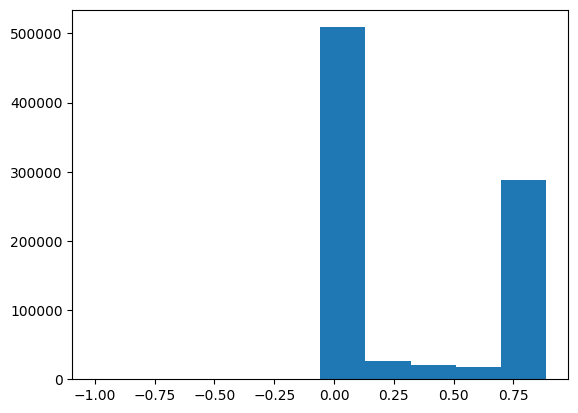

(0.0, 1.0)

In [58]:
plt.hist(df_to_match["SIAMESE_MATCH_SCORE"])
plt.show()
plt.xlim(0,1)


In [0]:
'''
import tensorflow
from keras_preprocessing.sequence import pad_sequences
# loading Siamese model object
folder_path =  dataiku.Folder("Name Screening notebooks").get_path()
model_path=os.path.join(folder_path,"mixed_val_loss_ind.hdf5")
model_object=tensorflow.keras.models.load_model(model_path,compile=False)

def score_generation(x,y):
    if x=="" or y=="":
        return -1
    else:
        sequences_names_cust=tk.texts_to_sequences([x])
        sequences_names_wl=tk.texts_to_sequences([y])
        cust_pad_names = pad_sequences(sequences_names_cust, maxlen=max_len, padding='post')
        wl_pad_names = pad_sequences(sequences_names_wl, maxlen=max_len, padding='post')
        cust_pad_names = np.array(cust_pad_names)
        wl_pad_names = np.array(wl_pad_names)
        return model_object.predict([cust_pad_names,wl_pad_names])[0][0]

df_to_match.loc[:,["ALL_PARTY_NAMES","ALL_WL_NAMES"]].head()

df_to_match["ORGINAL_NAME_MATCH_SCORE"]=df_to_match[["PARTY_NAMES","WL_NAMES"]].apply(lambda x:score_generation(x[0],x[1]),axis=1)
#df_to_match["ALIAS_MATCH_SCORE"]=df_to_match.loc[:,["ALL_ALIAS_NAMES","WL_NAMES"]].apply(lambda x:max([score_generation(i,j) for i in x[0] for j in x[1]]),axis=1)

#df_to_match["FINAL_NAME_MATCH_SCORE"]=df_to_match[["ORGINAL_NAME_MATCH_SCORE","ALIAS_MATCH_SCORE"]].apply(lambda x: max(x[0],x[1]),axis=1)
'''


### Fuzzy logics

In [60]:
'''
from Fuzzy_logics import graph,soundex_encoding,soundex_lev,soundex_dlev,soundex_lcs,soundex_bigram,\
meta_encode,meta_lev,meta_dlev,metaphone_lcs,metaphone_mlipns,metaphone_strcmp95,metaphone_bisim,\
nysiis_encoding,nysiis_lev,mra,nysiis_dlev,nysiis_lcs,nysiis_bisim,\
nysiis_mlipns,nysiis_strcmp95,\
mra_lev,mra_dlev,mra_bisim,\
phonex_encoding,phonex_lev,phonex_dlev,phonex_lcs,phonex_bisim,\
saps_df,lig_df
'''
from abydos.distance import (IterativeSubString, BISIM, DiscountedLevenshtein, Prefix, LCSseq, MLIPNS, Strcmp95,Levenshtein,
MRA, Editex, SAPS, FlexMetric, JaroWinkler, HigueraMico, Sift4, Eudex, ALINE, Covington, PhoneticEditDistance,SmithWaterman,LIG3)
import jellyfish
from abydos.phonetic import PSHPSoundexFirst, Ainsworth, Phonex , Metaphone
bisim = BISIM() 
pe = Phonex()
ae=Ainsworth()

In [61]:
# NYSIIS
def nysiis_encoding(df):
    df["PARTY_NAMES_nysiis_encode"]=df["PARTY_NAMES"].apply(lambda x: jellyfish.nysiis(x))
    df["WL_NAMES_nysiis_encode"]=df["WL_NAMES"].apply(lambda x: jellyfish.nysiis(x))
    return df
def nysiis_bisim(df):
    return df[["PARTY_NAMES_nysiis_encode","WL_NAMES_nysiis_encode"]].apply(lambda x: bisim.sim(x[0],x[1]),axis=1).values
df_to_match=nysiis_encoding(df_to_match)

# NYSIIS +  BISIM
df_to_match["Final_Nysiis_bisim_score"]=nysiis_bisim(df_to_match)
df_to_match["Final_Nysiis_bisim_score"]=df_to_match[["Final_Nysiis_bisim_score","PARTY_NAMES","WL_NAMES"]].apply(lambda x: -1 if x[1]=="" or x[2]=="" else x[0],axis=1 )

In [0]:
# # Phonex + Bisim
# def phonex_encoding(df):
#     df["PARTY_NAMES_pe_encode"]=df["PARTY_NAMES"].apply(lambda x: pe.encode(x))
#     df["WL_NAMES_pe_encode"]=df["WL_NAMES"].apply(lambda x: pe.encode(x))
#     return df
# def phonex_bisim(df):
#     return df[["PARTY_NAMES_pe_encode","WL_NAMES_pe_encode"]].apply(lambda x: bisim.sim(x[0],x[1]),axis=1).values


# df_to_match=phonex_encoding(df_to_match)
# df_to_match["Final_Phonex_bisim_score"] = phonex_bisim(df_to_match)


In [62]:
print(df_to_match["Final_Nysiis_bisim_score"].unique())
# print(df_to_match["Final_Phonex_bisim_score"].unique())
#print(df_to_match["Final_Ainsworth_bisim_score"].unique())

[ 1.          0.86363636  0.9         0.88095238  0.55882353  0.53125
  0.85        0.96666667  0.76923077  0.875       0.59090909  0.89473684
  0.9375      0.66666667  0.7         0.95652174  0.89285714  0.775
  0.85416667  0.90909091  0.88461538  0.63636364  0.42857143  0.33333333
  0.91304348  0.47619048  0.75        0.54166667  0.85714286  0.73333333
  0.69565217  0.52272727  0.67391304  0.68181818  0.40909091  0.71428571
  0.72727273  0.84375     0.78571429  0.84615385  0.41666667  0.47368421
  0.425       0.8         0.61764706  0.54761905  0.94444444  0.94230769
  0.88888889  0.91666667  0.86842105  0.68518519  0.70833333  0.67857143
  0.44444444  0.73809524  0.32692308  0.79545455  0.69642857  0.85185185
  0.76190476  0.57142857  0.65384615  0.42307692  0.71052632  0.83333333
  0.79166667  0.94736842  0.94117647  0.76470588  0.53448276  0.35
  0.890625    0.81818182  0.80769231  0.5         0.47058824  0.86111111
  0.94642857  0.38235294  0.625       0.96428571  0.96296296  0.9

In [0]:
df_to_match.columns

In [63]:
df_to_match2=df_to_match.copy()
#df_to_match=df_to_match2.copy()


In [64]:
df_to_match=df_to_match[['N_PARTY_WATCHLIST_MATCH_ID','ALL_ALIAS_NAMES', 'ALL_PARTY_NAMES', 'ALL_WL_NAMES',"PARTY_NAMES","WL_NAMES","SIAMESE_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
#df_to_match[[ 'Final_Nysiis_bisim_score', 'Final_Phonex_bisim_score']]

In [0]:
#df_to_match[[ 'Final_Nysiis_bisim_score', 'Final_Phonex_bisim_score']].corr()

## Data Integration

In [0]:
# path_csv=os.path.join(folder_path,"DOB_results.csv")
# df_new_dob=pd.read_csv(path_csv)

In [65]:
df=pd.merge(df_DOB_2,df_id[['N_PARTY_WATCHLIST_MATCH_ID','ID_score','al_wl_ids', 'cust_id_all_sp_accom', 'trans_agg_v_id_type', 'score1']],how="left",on="N_PARTY_WATCHLIST_MATCH_ID")

In [66]:
df=pd.merge(df,df_to_match,how='left',on="N_PARTY_WATCHLIST_MATCH_ID")

In [67]:
df["V_RESOLUTION"]=df["V_RESOLUTION"].apply(lambda x: 1 if x in ["TH","THNM"] else 0)
df.shape

(862303, 150)

In [0]:
df.columns

In [68]:
df_2=df[df["SIAMESE_MATCH_SCORE"]!=-1].copy()

In [69]:
df_2.columns

Index(['index', 'N_PARTY_WATCHLIST_MATCH_ID', 'V_UCIF_ID', 'V_SCREENING_ID', 'N_WATCHLIST_PROFILE_ID', 'N_MATCH_SCORE', 'V_WATCHLIST_PARTY_NAME', 'V_INFO_SOURCE', 'V_WL_STATUS_CODE', 'D_DT_OF_SCREENING',
       ...
       'cust_id_all_sp_accom', 'trans_agg_v_id_type', 'score1', 'ALL_ALIAS_NAMES', 'ALL_PARTY_NAMES', 'ALL_WL_NAMES', 'PARTY_NAMES', 'WL_NAMES', 'SIAMESE_MATCH_SCORE', 'Final_Nysiis_bisim_score'], dtype='object', length=150)

In [70]:
df[["V_CITIZENSHIP","V_DUAL_CITIZENSHIP","V_NATIONALITY","V_GENDER","V_GENDER_WL"]]

,V_CITIZENSHIP,V_DUAL_CITIZENSHIP,V_NATIONALITY,V_GENDER,V_GENDER_WL
0,PHL,NaN,PHILIPPINES,F,F
1,MYS,NaN,MALAYSIA,M,M
2,MYS,NaN,MALAYSIA,M,M
3,MYS,NaN,MALAYSIA,M,M
4,MYS,NaN,MALAYSIA,M,M
...,...,...,...,...,...
862298,CHN,NaN,CHINA,M,U
862299,MYS,NaN,MALAYSIA,M,M
862300,MYS,NaN,MALAYSIA,M,M
862301,BGD,NaN,BANGLADESH,M,M


In [71]:
df.columns[df.columns.str.contains("GENDER")]

Index(['V_GENDER', 'V_GENDER_WL'], dtype='object')

In [0]:
# FH alerts with comments not sounding similiar
df_2["V_COMMENTS"]=df_2["V_COMMENTS"].apply(lambda x: "" if pd.isna(x) else x)
patt_4=re.compile("not sounds similar|not sound similar",re.IGNORECASE)
print("theb FP alerts with comments not sounding similiar",df_2[df_2["V_COMMENTS"].str.contains(patt_4)].shape)
df_sound=df_2[df_2["V_COMMENTS"].str.contains(patt_4)]

plt.hist(df_sound["Final_Nysiis_bisim_score"])
plt.show()

In [0]:
df_s=df_sound[["N_PARTY_WATCHLIST_MATCH_ID","ALL_PARTY_NAMES","ALL_WL_NAMES","PARTY_NAMES","WL_NAMES","ALL_ALIAS_NAMES","V_COMMENTS","SIAMESE_MATCH_SCORE","N_MATCH_SCORE","Final_Nysiis_bisim_score"]]
path_of_not_sounding_simliar=os.path.join(folder_path,"df_sounding_not_similiar.csv")
df_s.to_csv(path_of_not_sounding_simliar)

In [0]:
df_s=df_sound[["N_PARTY_WATCHLIST_MATCH_ID","ALL_PARTY_NAMES","ALL_WL_NAMES","PARTY_NAMES","WL_NAMES","ALL_ALIAS_NAMES","V_COMMENTS","Final_Nysiis_bisim_score"]]
#path_of_not_sounding_simliar=os.path.join(folder_path,"df_sounding_not_similiar.csv")
#df_s.to_csv(path_of_not_sounding_simliar)

## Model Development

In [72]:
df_train=df.copy()
print("shape of train dataset",df_train.shape)

shape of train dataset (862303, 150)


In [73]:
df.columns

Index(['index', 'N_PARTY_WATCHLIST_MATCH_ID', 'V_UCIF_ID', 'V_SCREENING_ID', 'N_WATCHLIST_PROFILE_ID', 'N_MATCH_SCORE', 'V_WATCHLIST_PARTY_NAME', 'V_INFO_SOURCE', 'V_WL_STATUS_CODE', 'D_DT_OF_SCREENING',
       ...
       'cust_id_all_sp_accom', 'trans_agg_v_id_type', 'score1', 'ALL_ALIAS_NAMES', 'ALL_PARTY_NAMES', 'ALL_WL_NAMES', 'PARTY_NAMES', 'WL_NAMES', 'SIAMESE_MATCH_SCORE', 'Final_Nysiis_bisim_score'], dtype='object', length=150)

In [74]:
df_train[df_train["SIAMESE_MATCH_SCORE"]==-1][["PARTY_NAMES","WL_NAMES"]].shape

(15, 2)

In [75]:
df_train=df_train[df_train["SIAMESE_MATCH_SCORE"]!=-1]

In [76]:
df_train=df_train[(df_train["FINAL_DOB_MATCH"]!= -1) | (df_train["ID_score"]!=-1) ]

In [77]:
df_train["V_RESOLUTION"].unique()

array([1, 0])

In [78]:
val_counts=df_train["V_RESOLUTION"].value_counts()
df_train["V_RESOLUTION"].value_counts()

0    525017
1    110533
Name: V_RESOLUTION, dtype: int64

### Check for imbalance

In [79]:
print("counts of alerts with resolution 0 in train %",df_train["V_RESOLUTION"].value_counts().loc[0]/df_train["V_RESOLUTION"].shape[0])
print("counts of alerts with resolution 1 in train %",df_train["V_RESOLUTION"].value_counts().loc[1]/df_train["V_RESOLUTION"].shape[0])

counts of alerts with resolution 0 in train % 0.8260829203052474
counts of alerts with resolution 1 in train % 0.17391707969475256


 So this is moderately imbalanced , hence no need of doing anything against this imbalancing

### Train-test split

In [30]:
from sklearn.model_selection import train_test_split
X_train=df_train[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
y_train=df_train["V_RESOLUTION"]

In [81]:
df_train["V_RESOLUTION"].value_counts()

0    525017
1    110533
Name: V_RESOLUTION, dtype: int64

In [83]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()

train_dataset_path_data_enhanced=os.path.join(folder_path,"Final_training_dataset_3_till_oct.csv")
df_train.to_csv(train_dataset_path_data_enhanced) 
#did after including prediction , search for Final_training_dataset_2_data_enh

In [29]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()

train_dataset_path_data_enhanced=os.path.join(folder_path,"Final_training_dataset_3_till_oct.csv")
df_train=pd.read_csv(train_dataset_path_data_enhanced)
#df_train["V_RESOLUTION"]=df_train["V_RESOLUTION"].apply(lambda x: 1 if x in ["TH","THNM"] else 0)

In [6]:
df_train["V_RESOLUTION"].value_counts()

0    296864
1    107300
Name: V_RESOLUTION, dtype: int64

In [7]:
df_train[(df_train["FINAL_DOB_MATCH"]== -1) & (df_train["ID_score"]==-1) ][["V_RESOLUTION","V_COMMENTS","Final_Nysiis_bisim_score"]]

,V_RESOLUTION,V_COMMENTS,Final_Nysiis_bisim_score


In [110]:
# path_of_csv=os.path.join(folder_path,"comments_where_id_dob_absent.csv")
# df_train[(df_train["FINAL_DOB_MATCH"]== -1) & (df_train["ID_score"]==-1) & (df_train["Final_Nysiis_bisim_score"]<=0.75) ]["V_COMMENTS"].value_counts().to_csv(path_of_csv)

In [111]:
# df_train[(df_train["FINAL_DOB_MATCH"]== -1) & (df_train["ID_score"]==-1) & (df_train["Final_Nysiis_bisim_score"]<=0.75) ].shape

In [84]:
X_unseen=df_test[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
#df_test["V_RESOLUTION"]=df_test["V_RESOLUTION"].apply(lambda x:1 if x in ["TH","THNM"] else 0)
y_unseen=df_test["V_RESOLUTION"]

In [0]:
#X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.15,random_state=9)

In [0]:
df_test["V_RESOLUTION"].value_counts()

### Classification model

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
#import lightgbm
import catboost
#from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix,f1_score,classification_report,precision_score,recall_score,roc_curve,roc_auc_score

Overall the metric to be checked is f-1 score for target value 1 becoz we need to keep good accuracy on both resolutions.But specifically to analyze how many fp have been reduced we need to see
the precision for target variable 1 (maximizing precision for target var 1 is equivalent to maximzing recall for target value 0).


In [0]:
'''
classifier_SVM = SVC(kernel='rbf',random_state=0)
classifier_SVM.fit(X_train,y_train)
y_predict_train=classifier_SVM.predict(X_train)
y_predict=classifier_SVM.predict(X_test)
y_predict_2=classifier_SVM.predict(X_test_2)
print("results from SVM model, Train data ")
print(classification_report(y_train,y_predict_train))
print("results from SVM model,  Test data")
print(classification_report(y_test,y_predict))
print("results from SVM model, Unseen data")
print(classification_report(y_test_2,y_predict_2))
score=cross_val_score(classifier_SVM,X_train,y_train,cv=5,scoring='f1_macro')
print("cross_val_f1_score meand & std. deviation",score.mean(),score.std())
results["SVM"]=f1_score(y_test_2,y_predict_2)
'''

### Model function

In [86]:
results={}


for model_name in ["LG","Random forest","LightGBM","XG Boost"]:
    if model_name=="LG":
        classifier_lg=LogisticRegression(class_weight="balanced",random_state=0)
        classifier_lg.fit(X_train,y_train)
        y_predict_train=classifier_lg.predict(X_train)
       # y_predict=classifier_lg.predict(X_test)
        y_predict_2=classifier_lg.predict(X_unseen)
        print("results from Logistic Regression model on train data")
        print(classification_report(y_train,y_predict_train))
       # print("results from Logistic Regression model on test data")
       # print(classification_report(y_train,y_predict_train))
        print("results from Logistic Regression model on Unseen data")
        print(classification_report(y_unseen,y_predict_2))
     #   score=cross_val_score(classifier_lg,X_train,y_train,cv=5,scoring='f1')
     #   print("cross_val_f1_score meand & std. deviation",score.mean(),score.std())
     #   results["LG"]=f1_score(y_unseen,y_predict_2)   
#     if model_name=="LightGBM":
#         classifier_lgbm=LGBMClassifier(random_state=1,verbose_eval=False)
#         classifier_lgbm.fit(X_train,y_train)
#         y_predict_train=classifier_lgbm.predict(X_train)
#        # y_predict=classifier_lgbm.predict(X_test)
#         y_predict_2=classifier_lgbm.predict(X_unseen)
#         print("results from LightGBM model, Train data ")
#         print(classification_report(y_train,y_predict_train))
#     #    print("results from LightGBM model,  Test data")
#     #    print(classification_report(y_test,y_predict))
#         print("results from LightGBM model, Unseen data")
#         print(classification_report(y_unseen,y_predict_2))
#    #      score=cross_val_score(classifier_lgbm,X_train,y_train,cv=5,scoring='f1')
#    #     print("cross_val_f1_score meand & std. deviation",score.mean(),score.std())
#    #     results["LightGBM"]=f1_score(y_unseen,y_predict_2)        
    elif model_name =="Random forest":
        # Random forest 

        classifier_RF=RandomForestClassifier(max_features=None,random_state=0)
        classifier_RF.fit(X_train, y_train)
        y_predict_train=classifier_RF.predict(X_train)
        #y_predict=classifier_RF.predict(X_test)
        y_predict_2=classifier_RF.predict(X_unseen)
        print("results from RF model, Train data ")
        print(classification_report(y_train,y_predict_train))
   #     print("results from RF model,  Test data")
   #     print(classification_report(y_test,y_predict))
        print("results from RF model, Unseen data")
        print(classification_report(y_unseen,y_predict_2))
   #     score=cross_val_score(classifier_RF,X_train,y_train,cv=5,scoring='f1_macro')
   #     print("cross_val_f1_score meand & std. deviation",score.mean(),score.std())
   #     results["RF"]=f1_score(y_unseen,y_predict_2)
       
    # XGBoost
    elif model_name=="XG Boost":
        classifier_XGB = xgb.XGBClassifier(random_state=0)
        classifier_XGB.fit(X_train, y_train)
        y_predict_train=classifier_XGB.predict(X_train)
        #y_predict=classifier_XGB.predict(X_test)
        y_predict_2=classifier_XGB.predict(X_unseen)
        print("Results from XGBoost model, Train data ")
        print(classification_report(y_train,y_predict_train))
  #      print("results from XG Boost model,  Test data")
  #      print(classification_report(y_test,y_predict))
        print("results from XG Boost model, Unseen data")
        print(classification_report(y_unseen,y_predict_2))
  #     score=cross_val_score(classifier_XGB,X_train,y_train,cv=5,scoring='f1')
  #      print("cross_val_f1_score meand & std. deviation",score.mean(),score.std())        
  #      results["XGBoost"]=f1_score(y_unseen,y_predict_2)
        



results from Logistic Regression model on train data
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    525017
           1       0.94      0.97      0.96    110533

    accuracy                           0.98    635550
   macro avg       0.97      0.98      0.97    635550
weighted avg       0.98      0.98      0.98    635550

results from Logistic Regression model on Unseen data
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      9216
           1       0.95      0.57      0.71       784

    accuracy                           0.96     10000
   macro avg       0.96      0.79      0.85     10000
weighted avg       0.96      0.96      0.96     10000

results from RF model, Train data 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    525017
           1       1.00      0.98      0.99    110533

    accuracy                           1

In [0]:
X_train

In [0]:
'''
# LightGBM
predicted_proba=classifier_lgbm.predict_proba(X_train)
FPR, TPR, proba = roc_curve(y_train, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict["LightGBM"]=optimal_proba_cutoff
roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in classifier_lgbm.predict_proba(X_test)[:, -1]]
print(classification_report(y_test,roc_predictions))
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_train, predicted_proba[:, -1])}") # plot random curve
plt.plot(false_pos_rate, true_pos_rate, marker=".")
plt.title("LightGBM ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()

# Adaboost
predicted_proba=classifier_ada.predict_proba(X_train)
FPR, TPR, proba = roc_curve(y_train, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict["Adaboost"]=optimal_proba_cutoff
roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in classifier_lgbm.predict_proba(X_test)[:, -1]]
print(classification_report(y_test,roc_predictions))
predicted_proba=classifier_ada.predict_proba(X_train)
FPR, TPR, thres = roc_curve(y_train, predicted_proba[:, -1])
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_train, predicted_proba[:, -1])}") # plot random curve
plt.plot(false_pos_rate, true_pos_rate, marker=".")
plt.title("Adaboost ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()



#CatBoost 
predicted_proba=classifier_cat.predict_proba(X_train)
FPR, TPR, thres = roc_curve(y_train, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict["CatBoost"]=optimal_proba_cutoff
roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in classifier_lgbm.predict_proba(X_test)[:, -1]]
print(classification_report(y_test,roc_predictions))


plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_train, predicted_proba[:, -1])}") # plot random curve
plt.plot(false_pos_rate, true_pos_rate, marker=".")
plt.title("CatBoost ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()
'''

In [87]:
#Nueral Networks
import tensorflow as tf

In [88]:
X_train.info()
y_train=df_train["V_RESOLUTION"].astype(float)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 635550 entries, 0 to 862302
Data columns (total 5 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   FINAL_DOB_MATCH           635550 non-null  float64
 1   ID_score                  635550 non-null  float64
 2   SIAMESE_MATCH_SCORE       635550 non-null  float64
 3   N_MATCH_SCORE             635550 non-null  float64
 4   Final_Nysiis_bisim_score  635550 non-null  float64
dtypes: float64(5)
memory usage: 29.1 MB


In [89]:
X_2,X_val,y_2,y_val=train_test_split(X_train,y_train,test_size=0.2,random_state=1)

In [90]:
from tensorflow.keras.callbacks import (ModelCheckpoint, TensorBoard, ReduceLROnPlateau,
                                        CSVLogger, EarlyStopping)
folder_path=dataiku.Folder("Name Screening notebooks").get_path()

In [0]:

ann=tf.keras.models.Sequential()
# hidden layers-2 with 6 neurons
ann.add(tf.keras.layers.Dense(units=6,activation="relu"))
ann.add(tf.keras.layers.Dense(units=6,activation="relu"))

# output layer
ann.add(tf.keras.layers.Dense(units=1,activation="sigmoid"))

# compile
ann.compile( optimizer="adam",loss=tf.keras.losses.BinaryCrossentropy(),metrics=[tf.keras.metrics.F1Score(),tf.keras.metrics.Precision(),tf.keras.metrics.Recall()])

keras_callbacks   = [\
      EarlyStopping(monitor='val_loss', min_delta =0.01, patience=25, mode='min'),\
      ReduceLROnPlateau(monitor='val_loss', factor=0.75,patience=10, min_lr=0.000001),\
      ModelCheckpoint(filepath=os.path.join(folder_path,"nn_challenger_model.hdf5"),
                      monitor='val_loss',
                      verbose=1, 
                      save_best_only=True,
                      save_weights_only=False,
                      mode='min',
                      )]

ann.fit(X_2,y_2,batch_size=30,epochs=10,class_weight={0:0.4,1:0.6},validation_data=(X_val,y_val))

In [0]:
print("Classification report on train dataset  using NN")
y_predict_train=[1 if i>0.5 else 0 for i in ann.predict(X_train)]
print(classification_report(y_train,y_predict_train))
print("Classification report on test dataset using NN")
y_predict=[1 if i>0.5 else 0 for i in ann.predict(X_unseen)]
print(classification_report(y_unseen,y_predict))

In [0]:
# how to overcome overfitting -  addition of drop-out layer, weights & parameter regularizer -  keras_regualrizer
# Bayesian optimization

import keras_tuner

def build_model(hp):
    ann_2=tf.keras.models.Sequential()
    # hidden layers-2 with 6 neurons
    unit_val=hp.Choice("units",values=[4,5,6])
    ann_2.add(tf.keras.layers.Dense(units=unit_val,activation="relu",kernel_regularizer='l1_l2'))
    ann_2.add(tf.keras.layers.Dense(units=unit_val,activation="relu"))
    ann_2.add(tf.keras.layers.Dropout(0.2))
    # output layer
    ann_2.add(tf.keras.layers.Dense(units=1,activation="sigmoid"))
    learning_rate_val=hp.Choice("learning_rate",values=[1e-2, 1e-3, 1e-4])
    # compile
    ann_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate_val),loss=tf.keras.losses.BinaryCrossentropy(),metrics=[tf.keras.metrics.F1Score(),tf.keras.metrics.Precision(),tf.keras.metrics.Recall()])
    return ann_2


In [0]:
X_2,X_val,y_2,y_val=train_test_split(X_train,y_train,test_size=0.2,random_state=1)

In [0]:
tuner=keras_tuner.BayesianOptimization(build_model,objective='val_loss',max_trials=5)
tuner.search(X_2,y_2,epochs=5,validation_data=(X_val,y_val))


In [0]:
model=build_model(tuner.get_best_hyperparameters()[0])
history=model.fit(X_2,y_2,callbacks=keras_callbacks,class_weight={0:0.4,1:0.6},validation_data=(X_val,y_val),epochs=10,batch_size=32)

In [0]:
from tensorflow.keras.callbacks import History
import matplotlib.pyplot as plt 
history.params
history.history.keys()
plt.plot(history.history["val_loss"],label="Val_loss")
plt.plot(history.history["loss"],label="Train_loss")
plt.xlabel("epochs")
plt.ylabel("loss_measure")
plt.legend()
plt.show()

In [0]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
model_path_2=os.path.join(folder_path,"nn_challenger_model.hdf5")
model=tf.keras.models.load_model(model_path_2,compile=False)

In [0]:

print("Classification report on train dataset  using NN")
y_predict_train=[1 if i>0.5 else 0 for i in model.predict(X_train)]
print(classification_report(y_train,y_predict_train))
print("Classification report on test dataset using NN")
y_predict=[1 if i>0.5 else 0 for i in model.predict(X_unseen)]
print(classification_report(y_unseen,y_predict))

In [0]:
# ROC curve on neural network
from sklearn.metrics import roc_curve
y_pred_nn=model.predict(X_2)
FPR,TPR,thresh=roc_curve(y_2,y_pred_nn)
optimal_proba_cutoff_nn=sorted(list(zip(np.abs(TPR-FPR),thresh)),key=lambda i: i[0],reverse=True)[0][1]
print("opt_thresh_prob",optimal_proba_cutoff_nn)

#print(classification_report(y_test,roc_predictions))
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_2, y_pred_nn)}") # plot random curve

plt.plot(FPR, TPR, marker=".")
plt.title("NN ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()

In [0]:
# Results from NN after tuning & using optimal threshold on unseen data - will discard it from choosing a champion model
y_unseen_pred=[1 if i>optimal_proba_cutoff_nn else 0 for i in model.predict(X_unseen)]
print(classification_report(y_unseen,y_unseen_pred))
y_pred_train=[1 if i>optimal_proba_cutoff_nn else 0 for i in model.predict(X_train)]
print(classification_report(y_train,y_pred_train))

### Hyperparameter tuning

In [93]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

In [94]:
from sklearn.model_selection import GridSearchCV

In [0]:
#Logistic Regression
classifier_lg=LogisticRegression(random_state=0)
print(classifier_lg.get_params())
params=[{"solver":["lbfgs", "liblinear", "newton-c  g"],"class_weight":["balanced",{0:0.4,1:0.6}],"penalty":["l1","l2","elasticnet"]}]

cv_grid_lg=GridSearchCV(classifier_lg,param_grid=params,scoring="f1",cv=10,n_jobs=-1)
cv_grid_lg.fit(X_train,y_train)


In [0]:
# Randaom Forest
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
#'criterion':['gini','entropy']
#"max_depth":[4,5,6],"class_weight":["balanced",{0:0.40,1:0.6}]
classifier_RF=RandomForestClassifier()
print(classifier_RF.get_params())
params=[{"n_estimators":[100,200],"min_samples_split":[3,4,5],"max_features":[None]}]
cv_grid_rf=GridSearchCV(classifier_RF,param_grid=params,scoring="f1",n_jobs=-1,cv=5)
cv_grid_rf.fit(X_train,y_train)


In [95]:
# XGboost
from xgboost import XGBClassifier
classifier_XGB=XGBClassifier()
params=[{"n_estimators":[50,75,100],"max_depth":[3,4,5,6],"learning_rate":[0.001,0.01,0.1],'reg_alpha':[1,5,10],'reg_lambda':[0,5,10],"class_weight":["balanced",{0:0.4,1:0.6}]}]
cv_grid_xgb=GridSearchCV(classifier_XGB,param_grid=params,scoring="f1",cv=10,n_jobs=-1)


In [96]:
cv_grid_xgb.fit(X_train,y_train)
print(cv_grid_xgb.best_score_,cv_grid_xgb.best_params_)

0.9826930749006306 {'class_weight': 'balanced', 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 75, 'reg_alpha': 1, 'reg_lambda': 5}


In [0]:
# # Light GBM
# from sklearn.model_selection import GridSearchCV

# from lightgbm import LGBMClassifier

# # '''
# classifier_lgbm=LGBMClassifier()
# #,"learning_rate":[0.1,0.001,0.005]
# #"reg_alpha":[0,1,5],"reg_lambda":[1,5]
# params=[{"boosting_type":["goss"], "n_estimators":[50,75,100],"max_depth":[4,5,6],\
# "class_weight":["balanced",{1:0.6,0:0.4}]}]
# cv_grid_lgbm=GridSearchCV(classifier_lgbm,param_grid=params,scoring="f1",n_jobs=-1,cv=10)
# cv_grid_lgbm.fit(X_train,y_train)
# print(cv_grid_lgbm.best_score_,cv_grid_lgbm.best_params_)


### Re-training

In [0]:
cv_grid_lg.best_params_

In [0]:
# Logistic
print(list(cv_grid_lg.best_params_.values()))
classifier_lg=LogisticRegression(**cv_grid_lg.best_params_)
classifier_lg.fit(X_train,y_train)

In [0]:
classifier_lg.predict(X_unseen)
y_unseen

In [0]:
from sklearn.metrics import classification_report
print(classification_report(y_train,classifier_lg.predict(X_train)))
print(classification_report(y_unseen,classifier_lg.predict(X_unseen)))

In [0]:
# Saving_model object LG
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
file_path = os.path.join(folder_path,'Logistic_model_tuned_data_enh.sav')
pickle.dump(classifier_lg, open(file_path, 'wb'))
 

In [0]:
# Random forest
classifier_RF=RandomForestClassifier(**cv_grid_rf.best_params_)
classifier_RF.fit(X_train,y_train)

In [0]:
print(classification_report(y_train,classifier_RF.predict(X_train)))
print(classification_report(y_unseen,classifier_RF.predict(X_unseen)))

In [0]:
# Saving_model object RF
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
file_path = os.path.join(folder_path,'Random_forest_tuned_data_enh.sav')
pickle.dump(classifier_RF, open(file_path, 'wb'))

In [97]:
# XGBoost
cv_grid_xgb.best_params_={'class_weight': 'balanced', 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 75, 'reg_alpha': 5, 'reg_lambda': 0}
re_xgb=XGBClassifier(**cv_grid_xgb.best_params_)
re_xgb.fit(X_train,y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              class_weight='balanced', colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=75, n_jobs=None,
              num_parallel_tree=None, ...)

In [98]:
print(classification_report(y_train,re_xgb.predict(X_train)))
print(classification_report(y_unseen,re_xgb.predict(X_unseen)))

              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00    525017
         1.0       0.99      0.97      0.98    110533

    accuracy                           0.99    635550
   macro avg       0.99      0.99      0.99    635550
weighted avg       0.99      0.99      0.99    635550

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      9216
           1       0.99      0.58      0.73       784

    accuracy                           0.97     10000
   macro avg       0.98      0.79      0.86     10000
weighted avg       0.97      0.97      0.96     10000



In [99]:
# Saving_model object XGB
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
file_path = os.path.join(folder_path,'Classifier_xgb_tuned_data_enh.sav')
pickle.dump(re_xgb, open(file_path, 'wb'))

In [0]:
# #lightgbm
# classifier_lgbm=LGBMClassifier(random_state=1,verbose_eval=False)
# classifier_lgbm.fit(X_train,y_train)
'''
classifier_lgbm=LGBMClassifier(**cv_grid_lgbm.best_params_)
classifier_lgbm.fit(X_train,y_train)
'''

In [0]:
# print(classification_report(y_train,classifier_lgbm.predict(X_train)))
# print(classification_report(y_unseen,classifier_lgbm.predict(X_unseen)))

In [0]:
# # Saving_model object LGBM
# folder_path=dataiku.Folder("Name Screening notebooks").get_path()
# file_path = os.path.join(folder_path,'Light_GBM_tuned_data_enh.sav')
# pickle.dump(classifier_lgbm, open(file_path, 'wb'))

### Prediction on Train

In [0]:
# model prediction
df_train["V_PREDICTION"]=re_xgb.predict(X_train)

In [0]:
# train_dataset_path_2=os.path.join(folder_path,"Final_training_dataset_2_data_enh.csv")
# df_train.to_csv(train_dataset_path_2)

In [0]:
df_train.shape

### ROC curve

In [100]:
thresh_dict={}

In [0]:

# Logistic Regression
predicted_proba=classifier_lg.predict_proba(X_unseen)
FPR, TPR, proba = roc_curve(y_unseen, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict["LG"]=optimal_proba_cutoff
roc_predictions = [1 if i >= optimal_proba_cutoff else 0 for i in classifier_lg.predict_proba(X_unseen)[:, -1]]
print("LG threshold :", optimal_proba_cutoff)
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_unseen, predicted_proba[:, -1])}") # plot random curve
plt.plot(FPR, TPR, marker=".")
plt.title("LG ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()


#Random forest
predicted_proba=classifier_RF.predict_proba(X_unseen)
FPR, TPR, thres = roc_curve(y_unseen, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict["Random forest"]=optimal_proba_cutoff

print("RF threshold :", optimal_proba_cutoff)
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_unseen, predicted_proba[:, -1])}") # plot random curve
plt.plot(FPR, TPR, marker=".")
plt.title("Random Forest ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()
# # LightGBM
# predicted_proba=classifier_lgbm.predict_proba(X_unseen)
# FPR, TPR, proba = roc_curve(y_unseen, predicted_proba[:, -1])
# optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
# thresh_dict["LightGBM"]=optimal_proba_cutoff
# print("Light GBM :", optimal_proba_cutoff)
# plt.figure()
# plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_unseen, predicted_proba[:, -1])}") # plot random curve
# plt.plot(FPR,TPR, marker=".")
# plt.title("LightGBM ROC Curve")
# plt.ylabel("True Positive Rate")
# plt.xlabel("False Positive Rate")
# plt.legend(loc="lower right")
# plt.show()





XG Boost threshold : 0.01669321


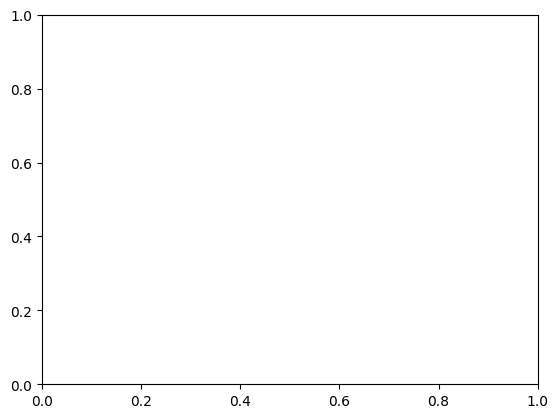

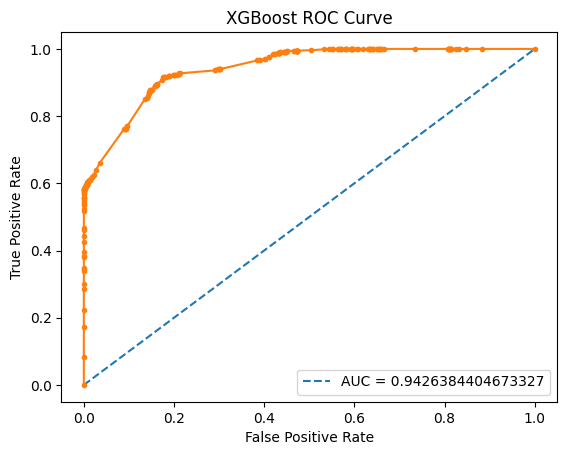

In [102]:
#XG Boost
predicted_proba=re_xgb.predict_proba(X_unseen)
FPR, TPR, proba = roc_curve(y_unseen, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict["XG Boost"]=optimal_proba_cutoff
print("XG Boost threshold :", optimal_proba_cutoff)
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_unseen, predicted_proba[:, -1])}") # plot random curve
plt.plot(FPR, TPR, marker=".")
plt.title("XGBoost ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()


### PRC curve

In [104]:
from sklearn.metrics import precision_recall_curve,PrecisionRecallDisplay
import matplotlib.pyplot as plt
thres_dict_prc ={}

In [0]:

 

# Logistic Regression
Pre,Rec,th=precision_recall_curve(y_unseen,probas_pred=classifier_lg.predict_proba(X_unseen)[:,-1])
optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
thres_dict_prc["LG"]=optimal_proba_cutoff
print("LG threshold :", optimal_proba_cutoff)
plt.figure()
disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
disp.plot()
#plt.plot(Pre, Rec, marker=".")
#plt.title("LG ROC Curve")
#plt.ylabel("True Positive Rate")
#plt.xlabel("False Positive Rate")
#plt.legend(loc="lower right")
#plt.show()
plt.show()


# Random Forest
Pre,Rec,th=precision_recall_curve(y_unseen,classifier_RF.predict_proba(X_unseen)[:,-1])
optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec), th)), key=lambda i: i[0], reverse=True)[0][1]
thres_dict_prc["RF"]=optimal_proba_cutoff
print("RF threshold :", optimal_proba_cutoff)
plt.figure()
disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
disp.plot()
#plt.plot(Pre, Rec, marker=".")






# # LightGBM
# Pre,Rec,th=precision_recall_curve(y_unseen,probas_pred=classifier_lgbm.predict_proba(X_unseen)[:,-1])
# optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
# thres_dict_prc["LGBM"]=optimal_proba_cutoff
# print("LGBM threshold :", optimal_proba_cutoff)
# plt.figure()
# disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
# disp.plot()
# #plt.plot(Pre, Rec, marker=".")
# plt.show()


XGB threshold : 0.0003363967


<Figure size 640x480 with 0 Axes>

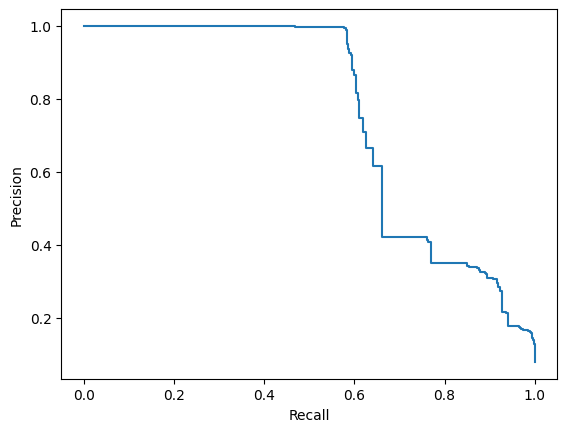

In [105]:
# XGBoost
Pre,Rec,th=precision_recall_curve(y_unseen,probas_pred=re_xgb.predict_proba(X_unseen)[:,-1])
optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
thres_dict_prc["XGB"]=optimal_proba_cutoff
print("XGB threshold :", optimal_proba_cutoff)
plt.figure()
disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
disp.plot()
#plt.plot(Pre, Rec, marker=".")
plt.show()



In [106]:
class model_prob_data_enh_2:
    def __init__(self):
        self.dict=thresh_dict
prob=model_prob_data_enh()
file_path=os.path.join(folder_path,"opt_thres_data_enh_2.sav")
pickle.dump(prob,open(file_path,"wb"))
x=pickle.load(open(file_path,"rb"))

In [107]:
x.dict

{'XG Boost': 0.01669321}

# CHAMPION MODEL SELECTION

In [0]:


print("LG")
y_unseen_pred=[1 if i> thresh_dict["LG"] else 0 for i in  classifier_lg.predict_proba(X_unseen)[:, 1] ]
y_train_pred=[1 if i> thresh_dict["LG"] else 0 for i in  classifier_lg.predict_proba(X_train)[:, 1]]

print(classification_report(y_unseen,y_unseen_pred))
print("RF")
y_unseen_pred=[1 if i> thresh_dict["Random forest"] else 0 for i in  classifier_RF.predict_proba(X_unseen)[:, 1] ]
y_train_pred=[1 if i> thresh_dict["Random forest"] else 0 for i in  classifier_lg.predict_proba(X_train)[:, 1]]


print(classification_report(y_unseen,y_unseen_pred))
# print("LGBM")
# y_unseen_pred=[1 if i> thresh_dict["LightGBM"] else 0 for i in  classifier_lgbm.predict_proba(X_unseen)[:, 1] ]
# y_train_pred=[1 if i> thresh_dict["LightGBM"] else 0 for i in  classifier_lg.predict_proba(X_train)[:, 1]]


# print(classification_report(y_unseen,y_unseen_pred))
print("XGB")
y_unseen_pred=[1 if i> thresh_dict["XG Boost"] else 0 for i in  re_xgb.predict_proba(X_unseen)[:, 1] ]
y_train_pred=[1 if i> thresh_dict["XG Boost"] else 0 for i in  classifier_lg.predict_proba(X_train)[:, 1]]

print(classification_report(y_unseen,y_unseen_pred))




In [108]:
# save the model to disk
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
file_path = os.path.join(folder_path,'finalized_model_(siamese & fuzzy(only_orginal_name)_data_enh.sav')
pickle.dump(re_xgb, open(file_path, 'wb'))
 



# Month Wise model prediction

In [109]:
X_train.columns

Index(['FINAL_DOB_MATCH', 'ID_score', 'SIAMESE_MATCH_SCORE', 'N_MATCH_SCORE', 'Final_Nysiis_bisim_score'], dtype='object')

In [127]:
# # October 

# folder_path=dataiku.Folder("Name Screening notebooks").get_path()
# Unseen_proc_data_path=os.path.join(folder_path,"Unseen_processed_data_enhanced_oct_100_anj_rev.csv")

# df_test_oct=pd.read_csv(Unseen_proc_data_path)
# df_test_oct=df_test_oct[(df_test_oct["FINAL_DOB_MATCH"]!=-1 ) | (df_test_oct["ID_score"]!=-1)]
# X_test=df_test_oct[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
# y_test=df_test_oct["V_RESOLUTION"]

In [129]:
# print(df_test_oct.shape)

(27202, 147)


In [99]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
file_path = os.path.join(folder_path,'finalized_model_(siamese & fuzzy(only_orginal_name)_data_enh.sav')

# load the model from disk
champ_model = pickle.load(open(file_path, 'rb'))

In [0]:

class model_prob_data_enh_2:
    def __init__(self):
        self.dict=thresh_dict
#prob=model_prob_data_enh()
file_path=os.path.join(folder_path,"opt_thres_data_enh_2.sav")
opt=pickle.load(open(file_path,"rb"))
thresh_dict=opt.dict

In [114]:
thresh_dict["XG Boost"]

0.01669321

XGB threshold : 0.00031252851


<Figure size 640x480 with 0 Axes>

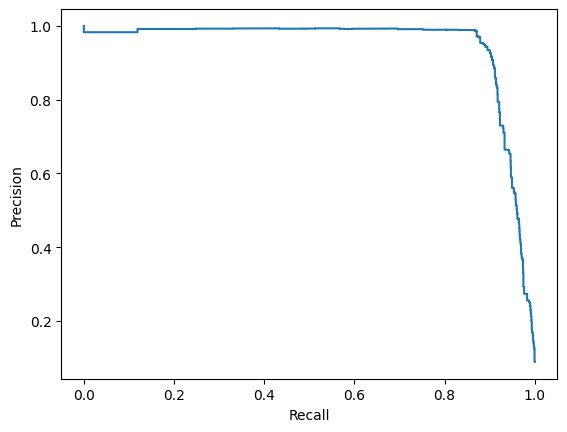

In [130]:
from sklearn.metrics import precision_recall_curve,PrecisionRecallDisplay
import matplotlib.pyplot as plt
thres_dict_prc_2 ={} 

# # Logistic Regression
# Pre,Rec,th=precision_recall_curve(y_unseen,probas_pred=classifier_lg.predict_proba(X_test)[:,-1])
# optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
# thres_dict_prc_2["LG"]=optimal_proba_cutoff
# print("LG threshold :", optimal_proba_cutoff)
# plt.figure()
# disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
# disp.plot()
# #plt.plot(Pre, Rec, marker=".")
# #plt.title("LG ROC Curve")
# #plt.ylabel("True Positive Rate")
# #plt.xlabel("False Positive Rate")
# #plt.legend(loc="lower right")
# #plt.show()
# plt.show()


# # Random Forest
# Pre,Rec,th=precision_recall_curve(y_unseen,classifier_RF.predict_proba(X_test)[:,-1])
# optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec), th)), key=lambda i: i[0], reverse=True)[0][1]
# thres_dict_prc_2["RF"]=optimal_proba_cutoff
# print("RF threshold :", optimal_proba_cutoff)
# plt.figure()
# disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
# disp.plot()
# #plt.plot(Pre, Rec, marker=".")



# XGBoost
Pre,Rec,th=precision_recall_curve(y_test,probas_pred=champ_model.predict_proba(X_test)[:,-1])
optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
thres_dict_prc_2["XGB"]=optimal_proba_cutoff
print("XGB threshold :", optimal_proba_cutoff)
plt.figure()
disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
disp.plot()
#plt.plot(Pre, Rec, marker=".")
plt.show()




# # LightGBM
# Pre,Rec,th=precision_recall_curve(y_unseen,probas_pred=classifier_lgbm.predict_proba(X_test)[:,-1])
# optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
# thres_dict_prc["LGBM"]=optimal_proba_cutoff
# print("LGBM threshold :", optimal_proba_cutoff)
# plt.figure()
# disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
# disp.plot()
# #plt.plot(Pre, Rec, marker=".")
# plt.show()


In [29]:
from sklearn.metrics import precision_recall_curve,PrecisionRecallDisplay

In [133]:
## from sklearn.metrics import classification_report
y_unseen_pred=[1 if i>0.19  else 0 for i in  champ_model.predict_proba(X_test)[:, 1] ]
print(classification_report(y_test,y_unseen_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     24780
           1       0.95      0.89      0.92      2422

    accuracy                           0.99     27202
   macro avg       0.97      0.94      0.96     27202
weighted avg       0.99      0.99      0.99     27202



In [98]:
# November 


folder_path=dataiku.Folder("Name Screening notebooks").get_path()
Unseen_proc_data_path=os.path.join(folder_path,"Unseen_processed_data_enhanced_nov_100_edit_0124.csv")
df_test_nov=pd.read_csv(Unseen_proc_data_path)
df_test_nov=df_test_nov[(df_test_nov["FINAL_DOB_MATCH"]!=-1 ) | (df_test_nov["ID_score"]!=-1)]
print(df_test_nov.shape)
X_test_nov=df_test_nov[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
y_test_nov=df_test_nov["V_RESOLUTION"]

(39969, 147)


In [9]:
# thresh_dict["XG Boost"]

In [7]:
from sklearn.metrics import classification_report
y_unseen_pred=[1 if i>0.19  else 0 for i in  champ_model.predict_proba(X_test_nov)[:, 1] ]
print(classification_report(y_test_nov,y_unseen_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     35616
           1       0.98      0.96      0.97      4353

    accuracy                           0.99     39969
   macro avg       0.99      0.98      0.98     39969
weighted avg       0.99      0.99      0.99     39969



In [24]:
champ_model.predict_proba(X_test_nov.iloc[0:1,:]).flatten()[0]

0.9920578

In [26]:
df_test_nov["V_PREDICTION"]=[1 if i> 0.19 else 0 for i in  champ_model.predict_proba(X_test_nov)[:,1]]
#df_test_nov["AI_Match_score"]=[champ_model.predict_proba(X_test_nov.iloc[i:i+1,:]).flatten()[1] if df_test_nov.loc[i,"V_PREDICTION"]==1 else champ_model.predict_proba(X_test_nov.iloc[i:i+1,:]).flatten()[0] for i in df_test_nov.index]

In [31]:
df_test_nov["AI_Match_score"]=[i for i  in champ_model.predict_proba(X_test_nov)[:,1]]
df_test_nov["AI_Match_score"]=df_test_nov[["AI_Match_score","V_PREDICTION"]].apply(lambda x:x[0] if x[1]==1 else 1-x[0],axis=1)

In [32]:
df_test_nov[df_test_nov["V_PREDICTION"]==0][["V_PREDICTION","AI_Match_score"]]

,V_PREDICTION,AI_Match_score
0,0,0.992058
1,0,0.999687
2,0,0.999114
3,0,0.995856
4,0,0.999660
...,...,...
58233,0,0.999687
58244,0,0.999687
58246,0,0.999501
58249,0,0.998165


In [142]:
# # December 10 K
# folder_path=dataiku.Folder("Name Screening notebooks").get_path()
# Unseen_proc_data_path=os.path.join(folder_path,"Unseen_processed_data_enhanced_dec_10k.csv")
# df_test_dec=pd.read_csv(Unseen_proc_data_path)
# #pd.read_csv(Unseen_proc_data_path)
# df_test_dec=df_test_dec[(df_test_dec["FINAL_DOB_MATCH"]!=-1)| (df_test_dec["ID_score"]!=-1)]
# X_test_dec=df_test_dec[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
# y_test_dec=df_test_dec["V_RESOLUTION"]

In [157]:
# y_unseen_pred=[1 if i> 0.154 else 0 for i in  re_xgb.predict_proba(X_test)[:, 1] ]
# print(classification_report(y_test,y_unseen_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      6293
           1       0.94      0.63      0.76       115

    accuracy                           0.99      6408
   macro avg       0.96      0.82      0.88      6408
weighted avg       0.99      0.99      0.99      6408



In [97]:
#December 16th
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
Unseen_proc_data_path=os.path.join(folder_path,"Unseen_processed_data_enhanced_dec_16.csv")
df_test_dec=pd.read_csv(Unseen_proc_data_path)
df_test_dec=df_test_dec[(df_test_dec["FINAL_DOB_MATCH"]!= -1) | (df_test_dec["ID_score"]!=-1) ]
X_test_dec=df_test_dec[['FINAL_DOB_MATCH', 'ID_score', 'SIAMESE_MATCH_SCORE', 'N_MATCH_SCORE', 'Final_Nysiis_bisim_score'] ]
y_test_dec=df_test_dec["V_RESOLUTION"]

In [22]:
df_test_dec.shape

(22385, 147)

In [23]:
y_unseen_pred=[1 if i> 0.19 else 0 for i in  champ_model.predict_proba(X_test_dec)[:, 1] ]
print(classification_report(y_test_dec,y_unseen_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     22028
           1       0.88      0.64      0.74       357

    accuracy                           0.99     22385
   macro avg       0.94      0.82      0.87     22385
weighted avg       0.99      0.99      0.99     22385



In [0]:
### December 16 & Nov combined

In [24]:
df_test_nov_dec=pd.concat([df_test_nov,df_test_dec],axis=0,join="outer")
df_test_nov_dec.reset_index(inplace=True)

In [26]:
X_test_nov_dec=df_test_nov[['FINAL_DOB_MATCH', 'ID_score', 'SIAMESE_MATCH_SCORE', 'N_MATCH_SCORE', 'Final_Nysiis_bisim_score'] ]
y_test_nov_dec=df_test_nov["V_RESOLUTION"]

In [27]:
thres_dict_prc_3={}

XGB threshold : 0.00031252851


<Figure size 640x480 with 0 Axes>

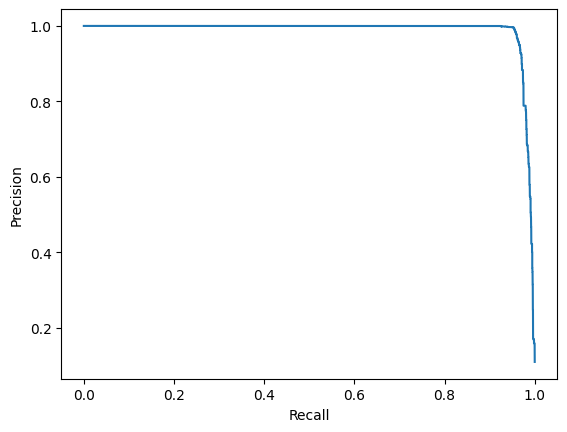

In [30]:
# XGBoost
Pre,Rec,th=precision_recall_curve(y_test_nov_dec,probas_pred=champ_model.predict_proba(X_test_nov_dec)[:,-1])
optimal_proba_cutoff = sorted(list(zip(np.abs(Pre - Rec),th)), key=lambda i: i[0], reverse=True)[0][1]
thres_dict_prc_3["XGB"]=optimal_proba_cutoff
print("XGB threshold :", optimal_proba_cutoff)
plt.figure()
disp = PrecisionRecallDisplay(precision=Pre, recall=Rec)
disp.plot()
#plt.plot(Pre, Rec, marker=".")
plt.show()

In [0]:
from sklearn.metrics import precision_recall_curve,PrecisionRecallDisplay

XG Boost threshold : 0.04271737


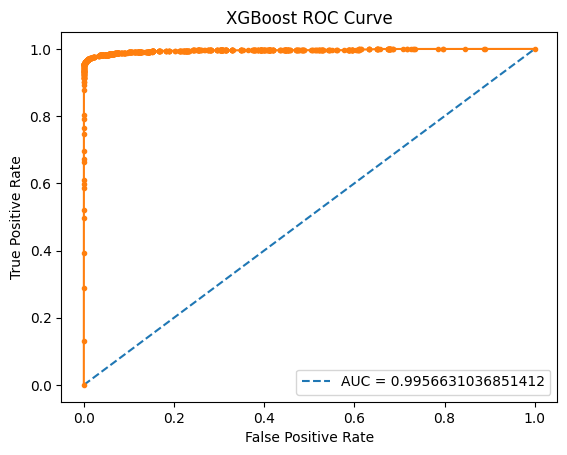

In [32]:
#XG Boost
from sklearn.metrics import roc_auc_score,roc_curve
thresh_dict_4={}
predicted_proba=champ_model.predict_proba(X_test_nov_dec)
FPR, TPR, proba = roc_curve(y_test_nov_dec, predicted_proba[:, -1])
optimal_proba_cutoff = sorted(list(zip(np.abs(TPR - FPR), proba)), key=lambda i: i[0], reverse=True)[0][1]
thresh_dict_4["XG Boost"]=optimal_proba_cutoff
print("XG Boost threshold :", optimal_proba_cutoff)
plt.figure()
plt.plot([0,1], [0,1], linestyle="--",label=f"AUC = {roc_auc_score(y_test_nov_dec, predicted_proba[:, -1])}") # plot random curve
plt.plot(FPR, TPR, marker=".")
plt.title("XGBoost ROC Curve")
plt.ylabel("True Positive Rate")
plt.xlabel("False Positive Rate")
plt.legend(loc="lower right")
plt.show()


In [35]:
y_unseen_pred=[1 if i> 0.042 else 0 for i in  champ_model.predict_proba(X_test_dec)[:, 1] ]
print(classification_report(y_test_dec,y_unseen_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     22028
           1       0.93      0.58      0.72       357

    accuracy                           0.99     22385
   macro avg       0.96      0.79      0.86     22385
weighted avg       0.99      0.99      0.99     22385



In [36]:
y_unseen_pred=[1 if i> 0.5 else 0 for i in  champ_model.predict_proba(X_test_nov)[:, 1] ]
print(classification_report(y_test_nov,y_unseen_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     35616
           1       1.00      0.95      0.97      4353

    accuracy                           0.99     39969
   macro avg       0.99      0.98      0.99     39969
weighted avg       0.99      0.99      0.99     39969



In [0]:
y_unseen_pred=[1 if i> 0.19 else 0 for i in  re_xgb.predict_proba(X_test)[:, 1] ]
print(classification_report(y_test,y_unseen_pred))

# Feature Importance

In [0]:
X_4=X_train[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
y_4=df_train[["V_RESOLUTION"]]
cv_grid_xgb.best_params_={'class_weight': 'balanced', 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 75, 'reg_alpha': 5, 'reg_lambda': 0}
re_xgb=XGBClassifier(**cv_grid_xgb.best_params_)





re_xgb.fit(X_4,y_4)

fi_4 = pd.DataFrame({'Feature_names':X_4.columns,'Weight_Imp':list(re_xgb.get_booster().get_score(importance_type="weight").values())})
fi_4["Percent_Weight_Imp"]=[i/ sum(fi_4["Weight_Imp"].values) for i in fi_4["Weight_Imp"]]
fi_4.sort_values(by='Weight_Imp',ascending=False,inplace=True)
fig,ax=plt.subplots(nrows=2,ncols=1)
plt.sca(ax[0])
ax[0].bar(fi_4["Feature_names"],fi_4["Weight_Imp"])
plt.rc("xtick",labelsize=8)
plt.xticks(rotation=45)

plt.sca(ax[1])
ax[1].bar(fi_4["Feature_names"],fi_4["Percent_Weight_Imp"])
plt.rc("xtick",labelsize=8)
plt.xticks(rotation=45)

plt.gcf().set_size_inches(15, 5)
fig.tight_layout()
plt.show()


In [0]:
fi_4[["Feature_names",'Weight_Imp',"Percent_Weight_Imp"]]

# Feature Attribution

In [0]:
DOR : Used Lime for feature attribution on test data where we get feature and respective scores contributing in resolution.
    Removed the features whoose scores are negative & those features if dat for them is absent in V_REASON columns

In [34]:
model_path=os.path.join(folder_path,"finalized_model_(siamese & fuzzy(only_orginal_name)_data_enh.sav")
re_xgb=pickle.load(open(model_path,"rb"))

In [35]:
import lime
import lime.lime_tabular
import sklearn
from __future__ import print_function
from sklearn.datasets import load_iris
from sklearn.ensemble import RandomForestClassifier

In [38]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X_train.columns, class_names=y_train.unique(), discretize_continuous=False)

In [39]:
import numpy as np

#exp = explainer.explain_instance(X_test.loc[0], re_xgb.predict_proba,num_features=5,  top_labels=2)
#exp.show_in_notebook()
#exp.as_pyplot_figure(label=1)
#exp.as_map()
#df_test_nov.shape

In [0]:
# Feature Attribution on November Month

In [16]:
#[X_unseen.iloc[k,:].apply(lambda x: explainer.explain_instance(x, re_xgb.predict_proba, num_features=4, top_labels=2).as_list(label=int(df_test["V_PREDICTION"][k]))) for k in X_unseen.index ]


In [1]:
#df.loc[:,"Results"]=""

# df_test_nov.loc[:,"Results"]=[X_test_nov.iloc[k:k+1,:].apply(lambda x: explainer.explain_instance(x, re_xgb.predict_proba, num_features=5, top_labels=2).as_list(df_test_nov["V_PREDICTION"].loc[k]),axis=1) for k in X_test_nov.index]

In [52]:
folder_path=dataiku.Folder("Name Screening notebooks").get_path()
new_path=os.path.join(folder_path+"/lime_results","sid_nov_test_data_with_limeoutput.csv")
#df_test_nov.to_csv(new_path)
df_test_nov_res=pd.read_csv(new_path)

In [23]:
x=str(['0    (FINAL_DOB_MATCH', ' -0.11013297031435347)', ' (N_MATCH_SCORE', ' -0.0344092410993569)', ' (ID_score', ' -0.016845152221999254)', ' (SIAMESE_MATCH_SCORE', ' -0.006491522581559873)', ' (Final_Nysiis_bisim_score', ' -0.0005596676914002088)\ndtype: object'])

In [48]:
k=list(map((lambda x: x.strip()),re.sub("\'\d\s+|\'|\[|\]|\(|\)|\\\\ndtype: object\'","",x).split(",")))
for i in range(1,len(k),2):
    k[i]=ast.literal_eval(k[i])

In [132]:
df_test_nov_res["Results"].values

array(['0    [(FINAL_DOB_MATCH, -0.11013297031435347), (N_MATCH_SCORE, -0.0344092410993569), (ID_score, -0.016845152221999254), (SIAMESE_MATCH_SCORE, -0.006491522581559873), (Final_Nysiis_bisim_score, -0.0005596676914002088)]\ndtype: object',
       '1    [(FINAL_DOB_MATCH, -0.054440376341095525), (ID_score, -0.04789512067645185), (N_MATCH_SCORE, -0.039554006936976666), (SIAMESE_MATCH_SCORE, 0.0014384943917954637), (Final_Nysiis_bisim_score, -0.0005645195925607383)]\ndtype: object',
       '2    [(FINAL_DOB_MATCH, -0.05958058669141143), (N_MATCH_SCORE, -0.03209983537347528), (ID_score, -0.025167661064963796), (SIAMESE_MATCH_SCORE, -0.004480751866121994), (Final_Nysiis_bisim_score, -0.0030532261929791817)]\ndtype: object',
       ...,
       'Empty DataFrame\nColumns: [FINAL_DOB_MATCH, ID_score, SIAMESE_MATCH_SCORE, N_MATCH_SCORE, Final_Nysiis_bisim_score]\nIndex: []',
       'Empty DataFrame\nColumns: [FINAL_DOB_MATCH, ID_score, SIAMESE_MATCH_SCORE, N_MATCH_SCORE, Final_Nysiis_bisim_sc

In [44]:
l=[]
for i in df_test_nov_res["Results"].values:
    
        k=list(map((lambda x: x.strip()),re.sub("\d+\s+|\'|\[|\]|\(|\)|\\ndtype: object","",i).split(",")))
        print(k)

['FINAL_DOB_MATCH', '-0.11013297031435347', 'N_MATCH_SCORE', '-0.0344092410993569', 'ID_score', '-0.016845152221999254', 'SIAMESE_MATCH_SCORE', '-0.006491522581559873', 'Final_Nysiis_bisim_score', '-0.0005596676914002088']
['FINAL_DOB_MATCH', '-0.054440376341095525', 'ID_score', '-0.04789512067645185', 'N_MATCH_SCORE', '-0.039554006936976666', 'SIAMESE_MATCH_SCORE', '0.0014384943917954637', 'Final_Nysiis_bisim_score', '-0.0005645195925607383']
['FINAL_DOB_MATCH', '-0.05958058669141143', 'N_MATCH_SCORE', '-0.03209983537347528', 'ID_score', '-0.025167661064963796', 'SIAMESE_MATCH_SCORE', '-0.004480751866121994', 'Final_Nysiis_bisim_score', '-0.0030532261929791817']
['ID_score', '-0.06454171286611755', 'N_MATCH_SCORE', '-0.04279421896247225', 'FINAL_DOB_MATCH', '-0.00853851030174016', 'SIAMESE_MATCH_SCORE', '-0.003942381648564546', 'Final_Nysiis_bisim_score', '-0.0038076571246498103']
['ID_score', '-0.058355299040300755', 'FINAL_DOB_MATCH', '-0.04963617748215779', 'N_MATCH_SCORE', '-0.043

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['ID_score', '-0.049322436387393906', 'FINAL_DOB_MATCH', '-0.047849485221784026', 'N_MATCH_SCORE', '-0.038323485342855255', 'Final_Nysiis_bisim_score', '-0.0010549088188977923', 'SIAMESE_MATCH_SCORE', '-0.000399708136715183']
['FINAL_DOB_MATCH', '-0.08719297387008618', 'ID_score', '-0.047837551060750334', 'N_MATCH_SCORE', '-0.04350972619905563', 'SIAMESE_MATCH_SCORE', '-0.003138230622848866', 'Final_Nysiis_bisim_score', '0.002625808024075203']
['FINAL_DOB_MATCH', '-0.09942693471195696', 'ID_score', '-0.08150444993105996', 'N_MATCH_SCORE', '-0.06603053758782268', 'Final_Nysiis_bisim_score', '-0.0049536977266250925', 'SIAMESE_MATCH_SCORE', '0.003469969872406602']
['FINAL_DOB_MATCH', '-0.05516680890726558', 'ID_score', '-0.053222622244154826', 'N_MATCH_SCORE', '-0.04600174259058081', 'Final_Nysiis_bisim_score', '-0.0024960683430749926', 'SIAMESE_MATCH_SCORE', '-0.0001940451048191123']
['ID_score', '-0.06313479587429016', 'N_MATCH_SCORE', '-0.04075924594618676', 'FINAL_DOB_MATCH', '-0.010

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
for i in df_test_nov_res["Results"].values:
        k=list(map((lambda x: x.strip()),re.sub("\d\s+|\'|\[|\]|\(|\)|\\ndtype: object|Empty DataFrame\\n|\\nIndex:|Columns:\s+","",i).split(",")))
        print(k)

['FINAL_DOB_MATCH', '-0.11013297031435347', 'N_MATCH_SCORE', '-0.0344092410993569', 'ID_score', '-0.016845152221999254', 'SIAMESE_MATCH_SCORE', '-0.006491522581559873', 'Final_Nysiis_bisim_score', '-0.0005596676914002088']
['FINAL_DOB_MATCH', '-0.054440376341095525', 'ID_score', '-0.04789512067645185', 'N_MATCH_SCORE', '-0.039554006936976666', 'SIAMESE_MATCH_SCORE', '0.0014384943917954637', 'Final_Nysiis_bisim_score', '-0.0005645195925607383']
['FINAL_DOB_MATCH', '-0.05958058669141143', 'N_MATCH_SCORE', '-0.03209983537347528', 'ID_score', '-0.025167661064963796', 'SIAMESE_MATCH_SCORE', '-0.004480751866121994', 'Final_Nysiis_bisim_score', '-0.0030532261929791817']
['ID_score', '-0.06454171286611755', 'N_MATCH_SCORE', '-0.04279421896247225', 'FINAL_DOB_MATCH', '-0.00853851030174016', 'SIAMESE_MATCH_SCORE', '-0.003942381648564546', 'Final_Nysiis_bisim_score', '-0.0038076571246498103']
['ID_score', '-0.058355299040300755', 'FINAL_DOB_MATCH', '-0.04963617748215779', 'N_MATCH_SCORE', '-0.043

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['4397FINAL_DOB_MATCH', '-0.05627705320514732', 'ID_score', '-0.04454450760397257', 'N_MATCH_SCORE', '-0.04037089272710064', 'Final_Nysiis_bisim_score', '-0.004744219164862269', 'SIAMESE_MATCH_SCORE', '-0.0010486262624963627']
['4397ID_score', '-0.066655399864054', 'FINAL_DOB_MATCH', '-0.04756057678202992', 'N_MATCH_SCORE', '-0.04295929849334628', 'SIAMESE_MATCH_SCORE', '-0.0038169837291363593', 'Final_Nysiis_bisim_score', '-0.0016276075921213935']
['4397FINAL_DOB_MATCH', '-0.11886590058672297', 'ID_score', '-0.061302799880394096', 'N_MATCH_SCORE', '-0.05412349543902216', 'Final_Nysiis_bisim_score', '-0.012138795676444979', 'SIAMESE_MATCH_SCORE', '0.003450228813388506']
['4397ID_score', '-0.08240978859800173', 'FINAL_DOB_MATCH', '-0.05529948444250443', 'N_MATCH_SCORE', '-0.04656401906046065', 'SIAMESE_MATCH_SCORE', '-0.004721443640878518', 'Final_Nysiis_bisim_score', '-0.002633734328165102']
['4397ID_score', '-0.06774732267638063', 'N_MATCH_SCORE', '-0.04453589991507566', 'FINAL_DOB_M

In [53]:

l=[]
for i in df_test_nov_res["Results"].values:
        k=list(map((lambda x: x.strip()),re.sub("\d+\s+|\'|\[|\]|\(|\)|\\ndtype: object|Empty DataFrame\\n|\\nIndex:|Columns:\s+","",i).split(",")))
        l1=[]
        l2=[]
        for i in range(len(k)):
                try:
                    k[i]=float(k[i]) 
                    l1.append(k[i])
                except:
                    l2.append(k[i])
        l.append([l2,l1])
    
                                



In [54]:
df_test_nov_res[df_test_nov_res["Results"].astype(str).str.contains("5212")]["Results"]
df_test_nov_res.loc[25361,"Results"]

'52121    [(ID_score, 0.06415907458861729), (FINAL_DOB_MATCH, 0.0489574090854912), (N_MATCH_SCORE, 0.043702295071706795), (Final_Nysiis_bisim_score, 0.005121473565904529), (SIAMESE_MATCH_SCORE, -0.0013329068522787654)]\ndtype: object'

In [47]:
df_test_nov_res[df_test_nov_res["Results_copy"].astype(str).str.contains("5212ID_score")]["Results_copy"]

Series([], Name: Results_copy, dtype: object)

In [57]:
df_test_nov_res["Results"]=l

In [58]:
df_test_nov_res["Results"]=df_test_nov_res["Results"].apply(lambda x: [(i,j) for i,j in zip(x[0],x[1])])


In [59]:
df_test_nov_res["Results"].astype(str).value_counts()

[]                                                                                                                                                                                                                                  11706
[('FINAL_DOB_MATCH', -0.12544769557640442), ('ID_score', -0.11964189714452679), ('N_MATCH_SCORE', -0.0779049054789465), ('Final_Nysiis_bisim_score', -0.009408566007857904), ('SIAMESE_MATCH_SCORE', -0.0003603672233346561)]           1
[('FINAL_DOB_MATCH', -0.06560387571812341), ('N_MATCH_SCORE', -0.033927098916658245), ('ID_score', -0.02523994187546888), ('Final_Nysiis_bisim_score', -0.003134939305870431), ('SIAMESE_MATCH_SCORE', -0.0013350016682165834)]         1
[('FINAL_DOB_MATCH', -0.05261071513333454), ('ID_score', -0.051343385148616465), ('N_MATCH_SCORE', -0.04318269214881456), ('Final_Nysiis_bisim_score', -0.005701346039911921), ('SIAMESE_MATCH_SCORE', 0.0004643076362846896)]          1
[('FINAL_DOB_MATCH', -0.09549243332309869), ('N_MATCH_SCORE', -0

In [60]:
df_test_nov_res["V_REASON"]=df_test_nov_res.loc[:,"Results"].apply(lambda x:  list(set([i[0] if i[1]>0 else "" for i in x])))

In [61]:
df_test_nov_res["V_REASON"].astype(str).value_counts()

['']                                                                                                   12792
[]                                                                                                     11706
['', 'SIAMESE_MATCH_SCORE']                                                                             9486
['', 'SIAMESE_MATCH_SCORE', 'Final_Nysiis_bisim_score']                                                 1709
['', 'Final_Nysiis_bisim_score']                                                                        1703
['FINAL_DOB_MATCH', 'SIAMESE_MATCH_SCORE', 'ID_score', 'Final_Nysiis_bisim_score', 'N_MATCH_SCORE']     1250
['', 'FINAL_DOB_MATCH', 'ID_score', 'Final_Nysiis_bisim_score', 'N_MATCH_SCORE']                         962
['', 'FINAL_DOB_MATCH', 'SIAMESE_MATCH_SCORE', 'ID_score', 'N_MATCH_SCORE']                              172
['', 'N_MATCH_SCORE', 'ID_score', 'FINAL_DOB_MATCH']                                                     162
['', 'FINAL_DOB_MAT

In [67]:
#df_test_nov["V_REASON"].apply(lambda x:x.pop(( x.index(""))) if "" in x else x)
for i,row  in df_test_nov_res.iterrows():
    row["V_REASON"]=row["V_REASON"].remove("") if "" in row["V_REASON"]  else row["V_REASON"] 

In [68]:
df_test_nov_res["V_REASON"].astype(str).value_counts()

[]                                                                                                     24498
['SIAMESE_MATCH_SCORE']                                                                                 9486
['SIAMESE_MATCH_SCORE', 'Final_Nysiis_bisim_score']                                                     1709
['Final_Nysiis_bisim_score']                                                                            1703
['FINAL_DOB_MATCH', 'SIAMESE_MATCH_SCORE', 'ID_score', 'Final_Nysiis_bisim_score', 'N_MATCH_SCORE']     1250
['FINAL_DOB_MATCH', 'ID_score', 'Final_Nysiis_bisim_score', 'N_MATCH_SCORE']                             962
['FINAL_DOB_MATCH', 'SIAMESE_MATCH_SCORE', 'ID_score', 'N_MATCH_SCORE']                                  172
['N_MATCH_SCORE', 'ID_score', 'FINAL_DOB_MATCH']                                                         162
['FINAL_DOB_MATCH']                                                                                       18
['Final_Nysiis_bisi

In [69]:
df_test_nov_res["Results"]

0          [(FINAL_DOB_MATCH, -0.11013297031435347), (N_MATCH_SCORE, -0.0344092410993569), (ID_score, -0.016845152221999254), (SIAMESE_MATCH_SCORE, -0.006491522581559873), (Final_Nysiis_bisim_score, -0.0005596676914002088)]
1        [(FINAL_DOB_MATCH, -0.054440376341095525), (ID_score, -0.04789512067645185), (N_MATCH_SCORE, -0.039554006936976666), (SIAMESE_MATCH_SCORE, 0.0014384943917954637), (Final_Nysiis_bisim_score, -0.0005645195925607383)]
2         [(FINAL_DOB_MATCH, -0.05958058669141143), (N_MATCH_SCORE, -0.03209983537347528), (ID_score, -0.025167661064963796), (SIAMESE_MATCH_SCORE, -0.004480751866121994), (Final_Nysiis_bisim_score, -0.0030532261929791817)]
3          [(ID_score, -0.06454171286611755), (N_MATCH_SCORE, -0.04279421896247225), (FINAL_DOB_MATCH, -0.00853851030174016), (SIAMESE_MATCH_SCORE, -0.003942381648564546), (Final_Nysiis_bisim_score, -0.0038076571246498103)]
4         [(ID_score, -0.058355299040300755), (FINAL_DOB_MATCH, -0.04963617748215779), (N_MATCH_SCORE, -

In [0]:
df_test_nov_res[["Results","V_REASON"]].apply(lambda x: index(max([i[1] for i in x[0]])) if x[1]==[] else x[1],axis=1)


In [77]:
df_test_nov_res["V_REASON"]=df_test_nov_res[["Results","V_REASON"]].apply(lambda x: [[i[0] for i in x[0]][[j[1] for j in x[0]].index(max([i[1] for i in x[0]]))]] if x[1]==[] and len(x[0])>0 else x[1],axis=1)


In [80]:
df_test_nov_res["V_REASON"].astype(str).value_counts()

['SIAMESE_MATCH_SCORE']                                                                                17932
[]                                                                                                     11706
['Final_Nysiis_bisim_score']                                                                            5931
['SIAMESE_MATCH_SCORE', 'Final_Nysiis_bisim_score']                                                     1709
['FINAL_DOB_MATCH', 'SIAMESE_MATCH_SCORE', 'ID_score', 'Final_Nysiis_bisim_score', 'N_MATCH_SCORE']     1250
['FINAL_DOB_MATCH', 'ID_score', 'Final_Nysiis_bisim_score', 'N_MATCH_SCORE']                             962
['FINAL_DOB_MATCH', 'SIAMESE_MATCH_SCORE', 'ID_score', 'N_MATCH_SCORE']                                  172
['N_MATCH_SCORE', 'ID_score', 'FINAL_DOB_MATCH']                                                         162
['FINAL_DOB_MATCH']                                                                                      136
['Final_Nysiis_bisi

In [83]:
df_test_nov_res["V_REASON"]=df_test_nov_res[["V_REASON","FINAL_DOB_MATCH"]].apply(lambda x:x[0].pop([i[0] for i in x[0]].index("FINAL_DOB_MATCH")) if ((len(x[0])>0) and ("FINAL_DOB_MATCH" in [ i[0] for i in x[0]]) and (x[1]==-1)) else x[0],axis=1)
df_test_nov_res["V_REASON"]=df_test_nov_res[["V_REASON","ID_score"]].apply(lambda x:x[0].pop([i[0] for i in x[0]].index("ID_score")) if ((len(x[0])>0) and ("ID_score" in [ i[0] for i in x[0]]) and (x[1]==-1)) else x[0],axis=1)

In [0]:
# df_test.loc[:,"V_REASON_IDENTIFIERS"]=""
# l={'SIAMESE_MATCH_SCORE':"Name",'Final_Nysiis_bisim_score':"Name",'N_MATCH_SCORE':"Name",'FINAL_DOB_MATCH':"Date of Birth", 'ID_score':"ID"}
# for i,row in df_test.iterrows():
#     print(i,row["V_REASON"])
#     row["V_REASON_IDENTIFIERS"]=[list(l.values())[i] if list(l.keys())[i] in row["V_REASON"] else "" for i in  range(len(l.keys()))]
#     row["V_REASON_IDENTIFIERS"]=list(set(row["V_REASON_IDENTIFIERS"]))
#     if "" in row["V_REASON_IDENTIFIERS"]:
#         row["V_REASON_IDENTIFIERS"].remove("") 
#     print(i,row["V_REASON_IDENTIFIERS"])

In [0]:
# df_test.loc[:,"V_REASON_IDENTIFIERS"].astype(str).value_counts()

In [0]:
#df_test["Reason_comments"]=[X_unseen.iloc[k-1:k,:].apply(lambda x: explainer.explain_instance(x, re_xgb.predict_proba, num_features=4, top_labels=2).as_list(df_test["V_PREDICTION"].loc[k]),axis=1) for k in X_unseen.index]

In [84]:
#List for conversion from lime output(V_REASON) to V_REASON_IDENTIFIERS
#TH
l_th={'SIAMESE_MATCH_SCORE':"Full Legal Name",'Final_Nysiis_bisim_score':"Full Legal Name",'N_MATCH_SCORE':"Full Legal Name",'FINAL_DOB_MATCH':"Date of Birth", 'ID_score':"ID number" }

# FP
l_fp={'SIAMESE_MATCH_SCORE':"Full Legal Name",
      'Final_Nysiis_bisim_score':"Full Legal Name_Name Does Not Sound Similar" ,
      'N_MATCH_SCORE':"Full Legal Name",'FINAL_DOB_MATCH':"Date Of Birth", 'ID_score':"ID number"}

In [85]:
#inputs:V_REASON is column with LIME output (positive features only)
#      : V_RESOLUTION is column for prediction value.
def func(row):
 ret = []
 #print(type(row['V_REASON']))
 if type(row['V_REASON'])==str:
        row['V_REASON']  = ast.literal_eval(row['V_REASON'])
 elif type(row['V_REASON'])==float:
        row['V_REASON'] = []
 elif type(row['V_REASON'])==list:
        pass
 if type(row['V_REASON'])!=float:
    if row['V_PREDICTION'] in (['TH','THNM','1',1]):
        #its a TH.
        ret = list(map(l_th.get,row['V_REASON']))
    elif row['V_PREDICTION'] in (['FP','0',0]):
        #its a FP
        ret= list(map(l_fp.get,row['V_REASON']))
 return(ret)    

In [87]:
df_test_nov_res['V_REASON_IDENTIFIERS'] = df_test_nov_res.apply(lambda x: func(x),axis=1) #change V_RESOLUTION to V_PREDICTION (0/1 prediction value)

In [0]:
df_test.columns

In [88]:
def comms_gen(x, pred_col_name):
    resolution = x[pred_col_name]
    keywrds = x['V_REASON_IDENTIFIERS']
    if type(keywrds)==str:
        keywrds  = ast.literal_eval(keywrds)
    elif type(keywrds)==float:
        keywrds = []
    elif type(keywrds)==list:
        pass
    if keywrds!=[]:
      keywrds = list(set(keywrds))
      if resolution in (['TH','THNM','1',1]):
        comm = 'Match '+', '.join(keywrds)
      elif resolution in (['FP','0',0]):
        comm = 'Mismatch '+', '.join(keywrds)
    else:
        comm = ''
    return(comm)

In [89]:
df_test_nov_res['generated_comms'] = df_test_nov_res.apply(lambda x: comms_gen(x, 'V_PREDICTION'), axis=1)#[['comments_revised','Results','V_REASON','V_REASON_IDENTIFIERS','V_COMMENTS']]

In [0]:
pd.set_option('display.max_colwidth', 1000)

In [0]:
df_test[df_test['V_REASON']=='[]'].shape
df_test[df_test.apply(lambda x: bool(x['generated_comms']), axis=1)].shape[0]-df_test.shape[0]

In [93]:
unseen_data_path=os.path.join(folder_path,"enhanced_data_nov_test_results_with_predsid_with_gen_comm.csv")
#df_test_nov[["N_PARTY_WATCHLIST_MATCH_ID","V_CUST_DOB","V_DOB","V_DOB_2", 'NER_V_AGE', 'NER_V_AGE_AS_OF_DATE', 'NER_V_DOB', 'NER_V_IDENTIFICATION_NO', "NER_V_PROFILE_NAME",'NER_V_PROFILE_NAME',"V_WATCHLIST_DOB_2","DOB_MATCH_1","DOB_MATCH_2","DOB_MATCH_3","DOB_MATCH_4","NER_DOB_MATCH_1","NER_DOB_MATCH_3","NER_DOB_MATCH_2","FINAL_DOB_MATCH","ALL_ALIAS_NAMES","ALL_PARTY_NAMES","ALL_WL_NAMES","V_RESOLUTION","V_COMMENTS",'N_PARTY_WATCHLIST_MATCH_ID',  'al_wl_ids', 'cust_id_all_sp_accom', 'trans_agg_v_id_type', 'final_sc',"score1"]].to_csv(unseen_data_path)

In [96]:
df_test_nov_res["V_PREDICTION"]

0        0
1        0
2        0
3        0
4        0
        ..
39964    1
39965    1
39966    1
39967    0
39968    1
Name: V_PREDICTION, Length: 39969, dtype: int64

In [100]:

# X_test_nov=df_test_nov_res[["FINAL_DOB_MATCH","ID_score","SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score']]
# y_test_nov=df_test_nov_res["V_RESOLUTION"]

In [9]:
# thresh_dict["XG Boost"]

In [101]:
# df_test_nov_res["V_PREDICTION"]=[1 if i> 0.19 else 0 for i in  champ_model.predict_proba(X_test_nov)[:,1]]
# #df_test_nov["AI_Match_score"]=[champ_model.predict_proba(X_test_nov.iloc[i:i+1,:]).flatten()[1] if df_test_nov.loc[i,"V_PREDICTION"]==1 else champ_model.predict_proba(X_test_nov.iloc[i:i+1,:]).flatten()[0] for i in df_test_nov.index]

In [103]:
# df_test_nov_res["AI_Match_score"]=[i for i  in champ_model.predict_proba(X_test_nov)[:,1]]
# df_test_nov_res["AI_Match_score"]=df_test_nov_res[["AI_Match_score","V_PREDICTION"]].apply(lambda x:x[0] if x[1]==1 else 1-x[0],axis=1)

In [105]:
df_test_nov_res[["N_PARTY_WATCHLIST_MATCH_ID","V_CUST_DOB","V_DOB","V_DOB_2","V_AGE","V_AGE_AS_OF_DATE", 'NER_V_AGE', 'NER_V_AGE_AS_OF_DATE', 'NER_V_DOB',"NER_WATCHLIST_DOB","V_WATCHLIST_DOB_2","DOB_MATCH_1","DOB_MATCH_2","DOB_MATCH_3","DOB_MATCH_4","NER_DOB_MATCH_1","NER_DOB_MATCH_2","NER_DOB_MATCH_3","FINAL_DOB_MATCH","ALL_ALIAS_NAMES","ALL_PARTY_NAMES","ALL_WL_NAMES","NER_V_PROFILE_NAME",'N_PARTY_WATCHLIST_MATCH_ID',  'al_wl_ids', "NER_V_IDENTIFICATION_NO",'cust_id_all_sp_accom', 'trans_agg_v_id_type', 'final_sc',"SIAMESE_MATCH_SCORE","N_MATCH_SCORE", 'Final_Nysiis_bisim_score',"FINAL_DOB_MATCH","ID_score","V_RESOLUTION", "V_PREDICTION","AI_Match_score","V_COMMENTS","V_BIOGRAPHY","V_REASON","Results","generated_comms"]].to_csv(unseen_data_path)

In [92]:
df_test_nov_res.head()

,Unnamed: 0,Unnamed: 0.1,N_PARTY_WATCHLIST_MATCH_ID,V_UCIF_ID,V_SCREENING_ID,N_WATCHLIST_PROFILE_ID,N_MATCH_SCORE,V_WATCHLIST_PARTY_NAME,V_INFO_SOURCE,V_WL_STATUS_CODE,D_DT_OF_SCREENING,V_COMMENTS,N_WORKFLOW_ID,F_RECENT_MATCH,V_RESOLUTION,V_REASON,F_DELTA_MATCH,D_CREATED_DTM,V_CREATED_BY,D_UPDATED_DTM,V_UPDATED_BY,N_SCREENING_VERSION,V_COUNTRY_OF_ONBOARDING,V_UCIF_ID_1,V_PARTY_CLASS,V_PARTY_TYPE,V_REGD_PARTY_NAME,V_ALIAS_NAME,V_GENDER,V_PARTY_FIRST_NAME,V_PARTY_MID_NAME,V_PARTY_LST_NAME,D_INCORPORATION_DATE,V_COUNTRY_OF_INCORP,V_COUNTRY_OF_BIRTH,V_PREVIOUS_NAME_IMMEDIATE,V_PREVIOUS_NAME_1,V_PREVIOUS_NAME_2,D_DOB,D_DECEASED_DATE,F_DECEASED_FLAG,V_COUNTRY_OF_BIRTH_1,V_FATHERS_NAME,V_MOTHERS_NAME,V_CREATED_BY_1,D_CREATED_DTM_1,V_UPDATED_BY_1,D_UPDATED_DTM_1,F_DELETE_FLAG,F_UPDATE_FLAG,V_LEGAL_STRUCTURE,F_PEP_STATUS,F_FMLY_PEP_STATUS,V_PEP_BIOGRAPHY,V_PEP_RELATIONSHIP,V_PEP_NAME,V_UCIF_ID_1_1,V_COUNTRY_OF_ONBOARDING_1,V_PARTY_GROUP,V_CITIZENSHIP,V_DUAL_CITIZENSHIP,V_OCC_CODE,V_COUNTRY_PERM_RES,V_SCREENING_STATUS,V_SCREENING_ID_1,V_CREATED_BY_PL,D_CREATED_DTM_PL,V_UPDATED_BY_PL,D_UPDATED_DTM_1_1,F_DELETE_FLAG_1,F_UPDATE_FLAG_1,N_SCREENING_VERSION_1,V_EMPLOYER_NAME,D_LAST_SCREENING_DATE,V_RACE,V_PARTY_CLASS_LEGACY,V_TITLE,V_RESIDENT_STATUS,V_UCIF_ID_2,AGG_UNQ_DOC_ID,AGG_V_ID_TYPE,V_PRIM_PTY_UCIF_ID,AGG_SEC_PTY_UCIF_ID,V_RELATION_TYPE_CD,N_NUMBER_OF_SHARES,N_SHAREHOLDING_PERCENT,V_SEC_PARTY_NAME,N_WATCHLIST_PROFILE_ID_1,V_WATCHLIST_PROFILE_UID,V_PROFILE_TYPE,V_PROFILE_NAME,V_ALIASES,V_TITLE_1,V_DOB,V_DOI,V_NATIONALITY,V_COI,V_IDENTIFICATION_NO,V_IC_NO,V_PLACE_OF_BIRTH,V_GENDER_WL,V_PEP_POSITION,V_BIOGRAPHY,V_INFO_SOURCE_1,V_REMARK,V_WL_STATUS_CODE_1,V_STATUS,D_CREATED_DTM_2,D_UPDATED_DTM_2,V_CATEGORY,V_SUB_CATEGORY,V_LOCATION_DETAILS,V_AGE,V_AGE_AS_OF_DATE,D_DOB_2,V_CUST_DOB,V_DOB_2,V_WATCHLIST_DOB_2,FINAL_WATCHLIST_DOB,DOB_MATCH,DOB_MATCH_1,DOB_MATCH_2,XYZ,XYZ_2,DOB_MATCH_3,DOB_MATCH_4,FINAL_DOB_MATCH,NER_V_AGE,NER_V_AGE_AS_OF_DATE,NER_V_DOB,NER_V_IDENTIFICATION_NO,NER_V_PROFILE_NAME,NER_V_PROFILE_NAME.1,NER_WATCHLIST_DOB,NER_V_DOB_2,NER_DOB_MATCH_1,NER_DOB_MATCH_2,NER_DOB_MATCH_3,al_wl_ids,cust_id_all_sp_accom,trans_agg_v_id_type,final_sc,ID_score,ALL_ALIAS_NAMES,ALL_PARTY_NAMES,ALL_WL_NAMES,SIAMESE_MATCH_SCORE,Final_Nysiis_bisim_score,V_PREDICTION,AI_Match_score,Results,Results_copy,V_REASON_IDENTIFIERS,generated_comms
0,0,0,7930354,80675228,5416938,15616564,94.0,Md Zahirul ISLAM,ANEWS,76,2023-10-06 00:00:00,Mismatch Full Legal Name – Name Does Not Sound Similar.,NaN,N,0,[Final_Nysiis_bisim_score],N,2023-10-06 21:33:39,d70a56b3-e243-41a8-b019-feccb140e24c,2023-11-30,80006682,1.0,MYS,80675228,I,11000.0,MD ZAHIDUL ISLAM,NaN,M,NaN,NaN,NaN,NaN,NaN,BGD,NaN,NaN,NaN,"['1996', '06', '15']",NaN,N,BGD,NaN,NaN,0000D55A,2019-02-28 15:27:12,NaN,1900-01-01 00:00:00,N,NaN,INDV,NaN,NaN,NaN,NaN,NaN,80675228,MYS,EXT,BGD,NaN,9310,BGD,NOHITS,5416938,0000D55A,2019-02-28 15:27:12,00151883,2023-12-02 14:33:34.377972,N,NaN,1,AZMAS MAJU ENT SDN BHD,2021-11-29 00:00:00,OTH,501.0,MRR,NONR,80675228.0,['BP0630468'],['PASS'],NaN,NaN,NaN,NaN,NaN,NaN,15616564,7360364,I,Md Zahirul ISLAM,"FAROOQ,Omar",NaN,[[]],NaN,BANGLADESH,NaN,NaN,NaN,NaN,M,NaN,"[BIOGRAPHY] Militant {Operations} of Jamatul Ansar fil Hindal Sharqiya. [IDENTIFICATION] Abdul Latif (father). Resident of Langalkot upazila in Cumilla. [FUNDING] To be determined. [REPORTS] Feb 2023 - reportedly detained by Rapid Action Battalion (RAB) for involvement in terrorism-related activities.[NONCONVICTION TERROR CATEGORY NOTICE] This category includes information about individuals who are reportedly being investigated for, or have been arrested or charged on suspicion of, involvement in terrorism or terror related activities. The category also includes individuals or entities identified on national or internationally recognised banning, warning or wanted lists as allegedly connected to terrorism or individuals who are reportedly connected to an organisation included on any national or international terrorism li

## UN Resolved & Comments & Resolution Update

In [0]:
df_test["V_PREDICTION"]=df_test[["V_PREDICTION","FINAL_DOB_MATCH","ID_score","Final_Nysiis_bisim_score"]].apply(lambda x: -1 if x[1]==-1 and x[2]==-1 and x[3]>0.75 else x[0],axis=1)

z=df_test[df_test["V_PREDICTION"]==-1].index

In [0]:
df_test.loc[z,"Results"]=""
df_test.loc[z,"V_REASON"]=""

In [0]:
df_test["V_PREDICTION"].replace({0:"FP",1:"TH",-1:"UR"},inplace=True)

In [0]:
df_test["V_PREDICTION"].value_counts()